In [1]:
import gym
import numpy as np
import math
import matplotlib.pyplot as plt
import random
from numpy import random
class UAVenv(gym.Env):
    metadata = {'render.modes': ['human']}
    # Fixed Input Parameters
    NUM_USER = 100   # Number of ground user
    NUM_UAV = 5   # Number of UAV
    MAX_USER_COVER_EACH_UAV = [10, 15, 20, 25, 30] # Maximum Capacity for each UAV to cover users
    COVERAGE_XY = 1000
    grid_space = 50
    GRID_SIZE = int(COVERAGE_XY / grid_space)

    UAV_HEIGHT = 350
    THETA = 60 * math.pi / 180 # In radian

    ## Polar to Cartesian and vice versa
    def pol2cart(r,theta):
        x = r * np.cos(theta)
        y = r * np.sin(theta)
        return (x, y)

    def cart2pol(x, y):
        theta = np.arctan2(y, x)
        r = np.hypot(x, y)
        return r, theta

    ############################################################################
    ##     User Distribution // Hotspots with Uniform Distribution      ##
    ############################################################################

    #SEED = 1
    #random.seed(SEED)

    #HOTSPOTS = np.array([[300, 300], [800, 800], [300, 800], [800, 300]])

    #USER_DIS = [15, 20, 30, 25]
    #USER_LOC = np.zeros((sum(USER_DIS) + 10, 3)) # +10 for 10 additional random users

    #start_index = 0
    #for i in range(len(HOTSPOTS)):
        #for j in range(start_index, start_index + USER_DIS[i]):
            #temp_loc_r = random.uniform(-(1/5)*COVERAGE_XY, (1/5)*COVERAGE_XY)
            #temp_loc_theta = random.uniform(0, 2*math.pi)
            #temp_loc = pol2cart(temp_loc_r, temp_loc_theta)
            #temp_loc_1, temp_loc_2 = temp_loc
            #temp_loc_1 = temp_loc_1 + HOTSPOTS[i, 0]
            #temp_loc_2 = temp_loc_2 + HOTSPOTS[i, 1]
            #USER_LOC[j, :] = [temp_loc_1, temp_loc_2, i]
        #start_index += USER_DIS[i]

    #temp_loc = np.random.uniform(low=0, high=COVERAGE_XY, size=(10, 2))
    #USER_LOC[start_index:start_index+10, :2] = temp_loc
    #USER_LOC[start_index:start_index+10, 2] = 4 # Assign region 4 to scattered users
    #np.savetxt('UserLocationNew.txt', USER_LOC, fmt='%.3e', delimiter=' ', newline='\n')

    #print(USER_LOC)
    # Plot users with different colors for different regions
    #fig = plt.figure(figsize=(6, 6), dpi=200)
    #gs = GridSpec(1, 1, figure=fig)
    #ax = fig.add_subplot(gs[0:1, 0:1])
    #ax.cla()
    #for i in range(USER_LOC.shape[0]):
        #if USER_LOC[i, 2] == 0:
            #co = '#CB4335'
        #elif USER_LOC[i, 2] == 1:
            #co = '#7D3C98'
        #elif USER_LOC[i, 2] == 2:
            #co = '#2E86C1'
        #elif USER_LOC[i, 2] == 3:
            #co = '#28B463'
        #elif USER_LOC[i, 2] == 4:
            #co = '#F1C40F'

        #ax.scatter(USER_LOC[i, 0], USER_LOC[i, 1], c=co, marker='o')
    USER_LOC = np.loadtxt('UserLocationNew.txt', delimiter=' ').astype(np.int64)

    def __init__(self):
        super(UAVenv, self).__init__()
        # Five different action for the movement of each UAV
        # 0 = Right, 1 = Left, 2 = straight, 3 = back, 4 = Hover
        # Position of the UAV in space // X and Y pos
        self.u_loc = self.USER_LOC
        self.state = np.zeros((self.NUM_UAV, 4))
        self.num_epochs = 0
        self.state[:,:2] = np.zeros((self.NUM_UAV, 2), dtype=np.int32)
        self.state[:,2] = np.zeros((self.NUM_UAV,), dtype=np.float32)
        self.state[:,3] = np.zeros((self.NUM_UAV,), dtype=np.float32)
        self.flag = [0, 0, 0, 0, 0]
        self.coverage_radius = self.UAV_HEIGHT * np.tan(self.THETA / 2)


    def step(self, action, reward):
        # Take the action
        # Execution of one step within the environment
        # Deal with out of boundaries conditions
        isDone = False
        # Calculate the distance of every users to the UAV BS and organize as a list

        dist_u_uav = np.zeros(shape=(self.NUM_UAV, self.NUM_USER))
        step_size = 2 if num_epochs < 50 else 1

        for i in range(self.NUM_UAV):
            temp_x = self.state[i, 0]
            temp_y = self.state[i, 1]
            #print("Before action: ", (temp_x, temp_y))
            # one step action
            if action[i] == 0:
                self.state[i, 0] = self.state[i, 0] + step_size
            elif action[i] == 1:
                self.state[i, 0] = self.state[i, 0] - step_size
            elif action[i] == 2:
                self.state[i, 1] = self.state[i, 1] + step_size
            elif action[i] == 3:
                self.state[i, 1] = self.state[i, 1] - step_size
            elif action[i] == 4:
                pass
            else:
                print("Error Action Value")

            # Take boundary condition into account // Individual flag for punishing the UAV
            if self.state[i,0] < 0 or self.state[i,0] > self.GRID_SIZE or self.state[i, 1] < 0 or self.state[i,1] > self.GRID_SIZE:
                self.state[i, 0] = temp_x
                self.state[i, 1] = temp_y
                self.flag[i] = 1     # Later penalize the reward value based on the flag
            else:
              self.flag[i] = 0

            #print("After action: ", (self.state[i, 0], self.state[i, 1]))


            # Calculation of the distance value for all UAV and User
            for l in range(self.NUM_USER):
                dist_u_uav[i, l] = math.sqrt((self.u_loc[l, 0] - (self.state[i, 0] * self.grid_space)) ** 2 + (self.u_loc[l, 1] -(self.state[i, 1] * self.grid_space)) ** 2)


        ######################
        ## Final Algorithm  ##
        ######################

        # User association to the UAV based on the distance value. First do a single sweep by all
        # the Users to request to connect to the closest UAV After the first sweep is complete the UAV will admit a
        # certain Number of Users based on capacity. In the second sweep the User will request to the UAV
        # that is closest to it and UAV will admit the User if UAV has not reached its maximum capacity.

        # Connection request is a np array matrix that contains UAV Number as row and
        # User Number Connected to it on Columns and is stored in individual UAV to keep track of the
        # User requesting to connect
        # Initialize the connection_request table with zeros
        connection_request = np.zeros(shape=(self.NUM_UAV, self.NUM_USER), dtype="int")

        # For each user, find the closest UAV
        for i in range(self.NUM_USER):
            close_uav = np.argmin(dist_u_uav[:,i]) # Closest UAV index
            # If the distance between the UAV and user is within the coverage radius, then send the connection request
            if dist_u_uav[close_uav, i] <= self.coverage_radius:
                connection_request[close_uav, i] = 1 # Send the connection request

        # User association flag to keep track of which users are associated with which UAVs
        user_asso_flag = np.zeros(shape=(self.NUM_UAV, self.NUM_USER), dtype="int")
        # Total number of users associated with each UAV
        uav_asso_count = np.zeros(shape=(self.NUM_UAV,1), dtype="int")


        # Allocate users to UAVs
        for i in range(self.NUM_UAV):
        # Find the users who have sent the connection request to the current UAV
            temp_user = np.where(connection_request[i, :] == 1)
            # Sort the users based on their distance from the UAV
            temp_user_distance = dist_u_uav[i, temp_user]
            temp_user_sorted = np.argsort(temp_user_distance)
            # Convert temp_user to np_array so that it can be indexed easily
            temp_user = np.array(temp_user)
            # Get the actual index of the users who have sent the connection request, sorted based on the distance from the UAV
            temp_user_actual_idx = temp_user[0, temp_user_sorted]
            # Set the user association flag for each UAV and closest user
            for user_index in temp_user_actual_idx[0]:
                # If the number of users associated with the UAV is less than the maximum number of users it can cover, then allocate the user
                if uav_asso_count[i] < self.MAX_USER_COVER_EACH_UAV[i]:
                  user_asso_flag[i, user_index] = 1
                  uav_asso_count[i] += 1
                else:
                    break


        # Perform a second sweep to allocate any remaining unallocated users to the closest UAV that is within range and has not reached its maximum user capacity
        # If so cover the user and set the User association flag bit of that user to 1
        for j in range(self.NUM_USER):
            if not(np.any(user_asso_flag[:, j] != 0)):
                close_uav_id = dist_u_uav[:, j]
                close_uav_id = [i[0] for i in sorted(enumerate(close_uav_id), key=lambda x: x[1])]
                for close_id in close_uav_id:
                    if dist_u_uav[close_id, j] <= self.coverage_radius:
                        if np.sum(user_asso_flag[close_id]) < self.MAX_USER_COVER_EACH_UAV[close_id]:
                            uav_asso_count[close_id] += 1
                            user_asso_flag[close_id, j] = 1
                            break

        for i in range(self.NUM_UAV):
            uav_capacity = self.MAX_USER_COVER_EACH_UAV[i]
            sum_user_assoc_uav = np.sum(np.sum(user_asso_flag, axis = 1)[i])

            coverage_rate_uav = sum_user_assoc_uav / uav_capacity

        self.state[:, 2] = coverage_rate_uav

        overall_coverage_rate = np.sum(uav_asso_count) / self.NUM_USER
        #print(overall_coverage_rate)
        self.state[:, 3] = np.ones(self.NUM_UAV) * overall_coverage_rate


        # Calculation of reward function
        sum_user_assoc = np.sum(user_asso_flag, axis=1)
        reward_ind = np.zeros(np.size(sum_user_assoc))
        reward = 0

        for k in range(self.NUM_UAV):
            sum_user_assoc_temp = np.copy(sum_user_assoc)

            if self.flag[k] != 0:
                # Only penalized if the respective UAV is out of bound
                sum_user_assoc_temp[k] -= 2
                isDone = True

            if self.state[k, 3] > 0.8:  # Assuming coverage rate is stored in the 4th column
                sum_user_assoc_temp[k] += 3

            if self.state[k, 3] < 0.8:
                sum_user_assoc_temp[k] -= 5

            reward_ind[k] = np.average(sum_user_assoc_temp)

        reward = np.copy(reward_ind)



        # Return of obs, reward, done, info
        return np.copy(self.state).reshape(1, self.NUM_UAV * 4), reward, isDone, "empty", np.sum(sum_user_assoc)

    # Render Function
    def render(self, ax, mode='human', close=False):
        # Implement viz
        if mode == 'human':

            fig = plt.figure(figsize=(6, 6), dpi=200)
            gs = GridSpec(1, 1, figure=fig)
            ax = fig.add_subplot(gs[0:1, 0:1])
            ax.cla()
            position = self.state[:, 0:2] * self.grid_space
            # Define colors for different regions
            region_colors = {
                0: '#CB4335',
                1: '#7D3C98',
                2: '#2E86C1',
                3: '#28B463',
                4: '#F1C40F'
            }

            # Define markers for different UAVs
            markers = ['x', 'p', 's', '^', 'd']
            # Plot users with label "Users" for all regions
            for region, color in region_colors.items():
                ax.scatter(self.u_loc[self.u_loc[:,2] == region, 0], self.u_loc[self.u_loc[:,2] == region, 1], c = color, marker='o', label = "Users")
            #ax.scatter(position[:, 0], position[:, 1], c = '#000000', marker='x', label = "UAV")
            for i, (x, y) in enumerate(position):
                cc = plt.Circle((x, y), self.coverage_radius, alpha=0.1)
                ax.set_aspect(1)
                ax.add_artist(cc)
                ax.scatter(x, y, c='black', marker=markers[i], label=f"UAV {i+1}")
            #ax.legend()
            plt.pause(0.5)
            plt.xlim(-50, 1050)
            plt.ylim(-50, 1050)
            plt.draw()


    def reset(self):
        # reset out states
        self.state[:, 0:4] = [[0, 0, 0.0, 0.0], [0, 0, 0.0, 0.0], [0, 0, 0.0, 0.0], [0, 0, 0.0, 0.0], [0, 0, 0.0, 0.0]]
        return self.state

    def get_state(self):
        state_loc = np.zeros((self.NUM_UAV, 4))
        for k in range(self.NUM_UAV):
            state_loc[k, 0] = self.state[k, 0]
            state_loc[k, 1] = self.state[k, 1]
            state_loc[k, 2] = self.state[k, 2]
            state_loc[k, 3] = self.state[k, 3]
        return state_loc


FileNotFoundError: UserLocationNew.txt not found.

In [ ]:
# Extended version of render function to plot best state and final state of the UAVs
env=UAVenv()
from matplotlib import gridspec
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
import math

def final_render(state, remark):
    USER_LOC = np.loadtxt('UserLocationNew.txt', dtype=np.int32, delimiter=' ')
    u_loc = USER_LOC
    fig = plt.figure()
    gs = GridSpec(1, 1, figure=fig)
    ax = fig.add_subplot(gs[0:1, 0:1])
    grid_space = 100
    UAV_HEIGHT = 350
    THETA = 60 * math.pi / 180
    coverage_radius = UAV_HEIGHT * np.tan(THETA / 2)

    ax.cla()
    position = state[:, 0:2] * grid_space

    # Define colors for different regions
    region_colors = {
        0: '#CB4335',
        1: '#7D3C98',
        2: '#2E86C1',
        3: '#28B463',
        4: '#F1C40F'
    }

    # Define markers for different UAVs
    markers = ['x', 'p', 's', '^', 'd']
    # Plot users with label "Users" for all regions
    for region, color in region_colors.items():
        ax.scatter(u_loc[u_loc[:,2] == region, 0], u_loc[u_loc[:,2] == region, 1], c = color, marker='o', label = "Users")

    #ax.scatter(position[:, 0], position[:, 1], c = '#000000', marker='x', label = "UAV")
    for i, (x, y) in enumerate(position):
        cc = plt.Circle((x, y), coverage_radius, alpha=0.1)
        ax.set_aspect(1)
        ax.add_artist(cc)
        ax.scatter(x, y, c='black', marker=markers[i], label=f"UAV {i+1}")
    #ax.legend()
    if remark == "best":
        plt.title("Best state of UAV")
    elif remark == "final":
        plt.title("Final state of UAV")
    plt.pause(0.5)
    plt.xlim(-50, 1050)
    plt.ylim(-50, 1050)
    plt.show()

0
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1. ]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1.4]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1.4]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1.4]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1.4]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0.]]), array([-1. , -1.4, -1.4, -1. , -1.4]), True, 'empty', 0)
(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

/usr/local/lib/python3.10/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(


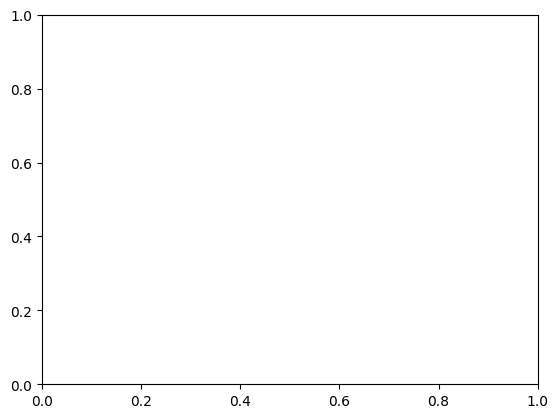

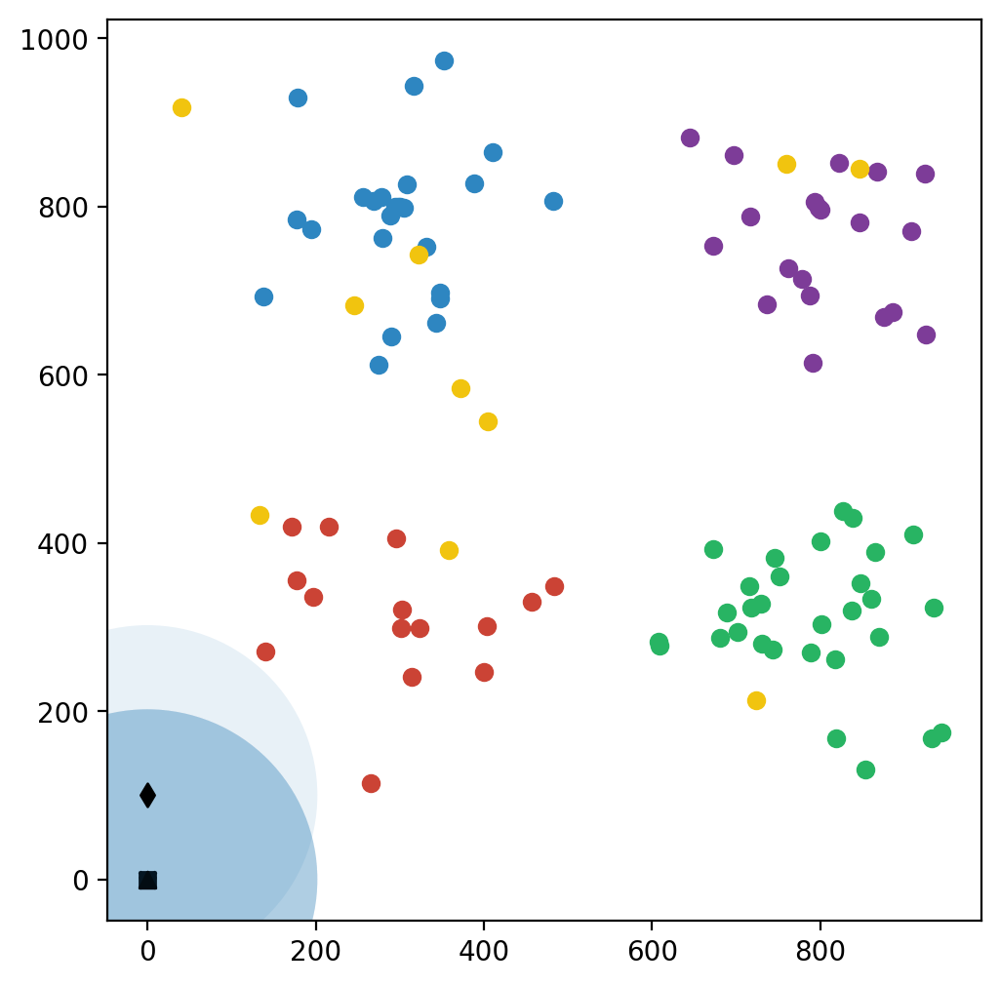

Number of user connected in  0  episode is:  0
1
2
3
4
5
6
7
8
9
10
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 3.  , 0.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[0. , 4. , 0. , 0.1, 2. , 2. , 0. , 0.1, 4. , 0. , 0. , 0.1, 4. ,
        0. , 0. , 0.1, 4. , 0. , 0. , 0.1]]), array([1., 1., 1., 1., 1.]), False, 'empty', 10)
(array([[0.  , 5.  , 0.  , 0.13, 3.  , 2.  , 0.  , 0.13, 5.  , 0.  , 0.  ,
        0.13, 5.  , 0.  , 0.  , 0.13, 5.  , 0.  , 0.  , 0.13]]), array([1.6, 1.6, 1.6, 1.6, 1.6]), False

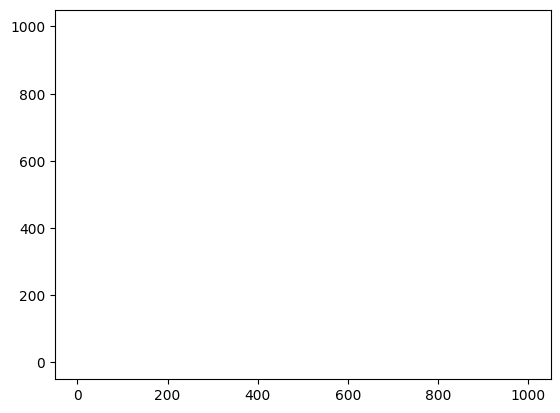

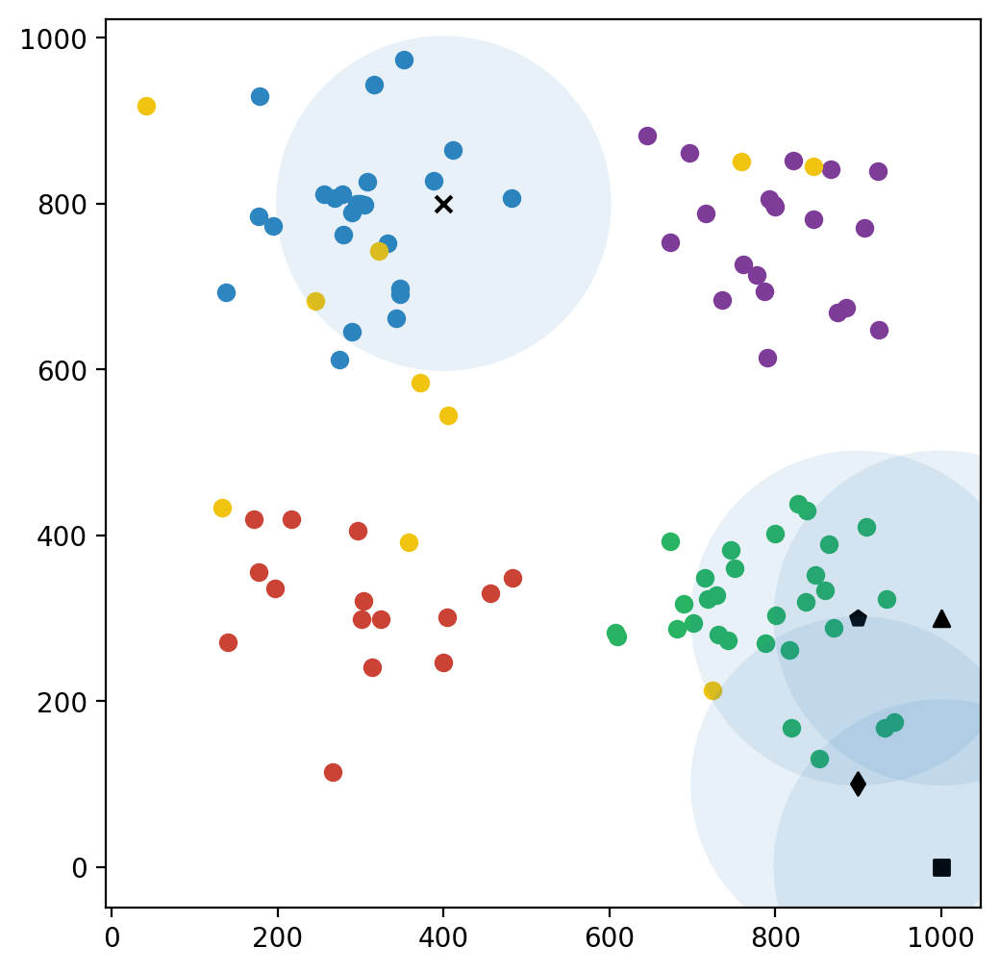

Number of user connected in  10  episode is:  29
11
12
13
14
15
16
17
18
19
20
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.  , 1.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.        , 3.        , 0.13333333, 0.12      , 3.        ,
        1.        , 0.13333333, 0.12      , 0.        , 4.        ,
        0.13333333, 0.12      , 4.        , 0.        , 0.13333333,
        0.12      , 2.        , 2.        , 0.13333333, 0.12      ]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array(

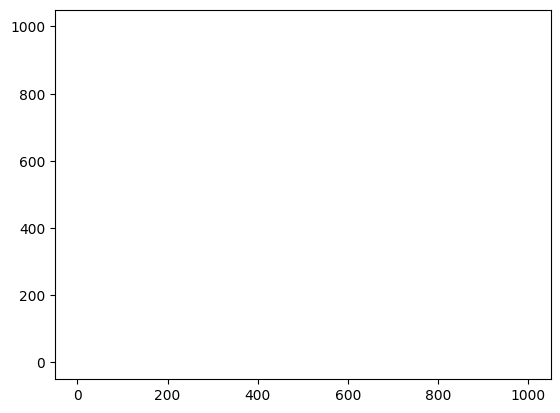

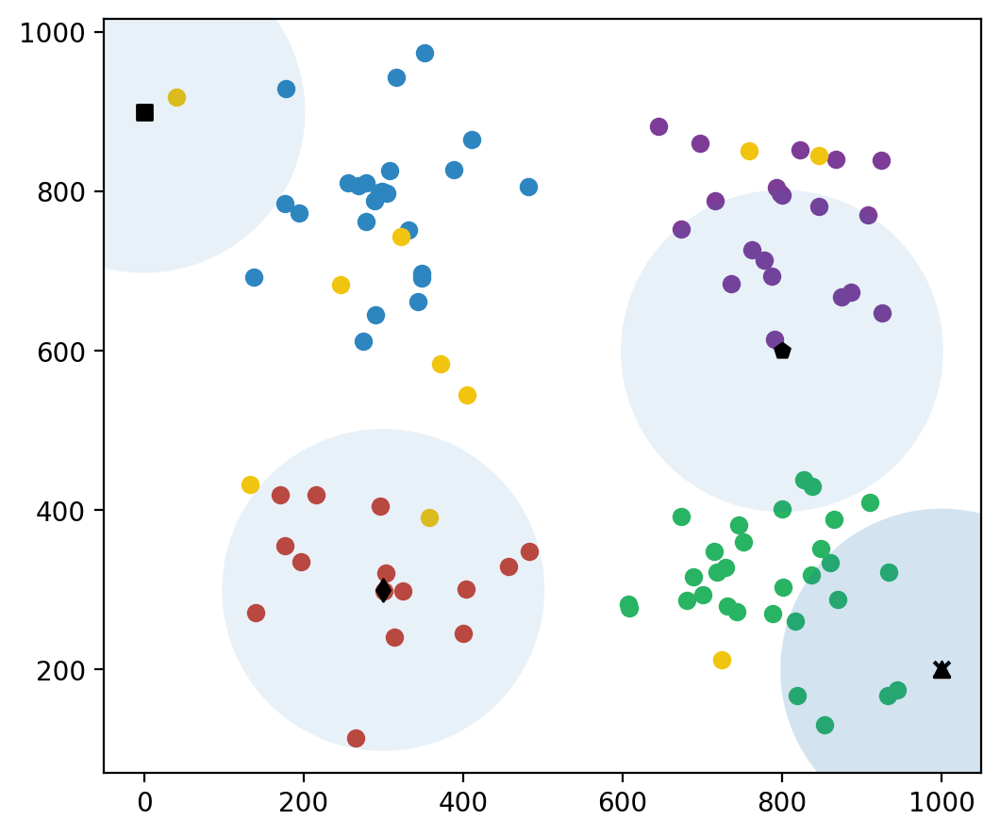

Number of user connected in  20  episode is:  42
21
22
23
24
25
26
27
28
29
30
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.1 , 0.06, 2.  , 1.  , 0.1 , 0.06, 0.  , 3.  , 0.1 ,
        0.06, 3.  , 0.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[4.        , 0.        , 0.16666667, 0.11      , 3.        ,
        1.        , 0.16666667, 0.11      , 0.        , 4.        ,
        0.16666667, 0.11      , 4.        , 0.        , 0.16666667,
        0.11      , 1.        , 3.        , 0.16666667, 0.11      ]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(a

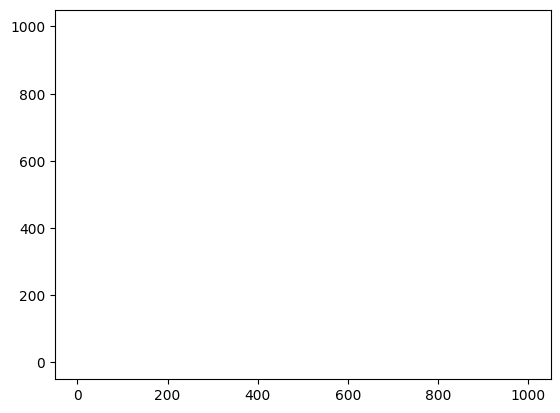

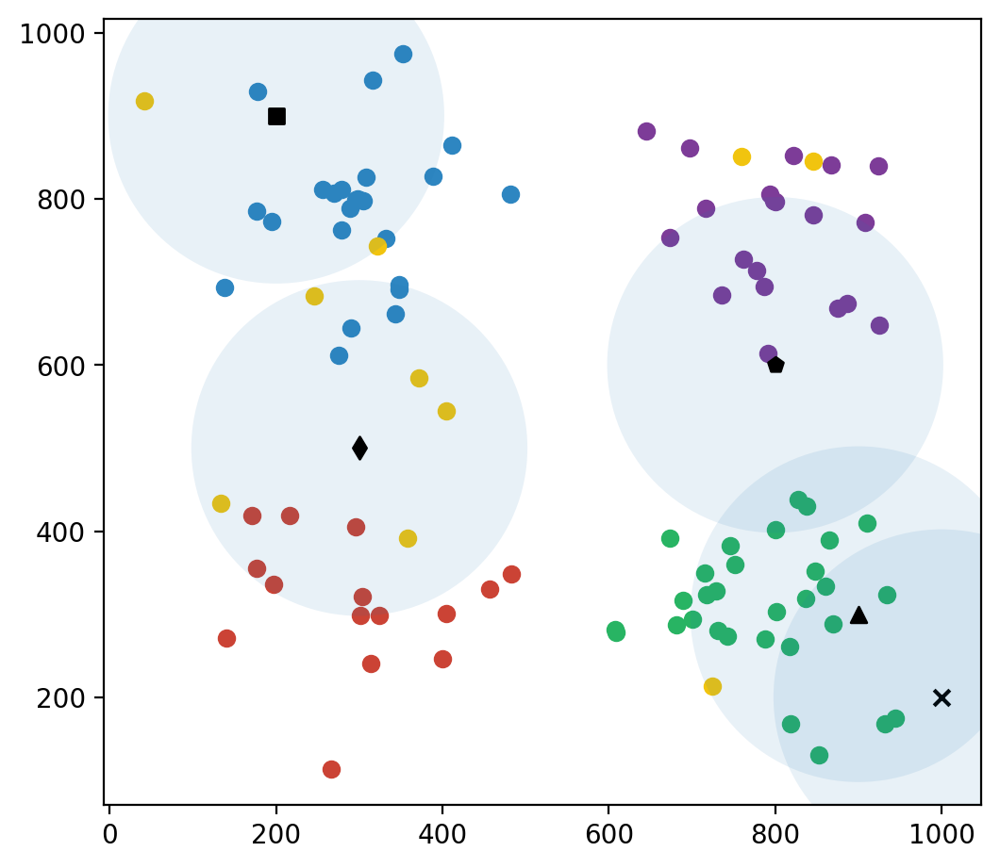

Number of user connected in  30  episode is:  73
31
32
33
34
35
36
37
38
39
40
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.        , 1.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 3.        , 0.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.  , 1.  , 0.2 , 0.11, 3.  , 1.  , 0.2 , 0.11, 3. 

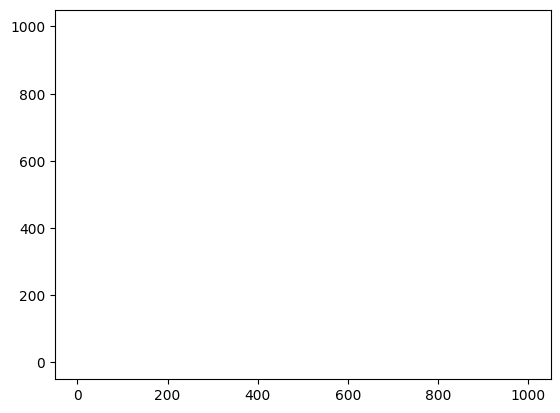

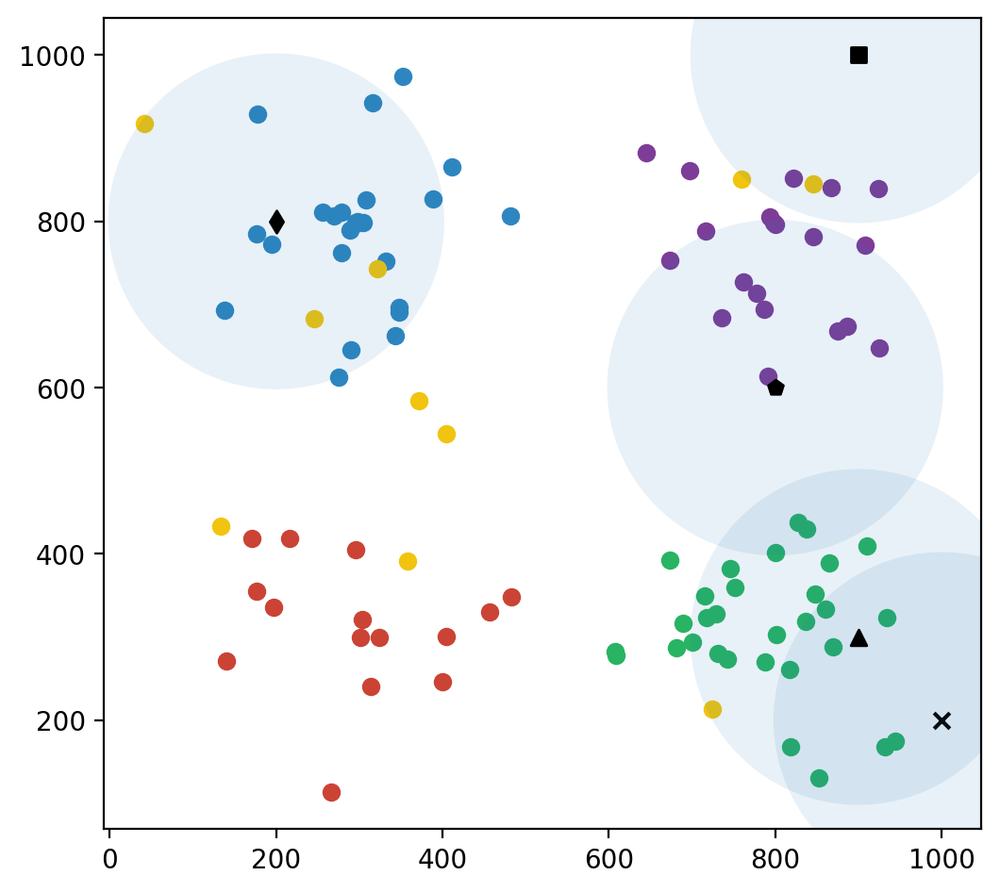

Number of user connected in  40  episode is:  66
41
42
43
44
45
46
47
48
49
50
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.        , 1.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.        , 2.        , 0.03333333, 0.06      , 2.        ,
        1.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 1.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3. 

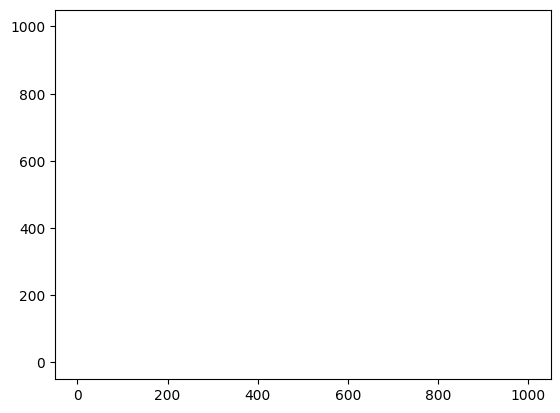

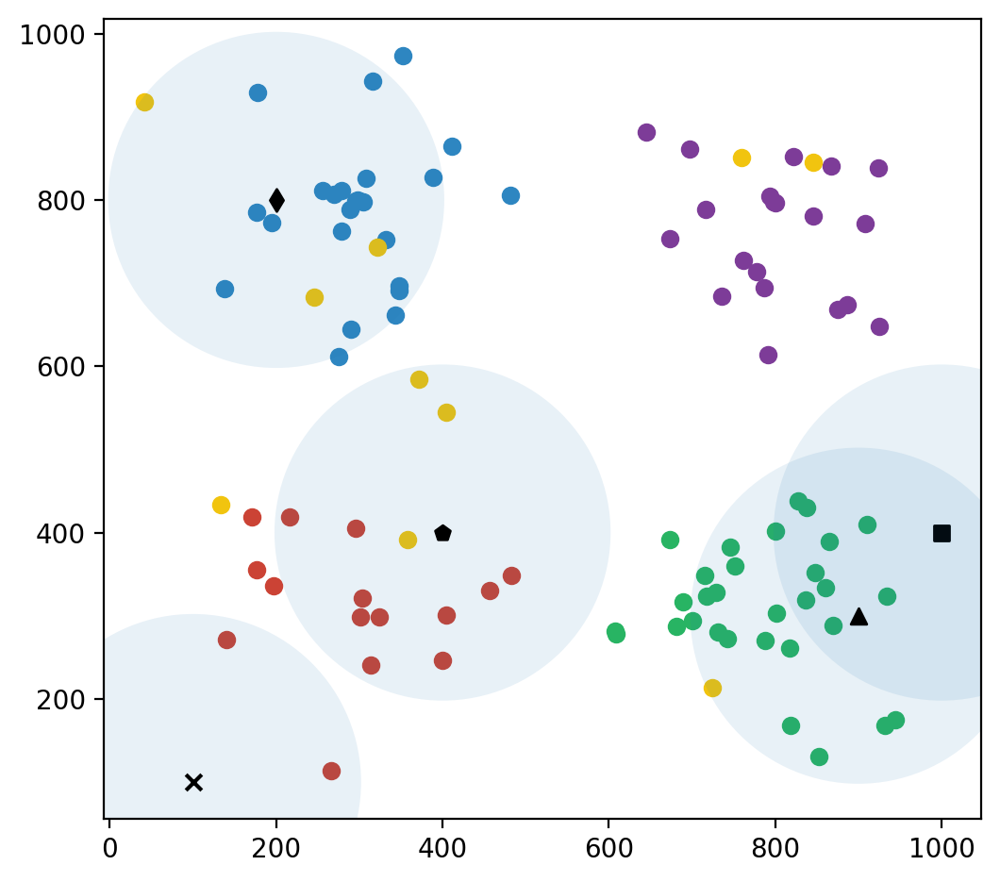

Number of user connected in  50  episode is:  65
51
52
53
54
55
56
57
58
59
60
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.        , 1.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 1.        , 1.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.        , 2.        , 0.03333333, 0.06      , 2.        ,
        1.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 2.        , 1.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3. 

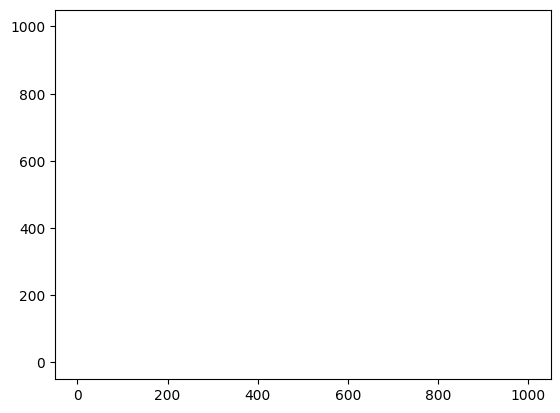

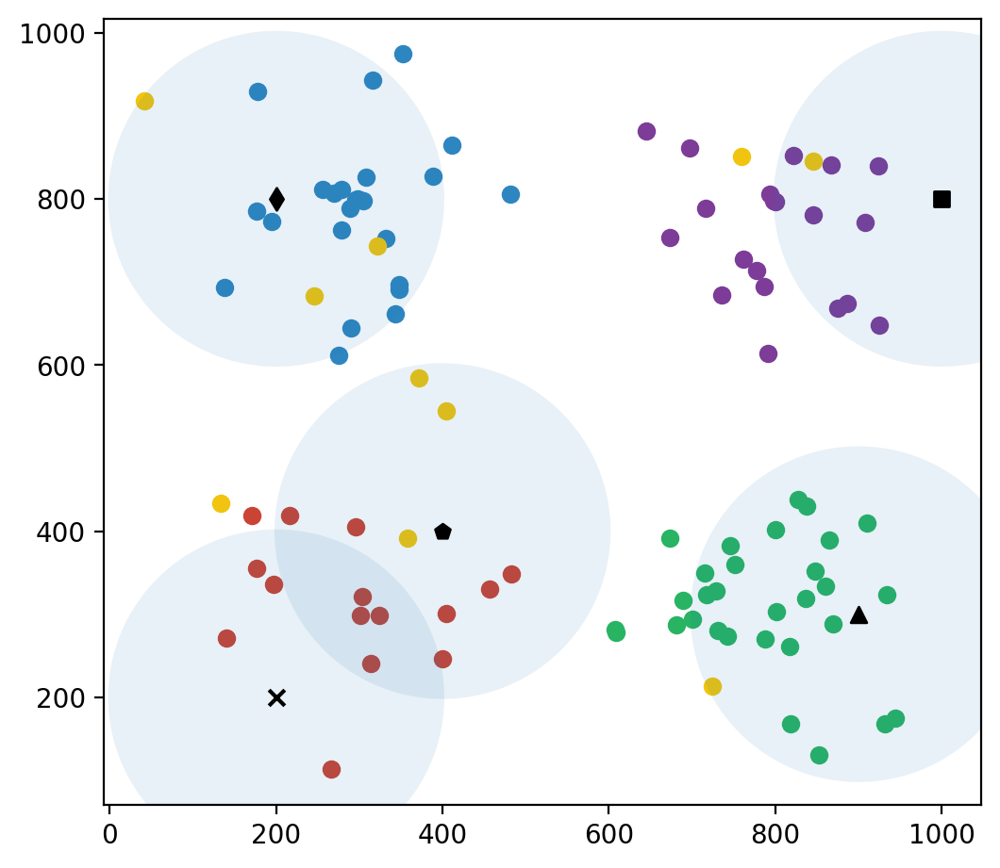

Number of user connected in  60  episode is:  77
61
62
63
64
65
66
67
68
69
70
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.        , 1.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 2.        , 1.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3. 

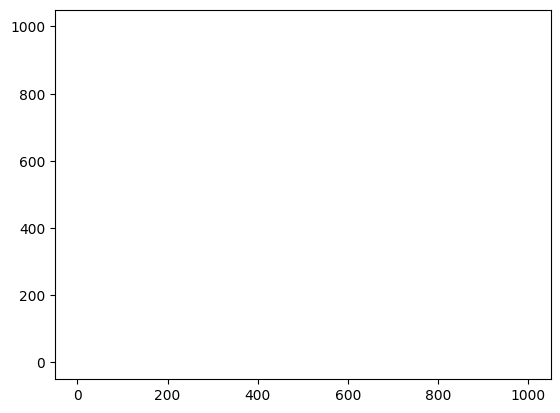

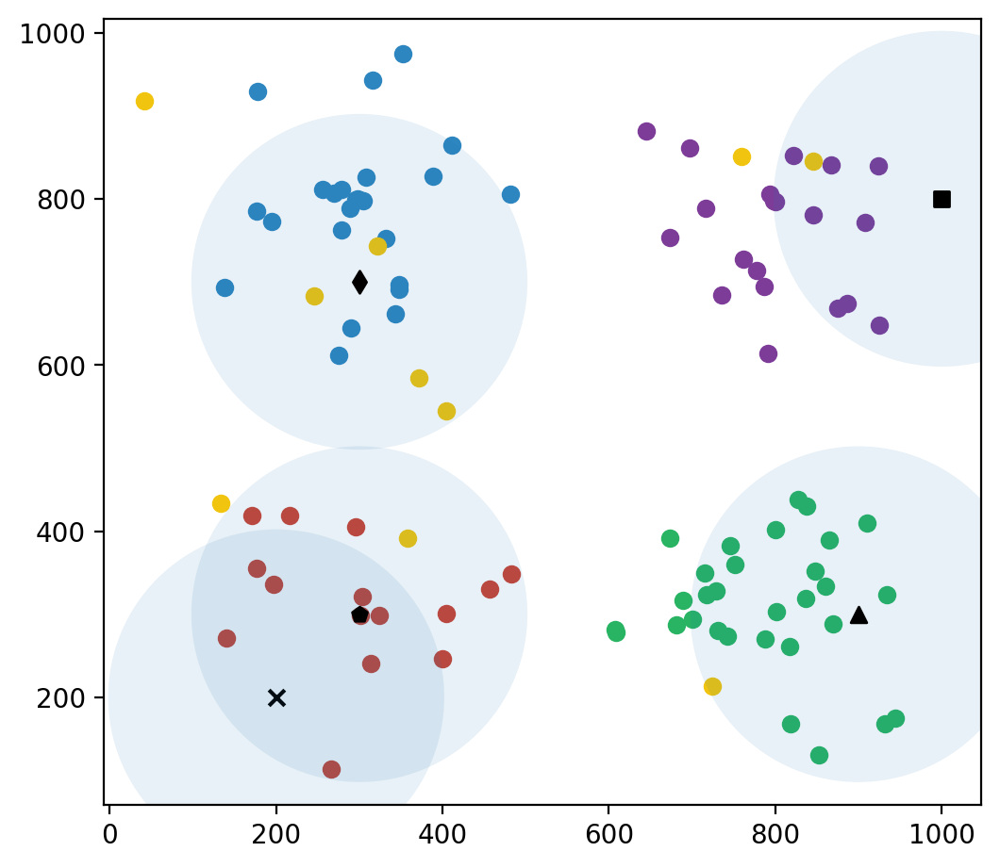

Number of user connected in  70  episode is:  77
71
72
73
74
75
76
77
78
79
80
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 2.  , 0.3 , 0.15, 3.  , 2.  , 0.3 , 0.15, 4.  , 1.  , 0.3 ,
        0.15, 4.  , 1.  , 0.3 , 0.15, 2.  , 3.  , 0.3 , 0.15]]), arr

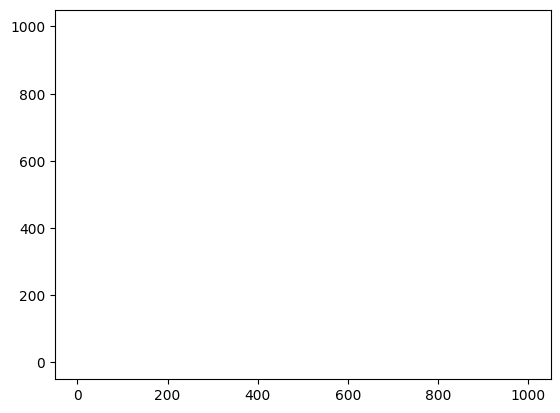

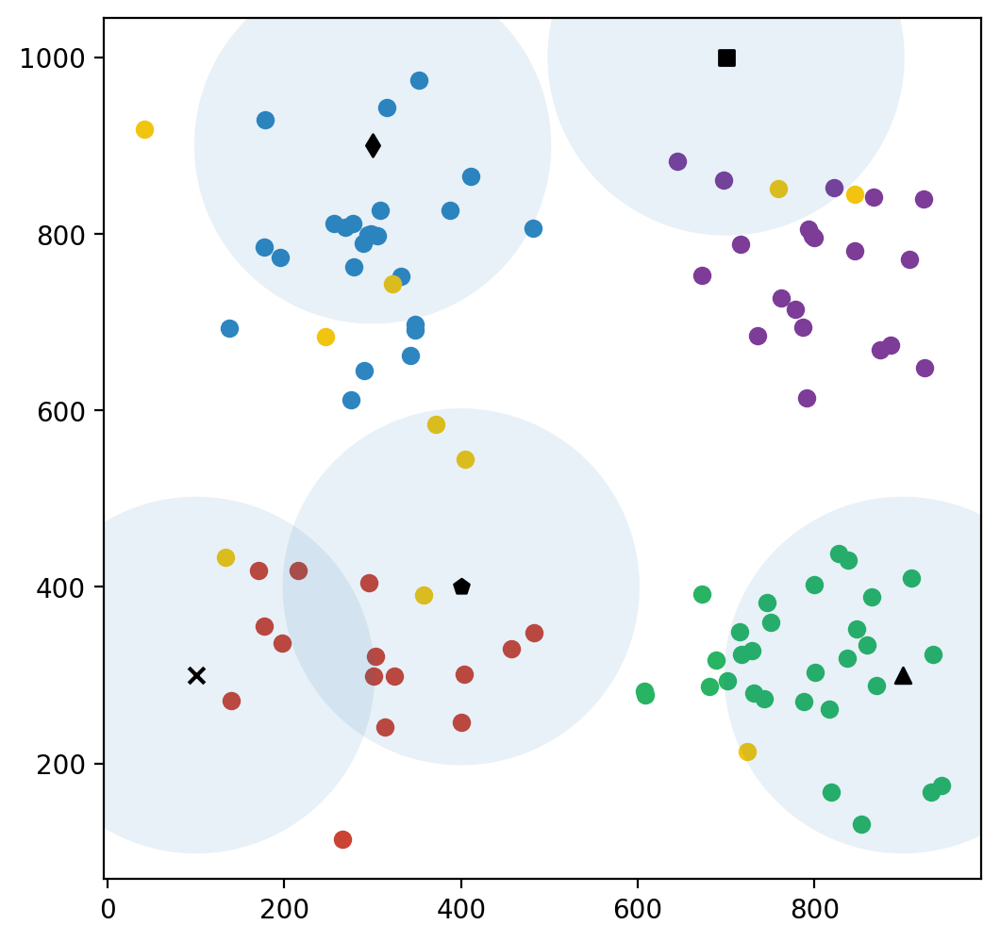

Number of user connected in  80  episode is:  66
81
82
83
84
85
86
87
88
89
90
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 2.  , 0.3 , 0.15, 3.  , 2.  , 0.3 , 0.15, 4.  , 1.  , 0.3 ,
        0.15, 4.  , 1.  , 0.3 , 0.15, 2.  , 3.  , 0.3 , 0.15]]), arr

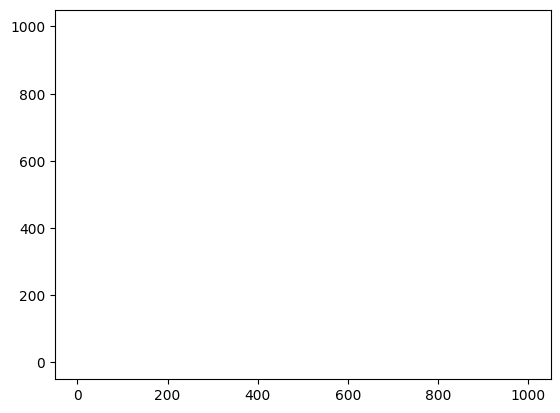

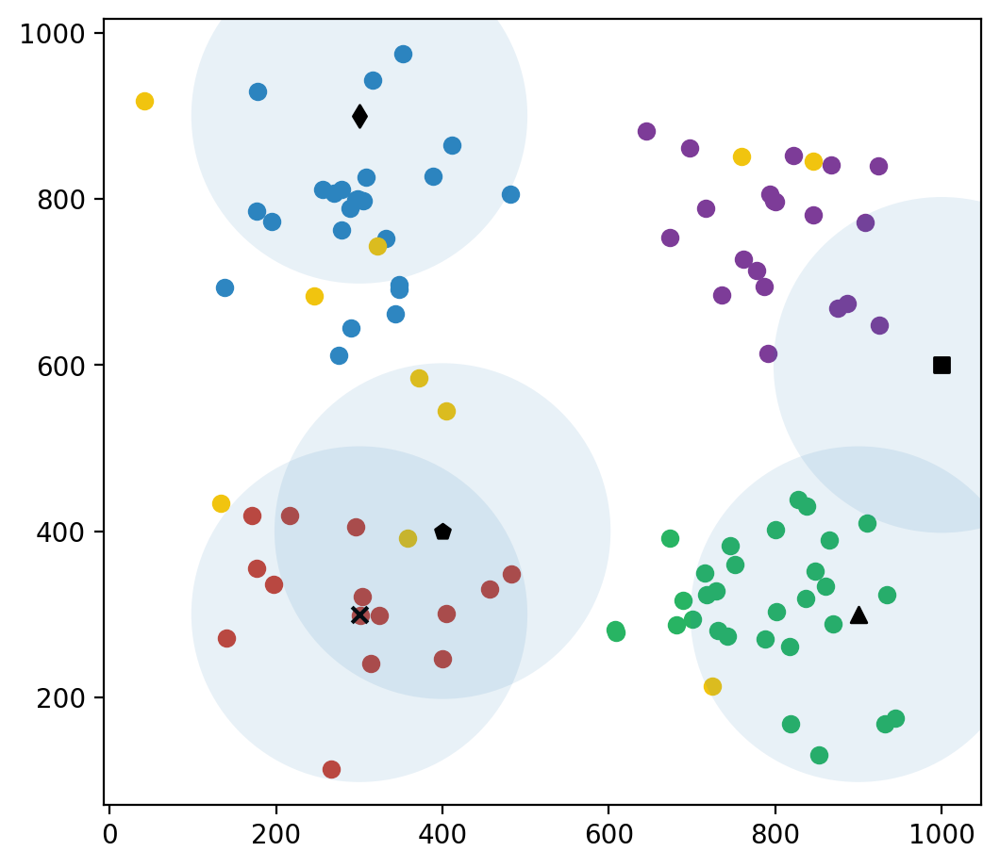

Number of user connected in  90  episode is:  65
91
92
93
94
95
96
97
98
99
100
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.        , 2.        , 0.03333333, 0.06      , 2.        ,
        1.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(

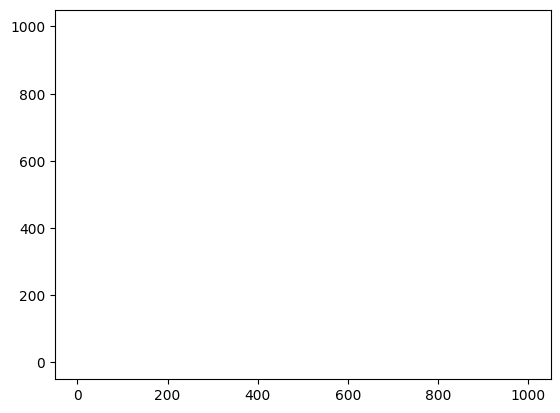

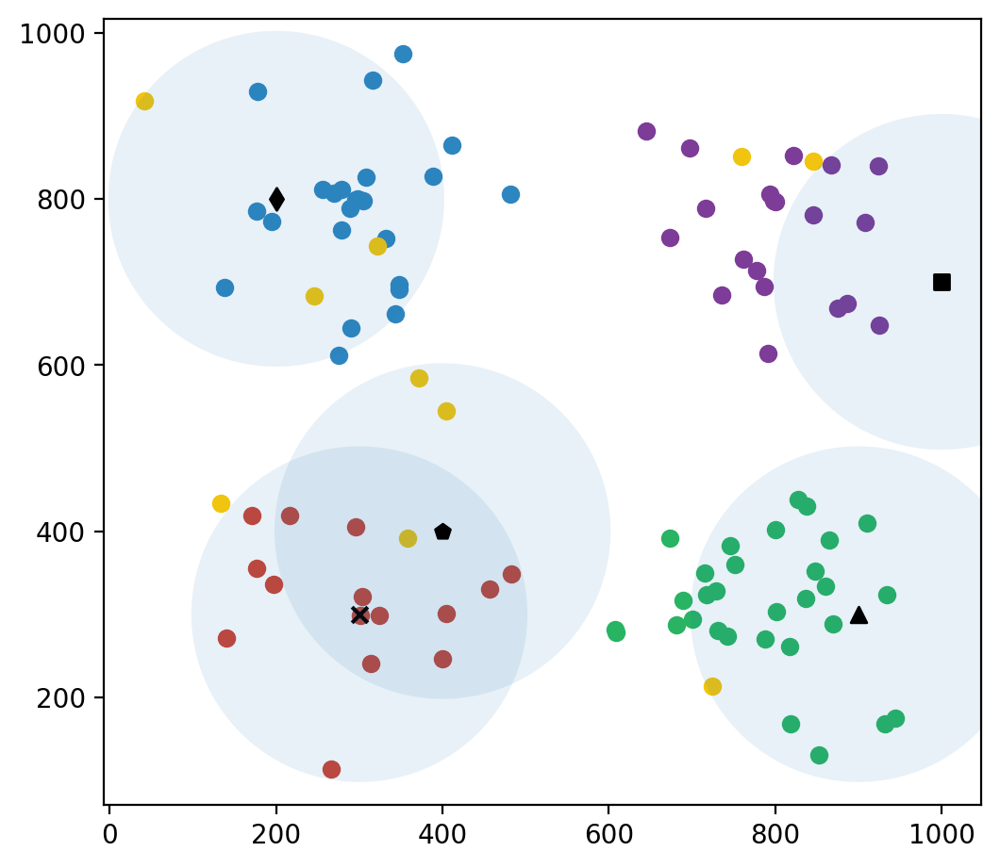

Number of user connected in  100  episode is:  73
101
102
103
104
105
106
107
108
109
110
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 2.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

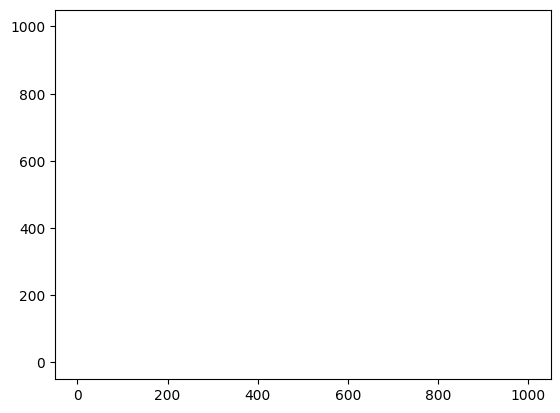

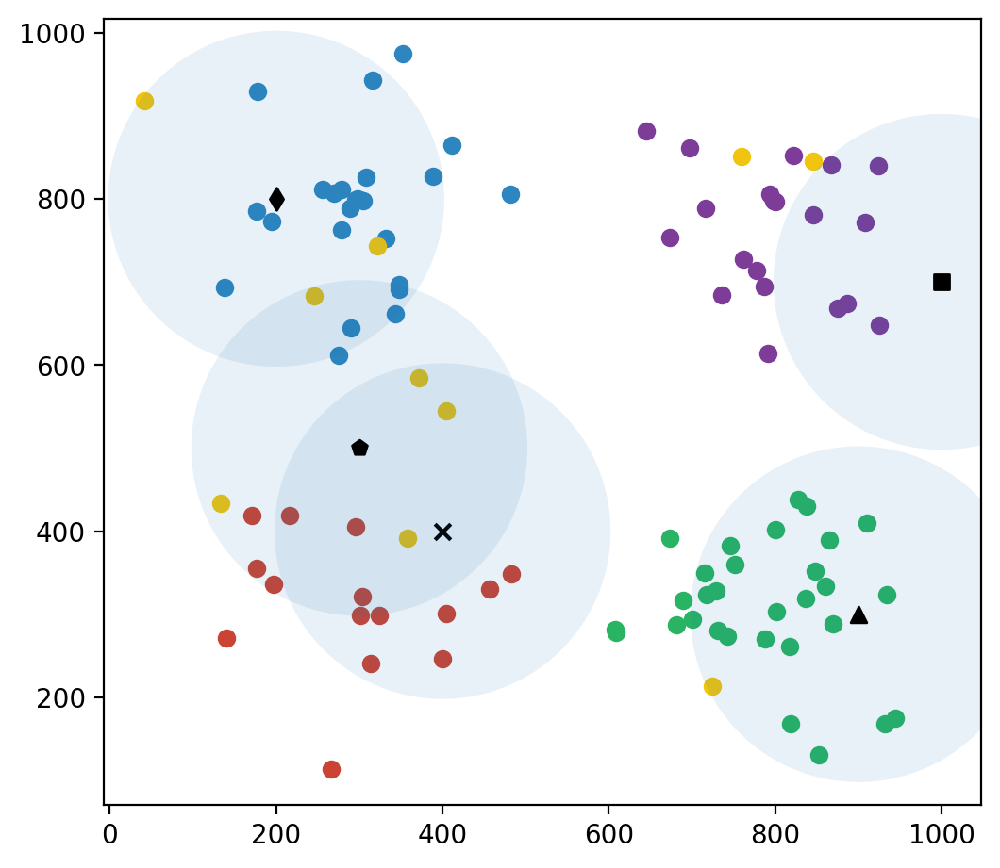

Number of user connected in  110  episode is:  74
111
112
113
114
115
116
117
118
119
120
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 0.  , 4.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.        , 2.        , 0.26666667, 0.15      , 0.        ,
        5.        , 0.26666667, 0.15      , 4.        , 1.

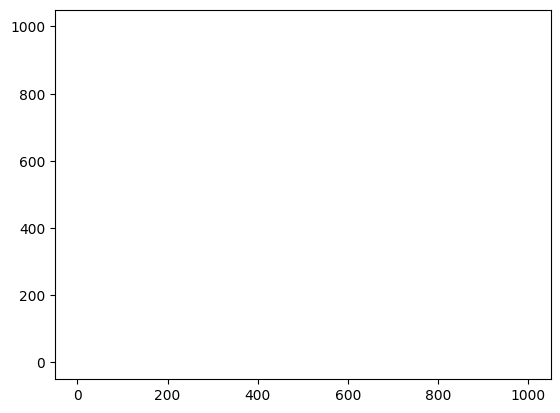

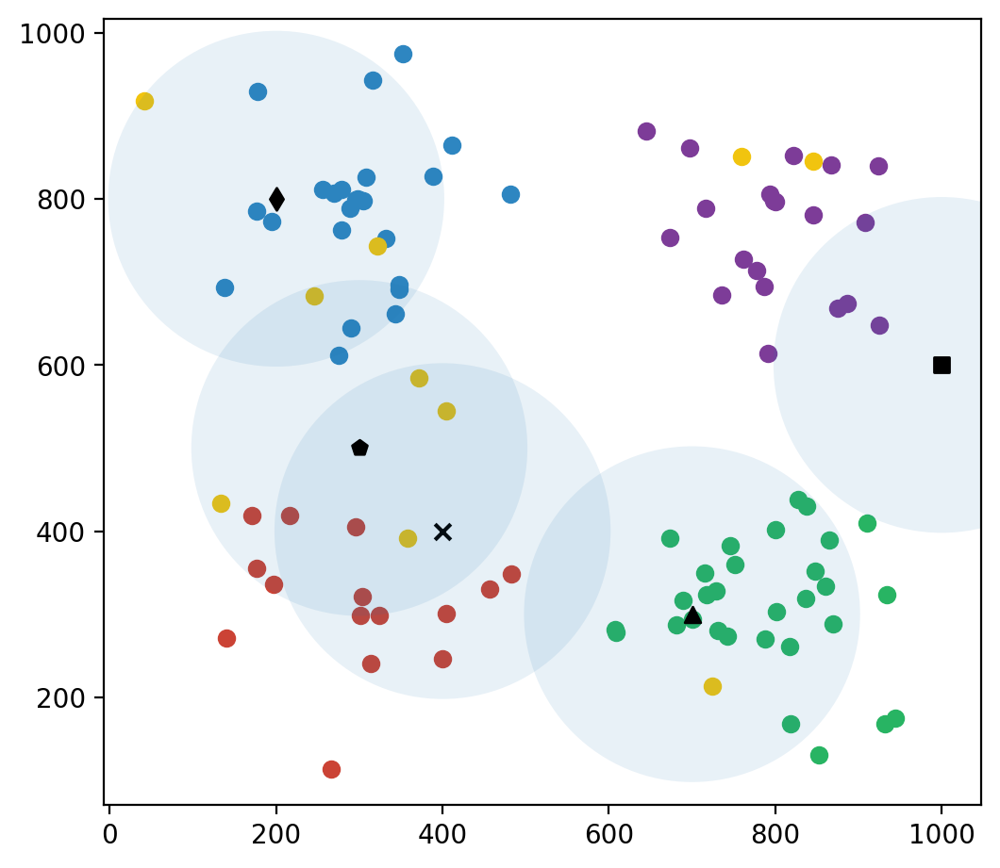

Number of user connected in  120  episode is:  71
121
122
123
124
125
126
127
128
129
130
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 0.  , 4.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.        , 2.        , 0.36666667, 0.15      , 0.        ,
        5.        , 0.36666667, 0.15      , 4.        , 1.

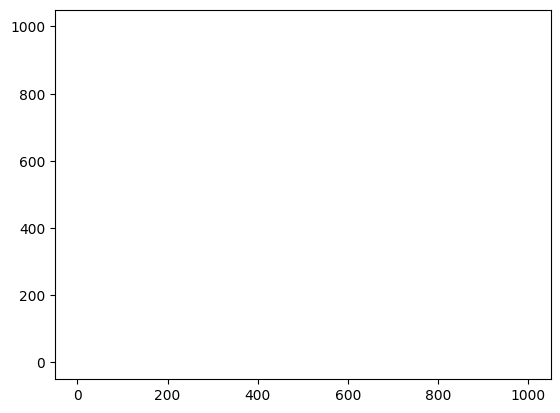

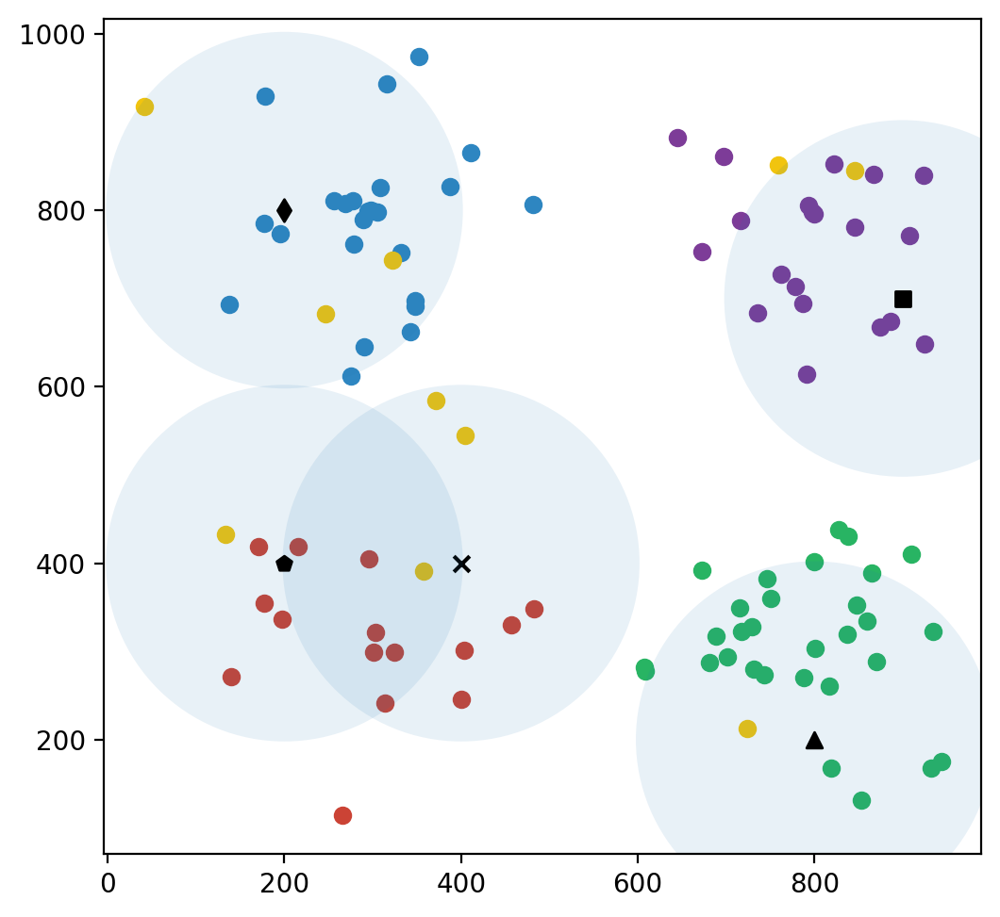

Number of user connected in  130  episode is:  83
131
132
133
134
135
136
137
138
139
140
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.  , 2.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.        , 3.        , 0.13333333, 0.12      , 0.        ,
        4.        , 0.13333333, 0.12      , 3.        , 1.        ,
        0.13333333, 0.12      , 3.        , 1.        , 0.13333333,
        0.12      , 2.        , 2.        , 0.13333333, 0.12      ]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'emp

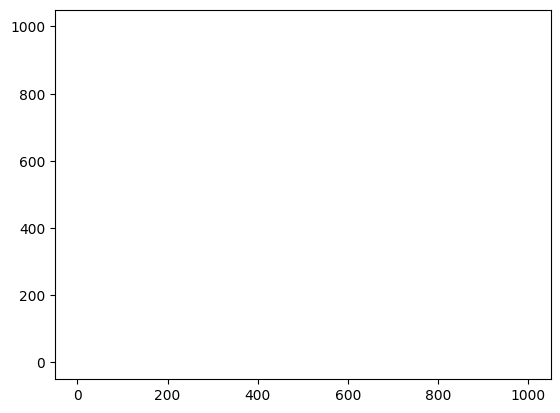

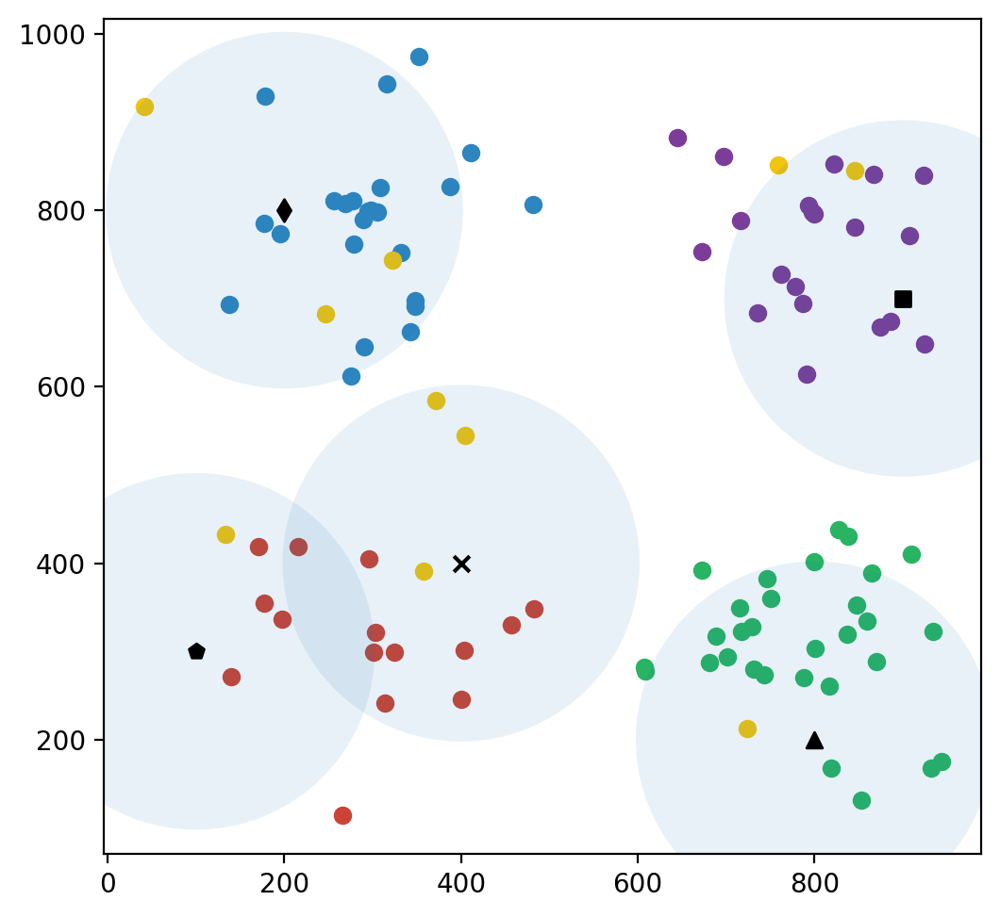

Number of user connected in  140  episode is:  82
141
142
143
144
145
146
147
148
149
150
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.06, 0.  , 3.  , 0.1 , 0.06, 2.  , 1.  , 0.1 ,
        0.06, 3.  , 0.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 2.  , 0.2 , 0.15, 1.  , 2.  , 0.2 , 0.15, 4.  , 1.  , 0.2 ,
        0.15, 3.  , 2.  , 0.2 , 0.15, 1.  , 4.  , 0.

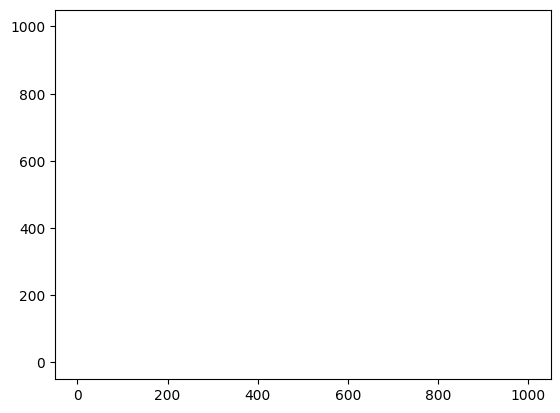

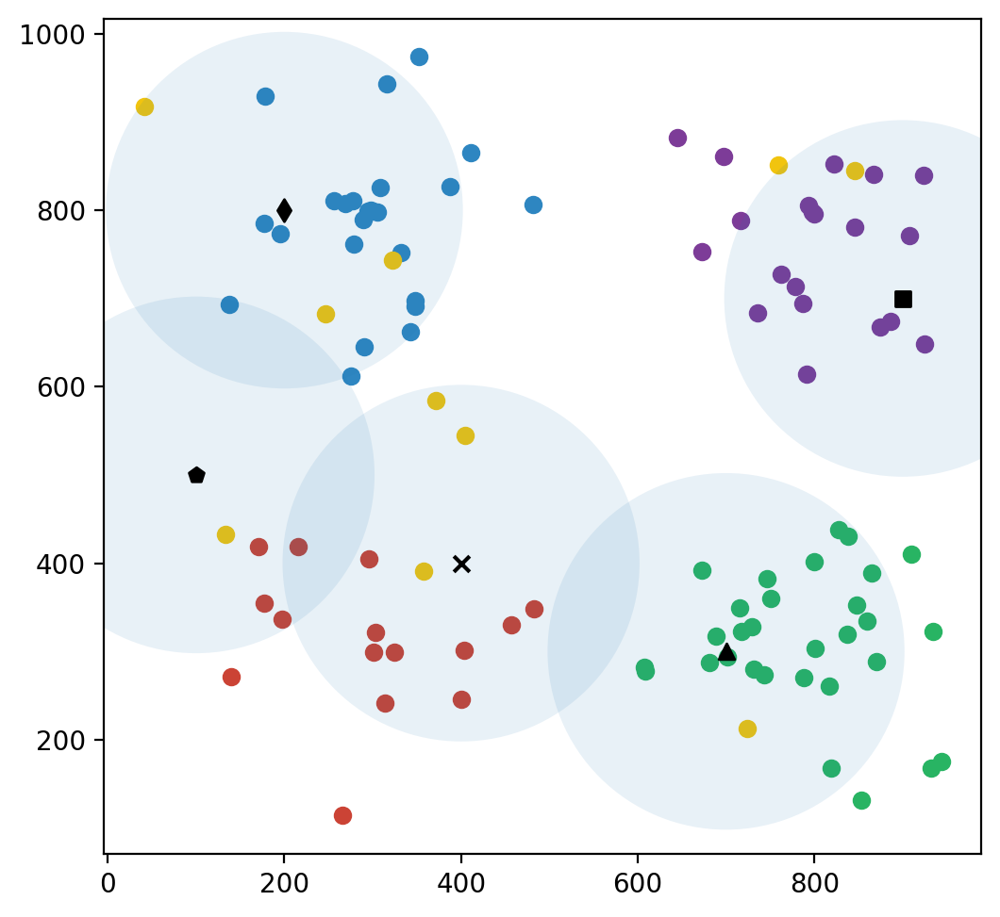

Number of user connected in  150  episode is:  81
151
152
153
154
155
156
157
158
159
160
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.05, 0.  , 3.  , 0.1 , 0.05, 0.  , 3.  , 0.1 ,
        0.05, 3.  , 0.  , 0.1 , 0.05, 1.  , 2.  , 0.1 , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  ,
        0.11, 3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 4.  , 0.  , 0.15, 1.  , 2.  , 0.  , 0.15, 2.  , 3.  , 0.  ,
        0.15, 4.  , 1.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0

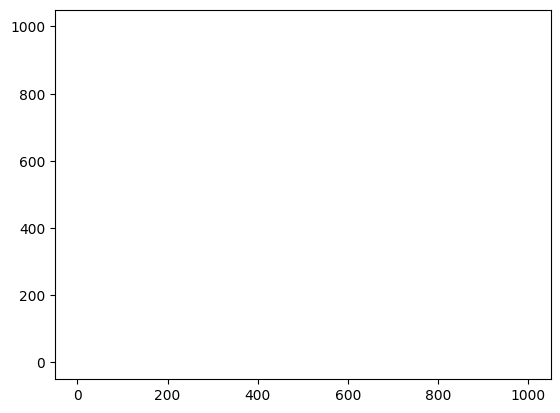

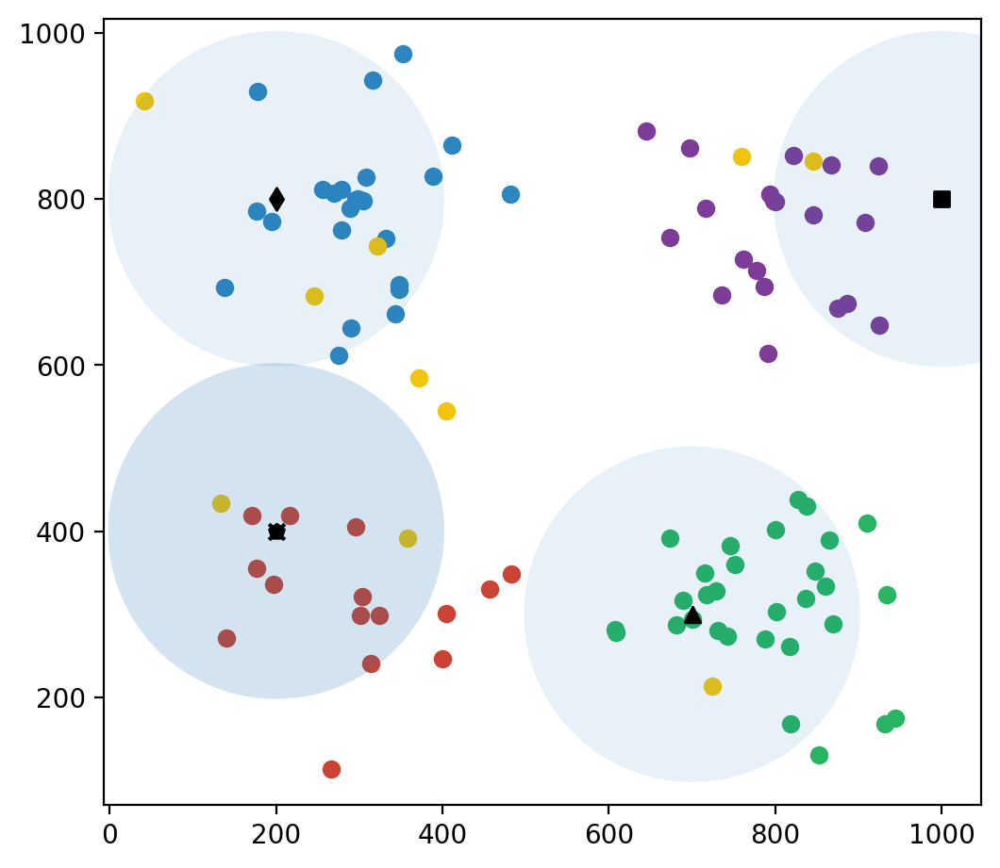

Number of user connected in  160  episode is:  72
161
162
163
164
165
166
167
168
169
170
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.1 , 0.06, 0.  , 3.  , 0.1 , 0.06, 2.  , 1.  , 0.1 ,
        0.06, 3.  , 0.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 2.  , 0.2 , 0.15, 1.  , 2.  , 0.2 , 0.15, 4.  , 1.  , 0.2 ,
        0.15, 3.  , 2.  , 0.2 , 0.15, 1.  , 4.  , 0.

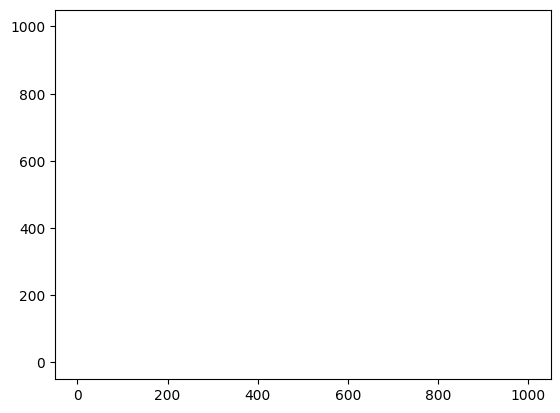

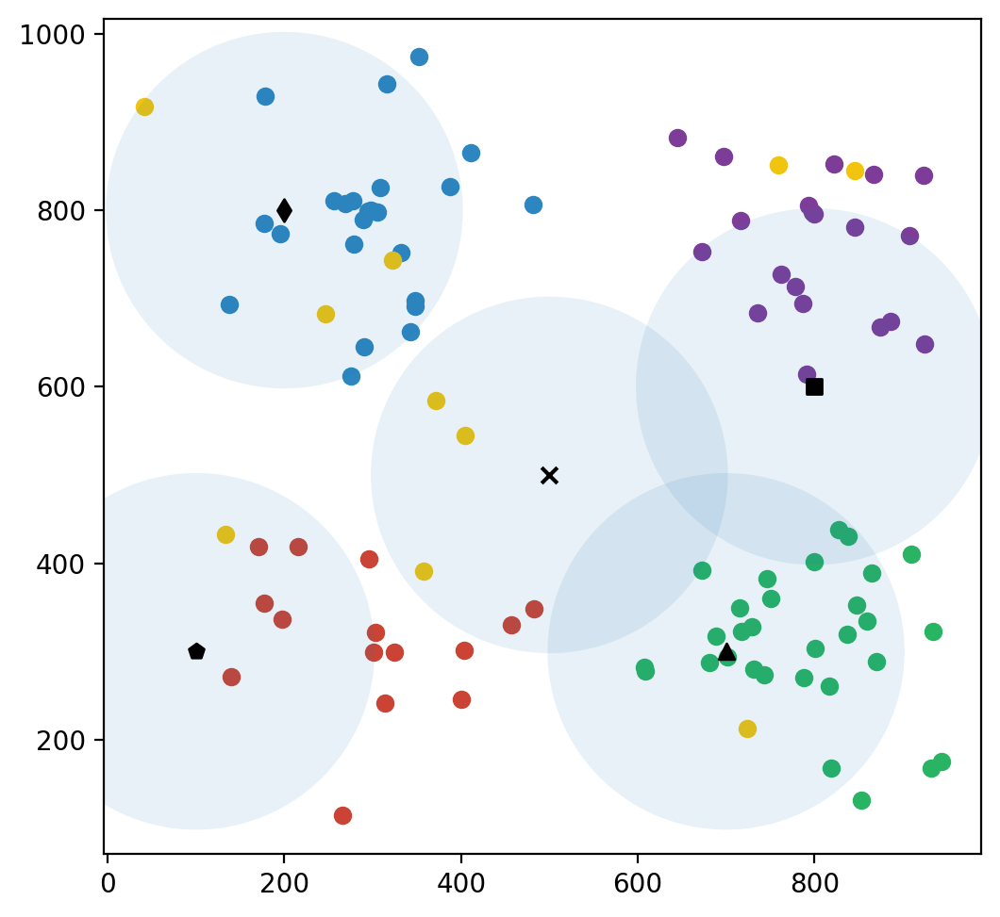

Number of user connected in  170  episode is:  74
171
172
173
174
175
176
177
178
179
180
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05, 1.  , 2.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 2.  , 0.2 , 0.15, 1.  , 2.  , 0.2 , 0.15, 3.  , 2.  , 0.2 ,
        0.15, 4.  , 1.  , 0.2 , 0.15, 1.  , 4.  , 0.2 , 0

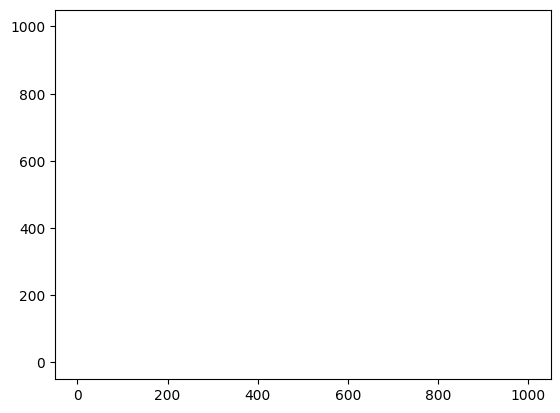

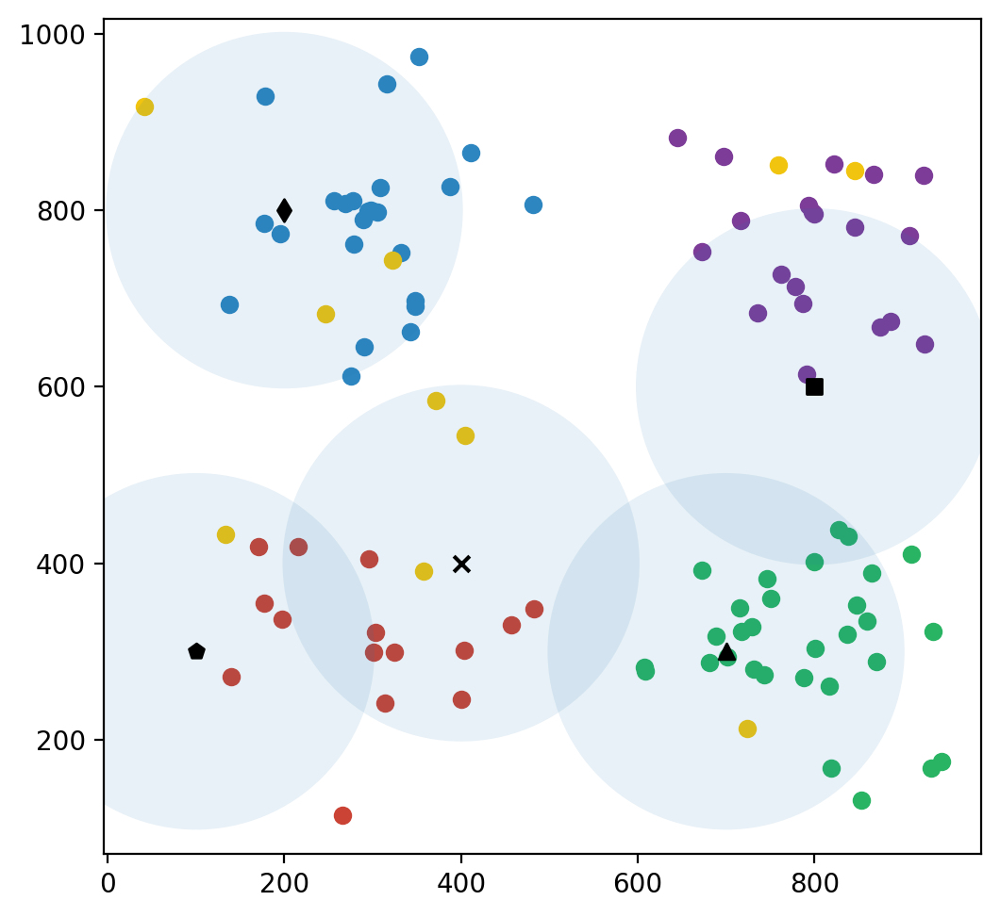

Number of user connected in  180  episode is:  78
181
182
183
184
185
186
187
188
189
190
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[3.  , 2.  , 0.2 , 0.15, 1.  , 2.  , 0.2 , 0.15, 3.  , 2.  , 0.2 ,
        0.15, 4.  , 1.  , 0.2 , 0.15, 1.  , 4.  , 0.

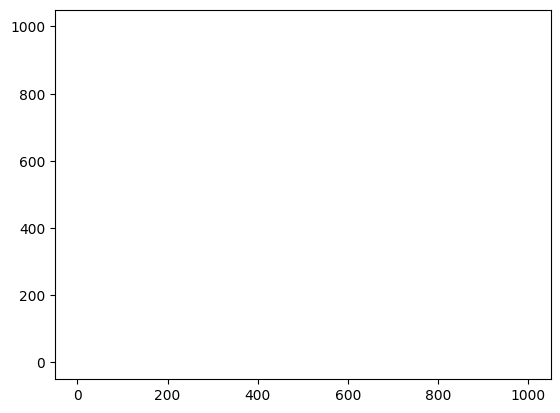

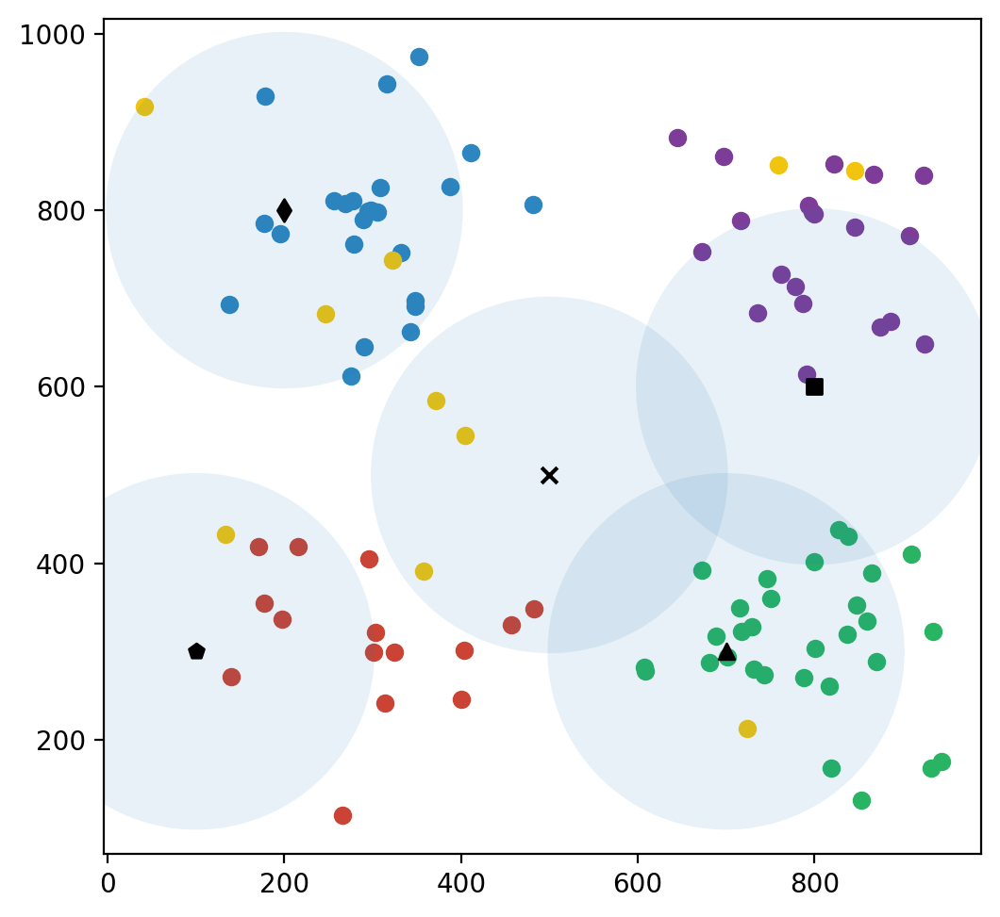

Number of user connected in  190  episode is:  74
191
192
193
194
195
196
197
198
199
200
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 1.        , 1.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.03333333, 0.06      , 2.        ,
        1.        , 0.03333333, 0.06      , 1.        , 2.        ,
        0.03333333, 0.06      , 2.        , 1.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.        , 2.        , 0.06666667, 0.11

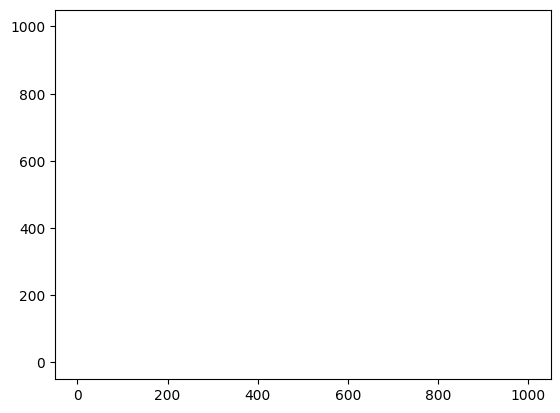

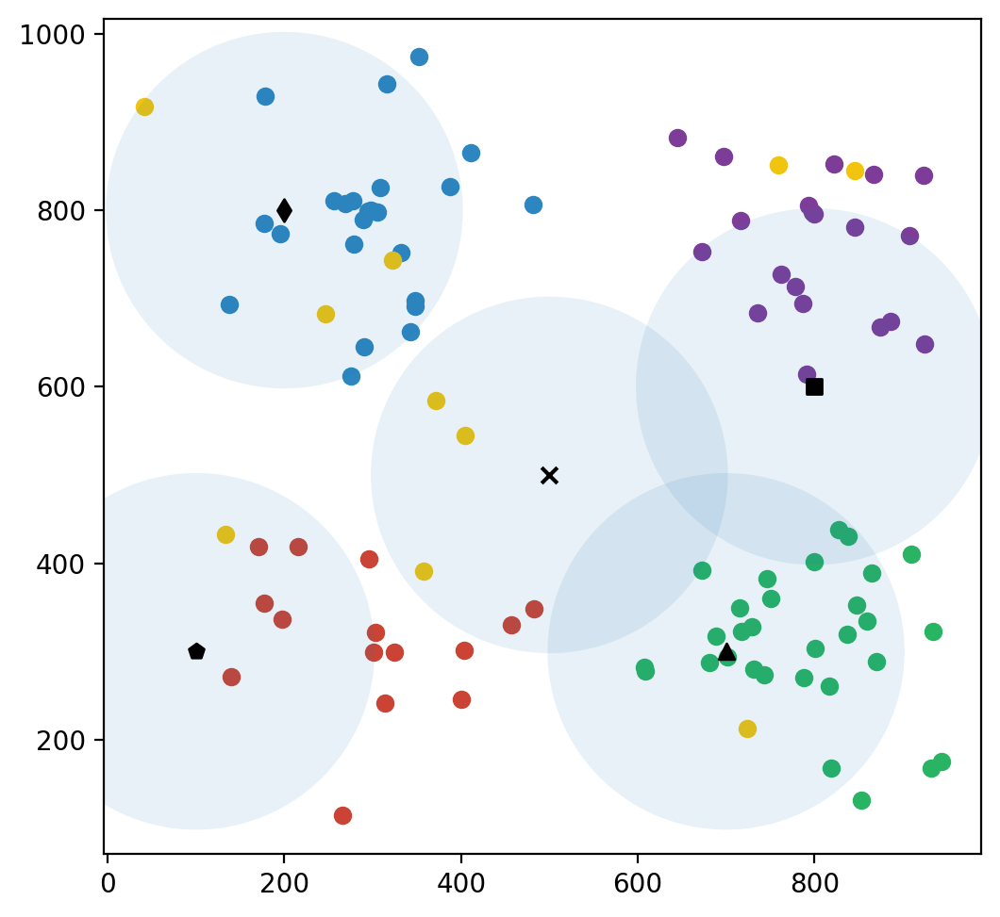

Number of user connected in  200  episode is:  74
201
202
203
204
205
206
207
208
209
210
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.  , 0.11, 2.  , 2.  , 0.  , 0.11, 1.  , 3.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[3.  , 2.  , 0.2 , 0.15, 3.  , 2.  , 0.2 , 0.15, 1.  , 2.  , 0.2 ,
        0.15, 4.  , 1.  , 0.2 , 0.15, 1.  , 4.  , 0.

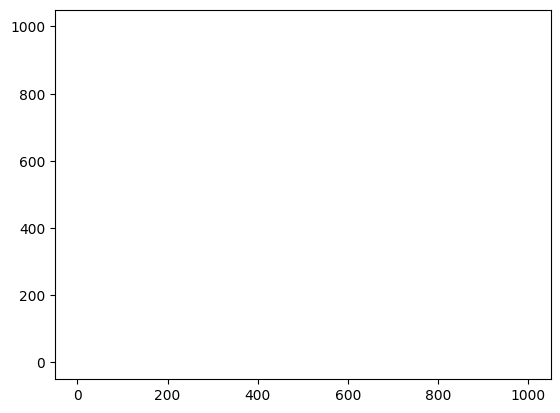

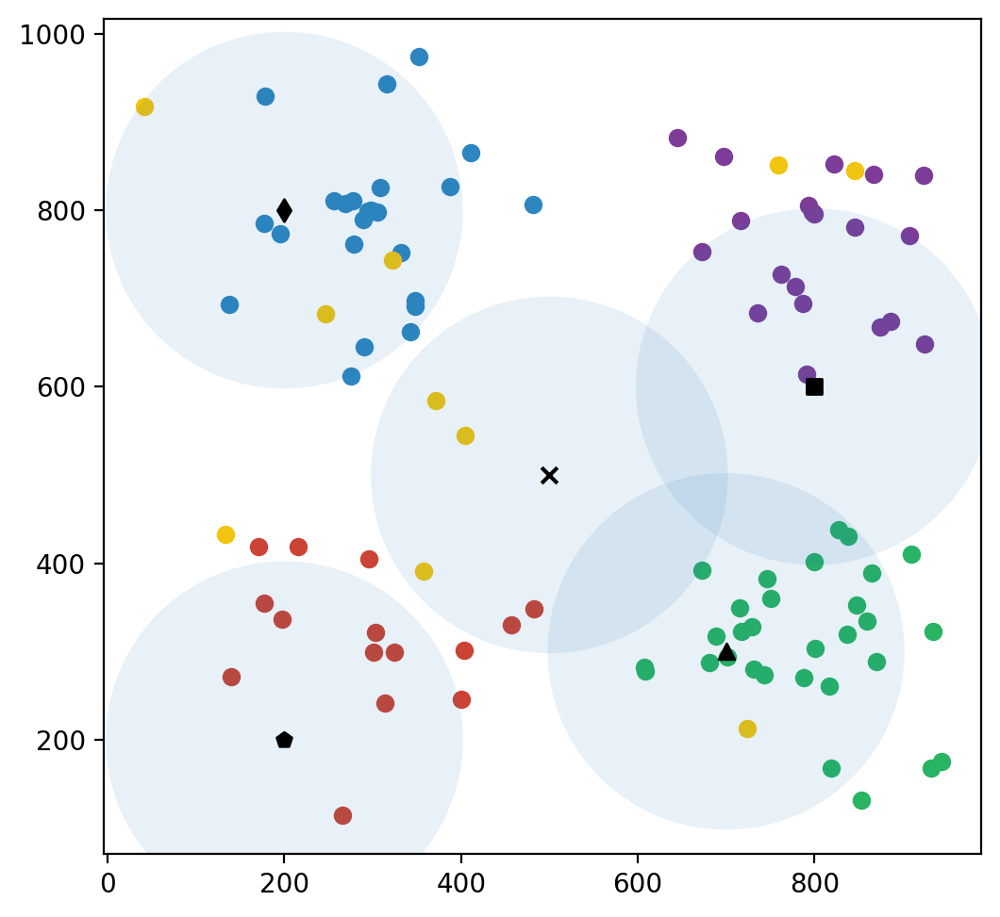

Number of user connected in  210  episode is:  75
211
212
213
214
215
216
217
218
219
220
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.05, 2.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[3.  , 1.  , 0.  , 0.11, 2.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  ,
        0.11, 3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[3.  , 2.  , 0.2 , 0.15, 2.  , 0.  , 0.2 , 0.15, 1.  , 2.  , 0.2 ,
        0.15, 3.  , 2.  , 0.2 , 0.15, 1.  , 4.  , 0.2 , 0

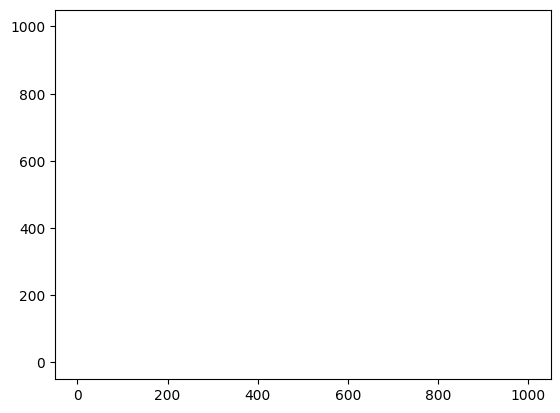

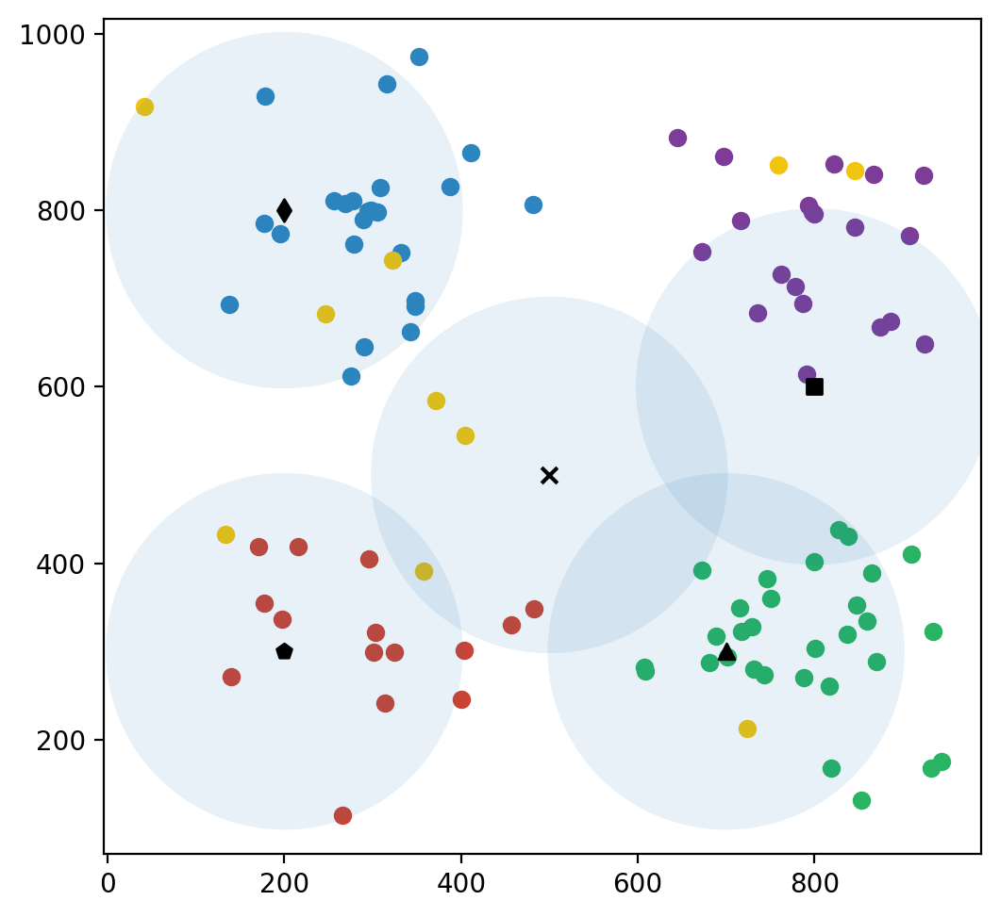

Number of user connected in  220  episode is:  79
221
222
223
224
225
226
227
228
229
230
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 2.  , 0.2 , 0.15, 3.  , 2.  , 0.2 , 0.15, 2.  , 1.  , 0.2 ,
        0.15, 3.  , 2.  , 0.2 , 0.15, 1.  , 4.  , 0.

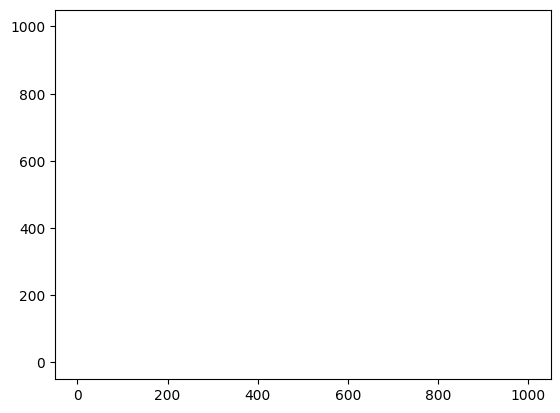

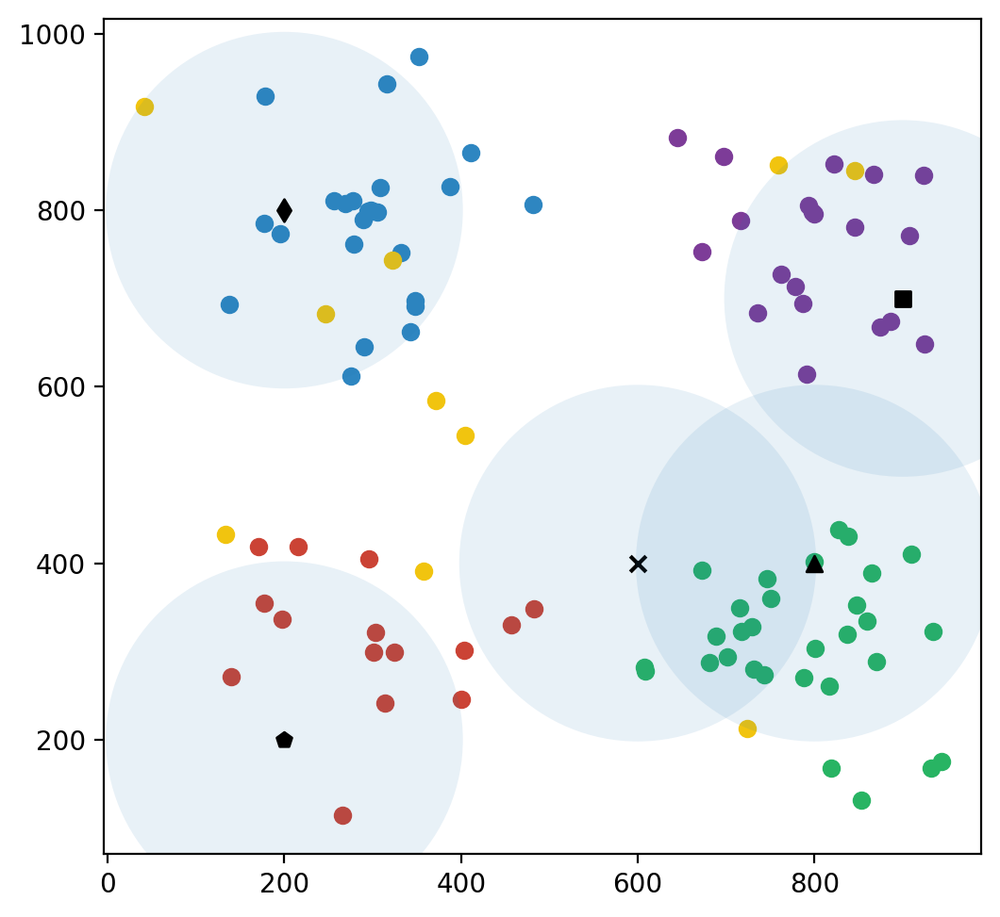

Number of user connected in  230  episode is:  78
231
232
233
234
235
236
237
238
239
240
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 3.        , 0.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

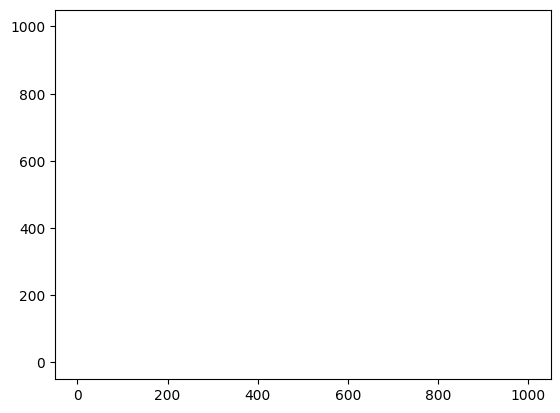

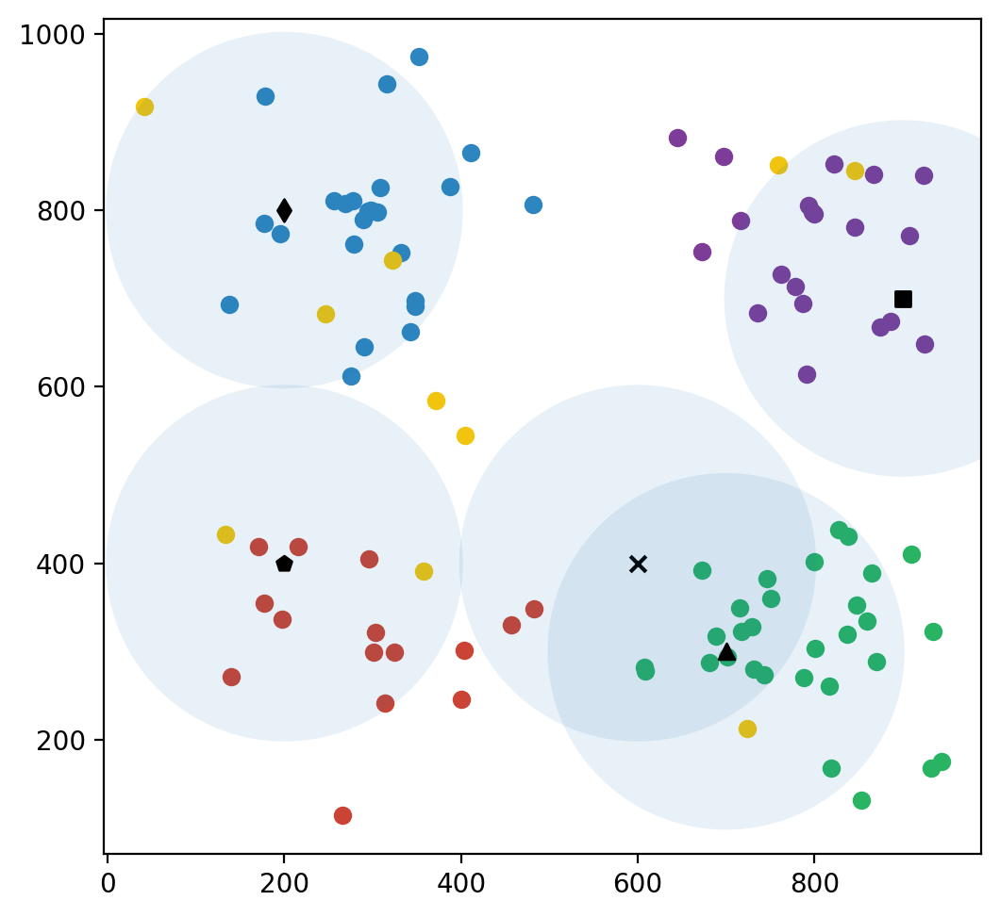

Number of user connected in  240  episode is:  81
241
242
243
244
245
246
247
248
249
250
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.1 , 0.05, 2.  , 1.  , 0.1 , 0.05, 2.  , 1.  , 0.1 ,
        0.05, 3.  , 0.  , 0.1 , 0.05, 1.  , 2.  , 0.1 , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[3.  , 1.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 4.  , 0.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.        , 2.        , 0.23333333, 0.15      , 3.        ,
        2.        , 0.23333333, 0.15      , 4.        , 1.     

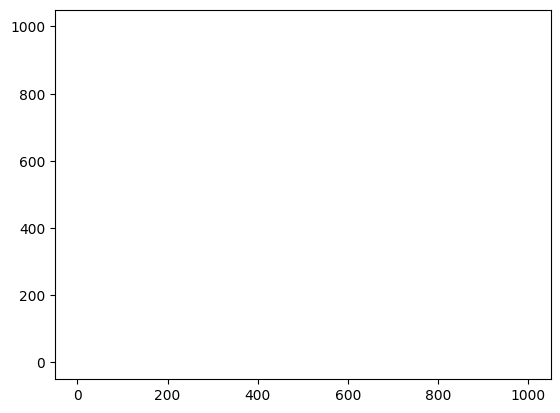

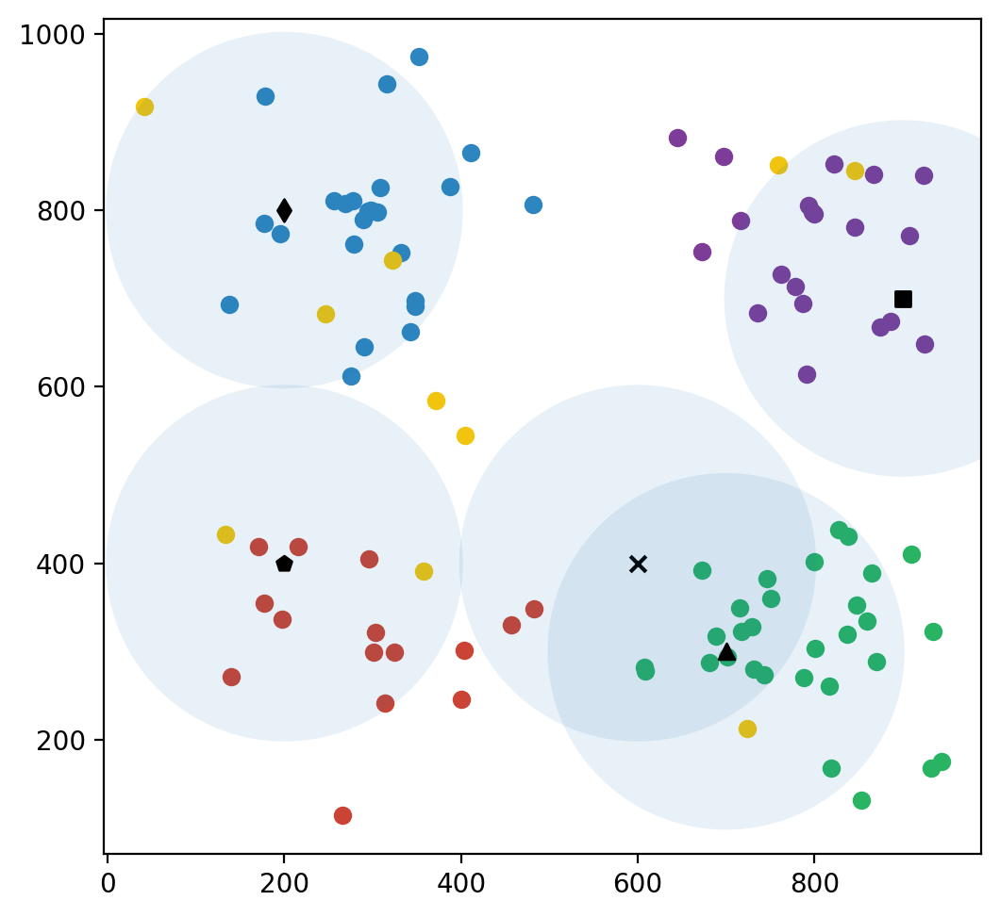

Number of user connected in  250  episode is:  81
251
252
253
254
255
256
257
258
259
260
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 3.        , 0.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

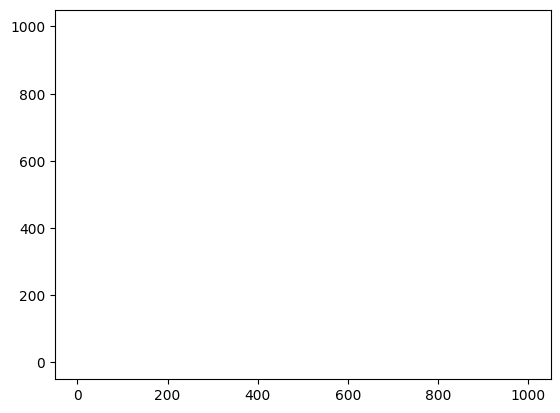

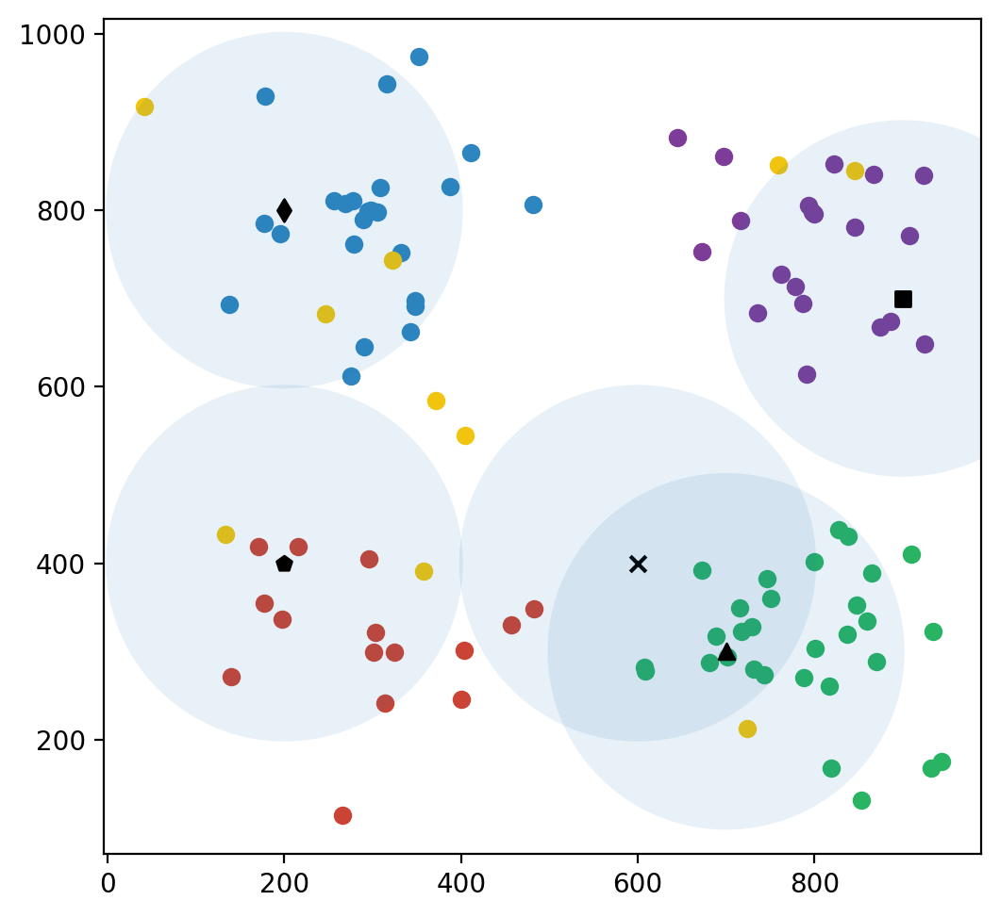

Number of user connected in  260  episode is:  81
261
262
263
264
265
266
267
268
269
270
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.03333333, 0.06      , 2.        ,
        1.        , 0.03333333, 0.06      , 1.        , 2.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.  , 1.  , 0.2 , 0.12, 2.  , 2.  , 0.2 

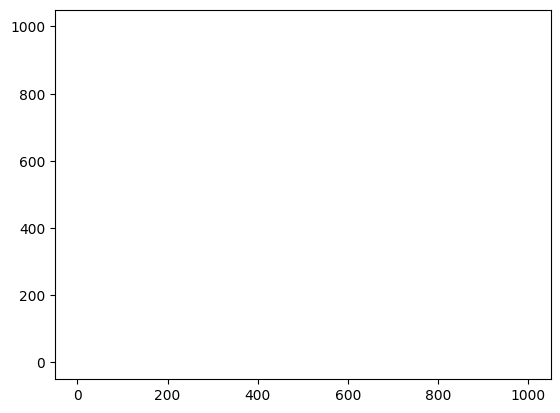

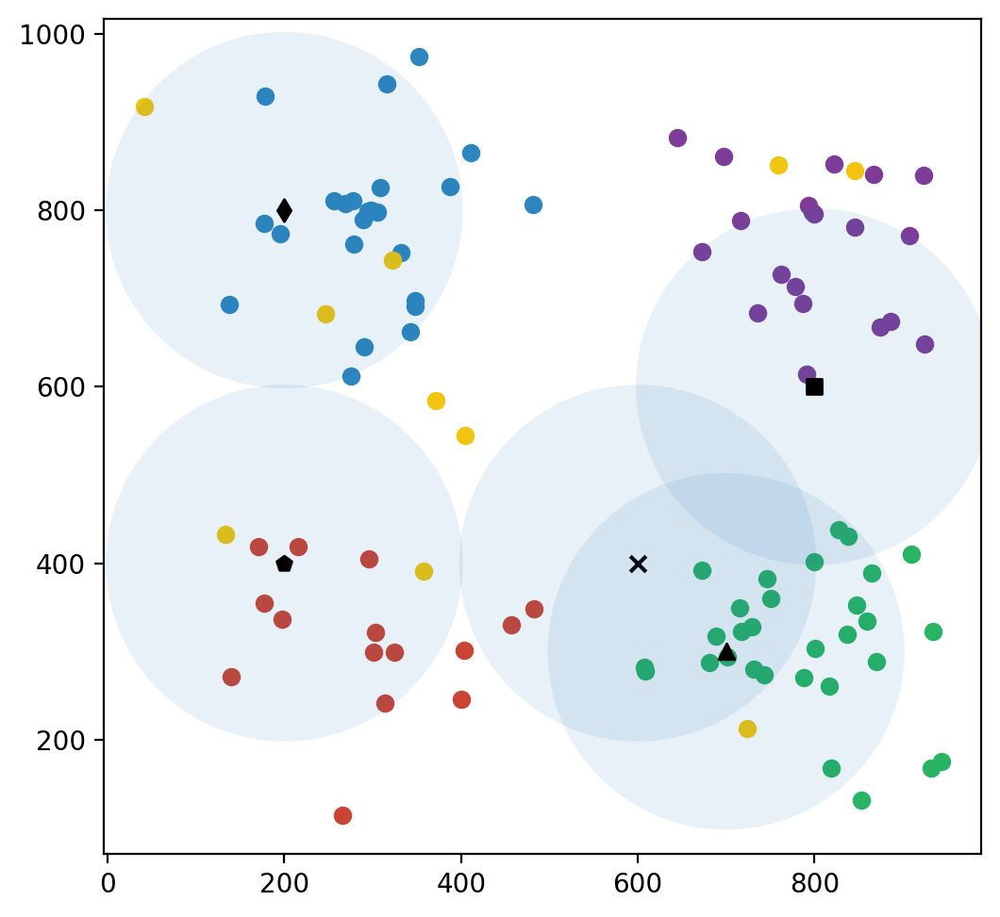

Number of user connected in  270  episode is:  76
271
272
273
274
275
276
277
278
279
280
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 1.        , 1.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 2.        , 1.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

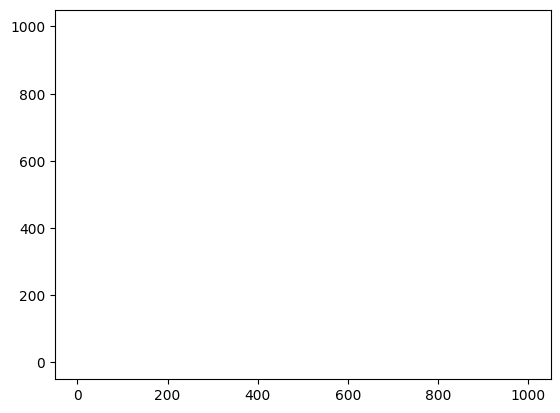

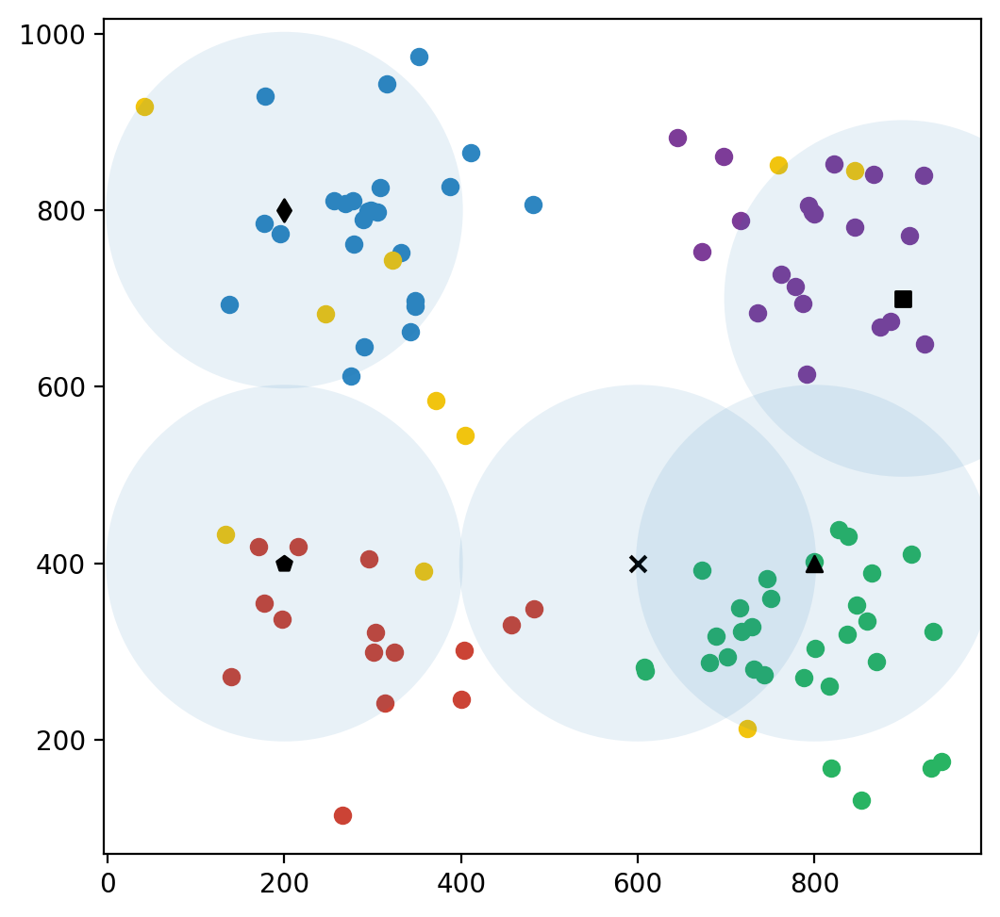

Number of user connected in  280  episode is:  82
281
282
283
284
285
286
287
288
289
290
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.1 , 0.06, 0.  , 3.  , 0.1 , 0.06, 2.  , 1.  , 0.1 ,
        0.06, 3.  , 0.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 4.  , 0.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.  , 2.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.

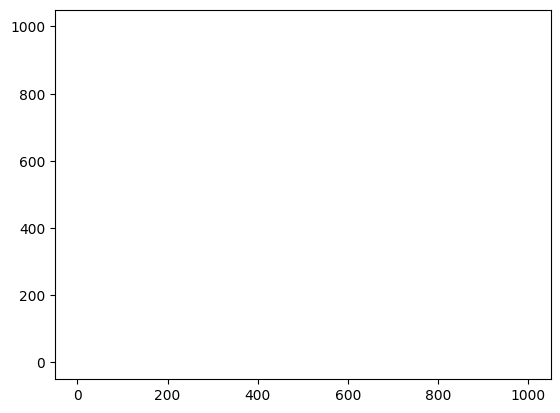

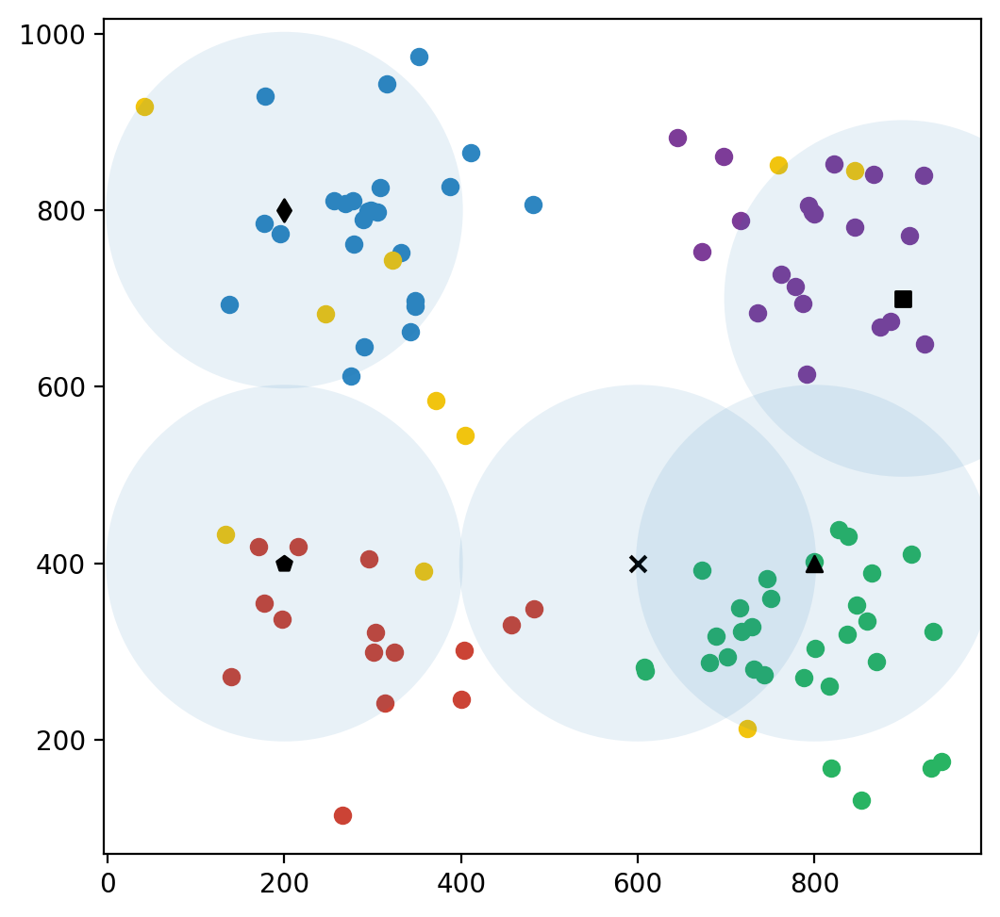

Number of user connected in  290  episode is:  82
291
292
293
294
295
296
297
298
299
300
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.04, 1.  , 2.  , 0.  , 0.04, 3.  , 0.  , 0.  ,
        0.04, 3.  , 0.  , 0.  , 0.04, 1.  , 2.  , 0.  , 0.04]]), array([-0.2, -0.2, -0.2, -0.2, -0.2]), False, 'empty', 4)
(array([[3.  , 1.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 4.  , 0.  , 0.2 ,
        0.12, 4.  , 0.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.        , 2.        , 0.23333333, 0.15      , 3.        ,
        2.        , 0.23333333, 0.15      , 4.       

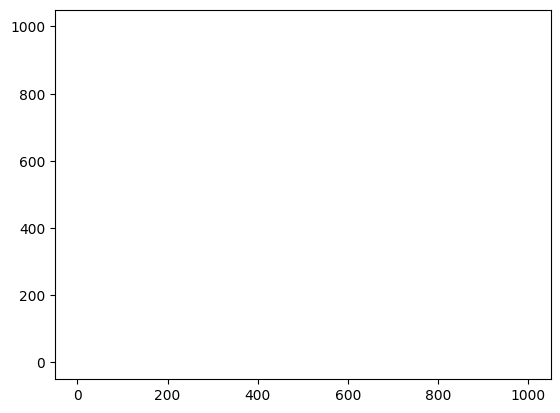

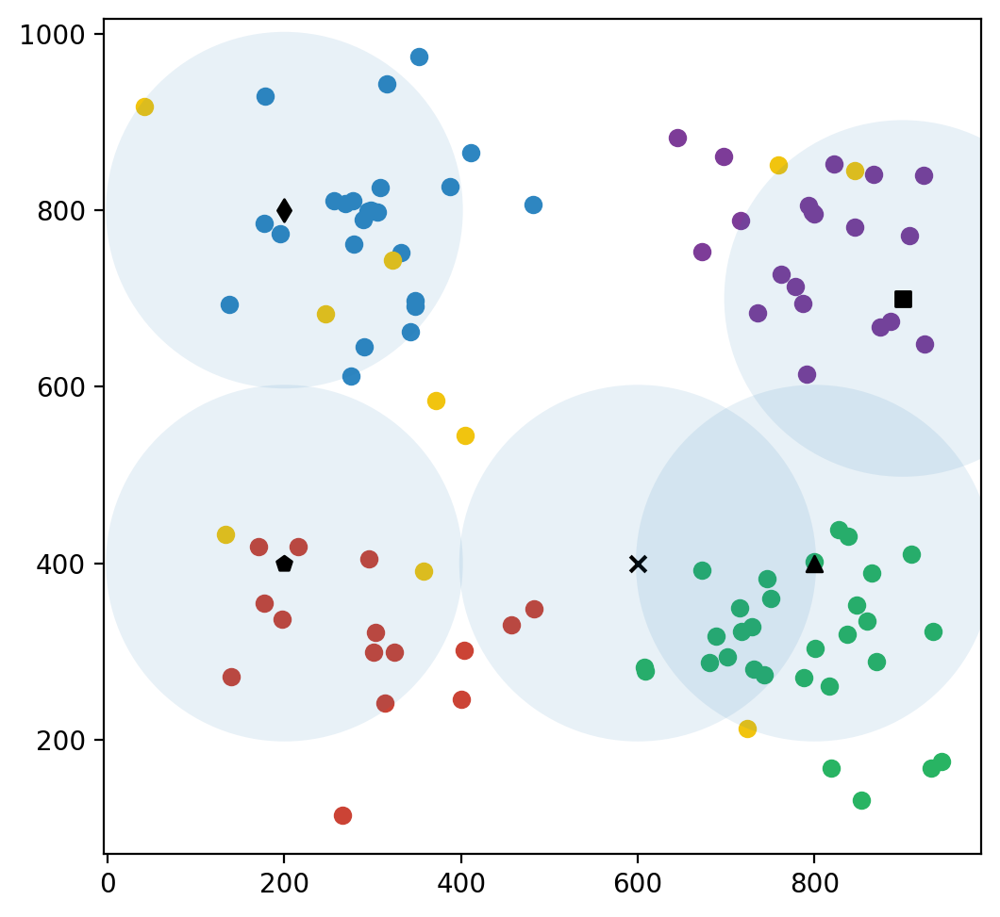

Number of user connected in  300  episode is:  82
301
302
303
304
305
306
307
308
309
310
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.16666667, 0.11      , 0.        ,
        4.        , 0.16666667, 0.11      , 3.        , 1.        ,
        0.16666667, 0.11      , 4.        , 0.        , 0.16666667,
        0.11      , 1.        , 3.        , 0.16666667, 0.11      ]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'emp

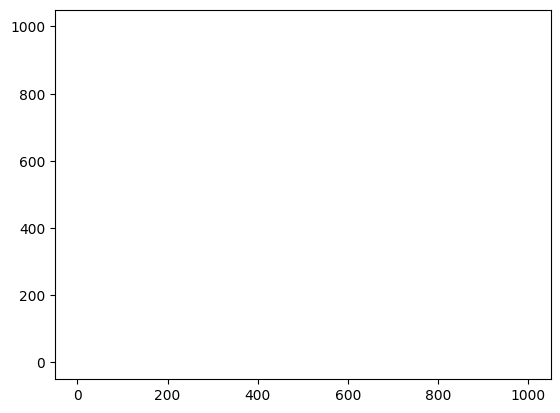

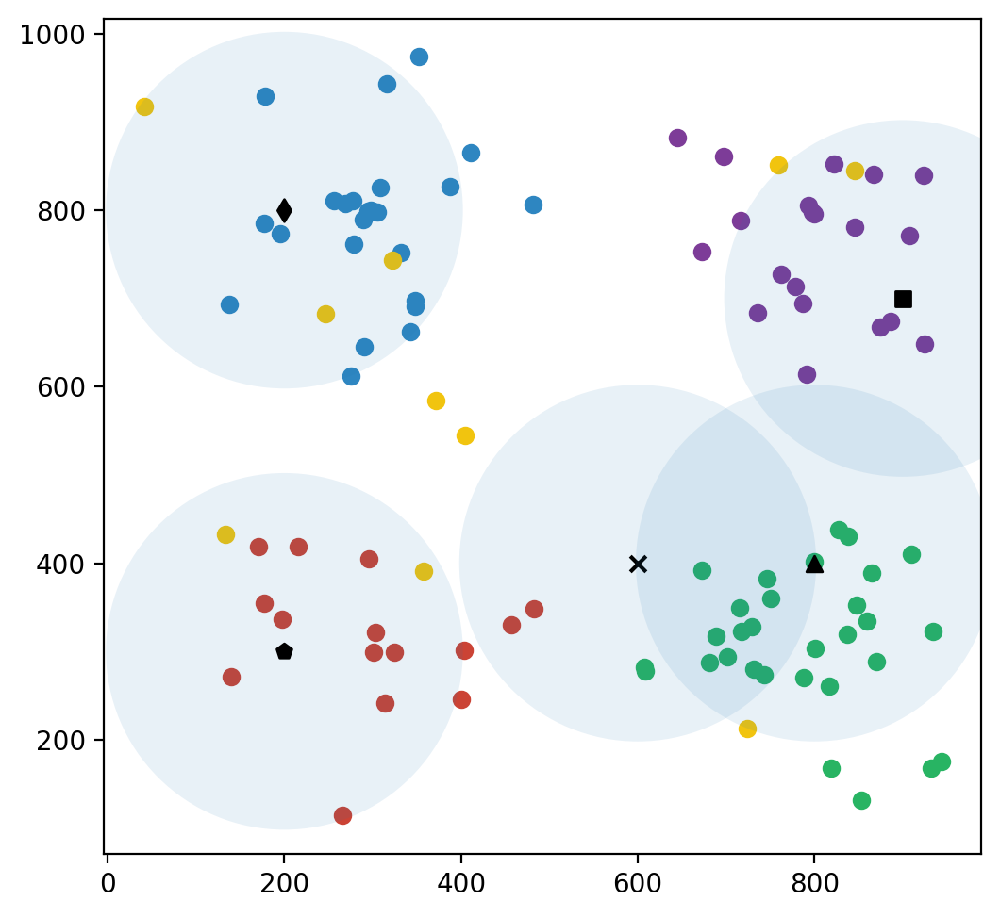

Number of user connected in  310  episode is:  83
311
312
313
314
315
316
317
318
319
320
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.06, 2.  , 1.  , 0.1 , 0.06, 2.  , 1.  , 0.1 ,
        0.06, 2.  , 1.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 4.  , 1.  , 0.  , 0.15, 2.  , 3.  , 0.

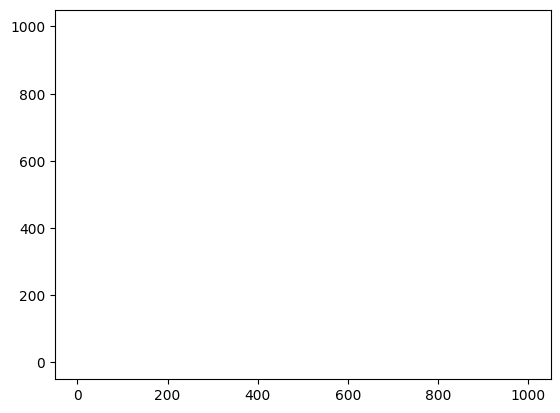

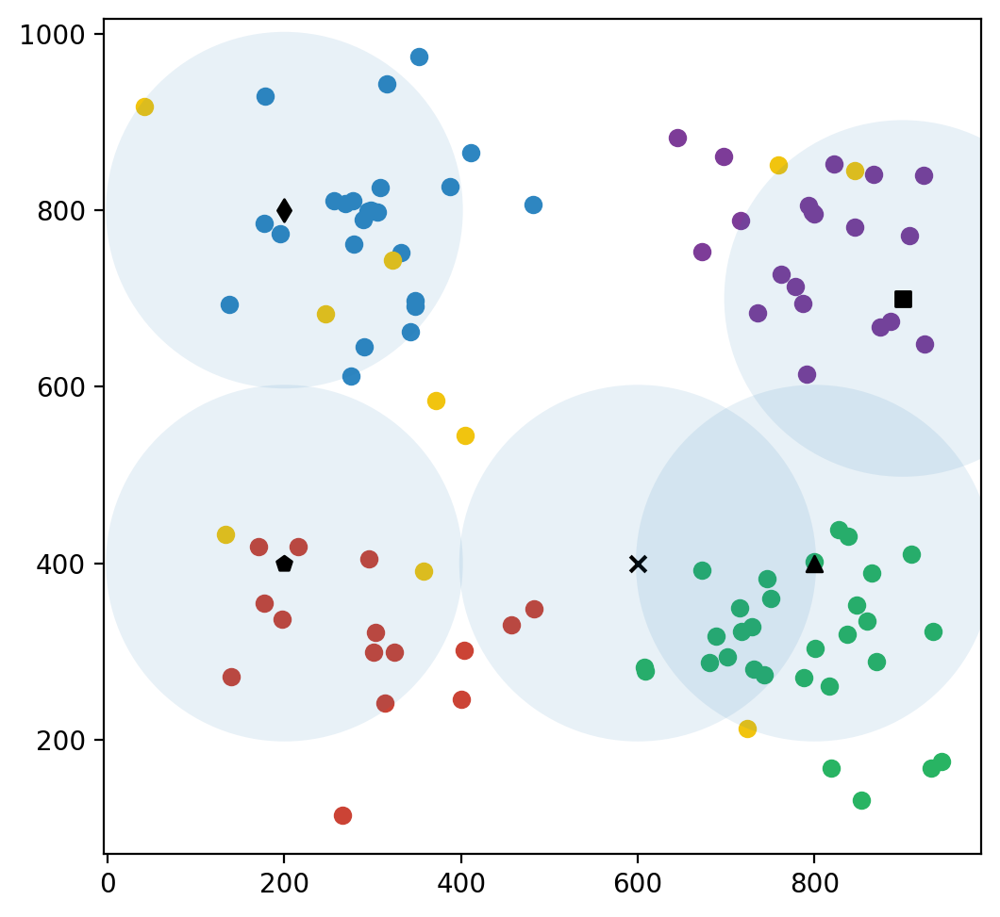

Number of user connected in  320  episode is:  82
321
322
323
324
325
326
327
328
329
330
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 2.        , 0.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 3.        , 0.        ,
        0.13333333, 0.06      , 3.        , 0.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

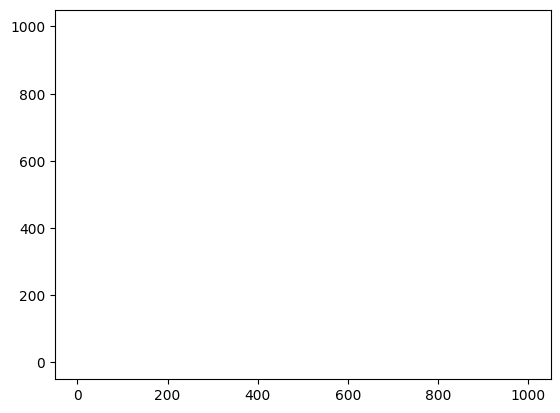

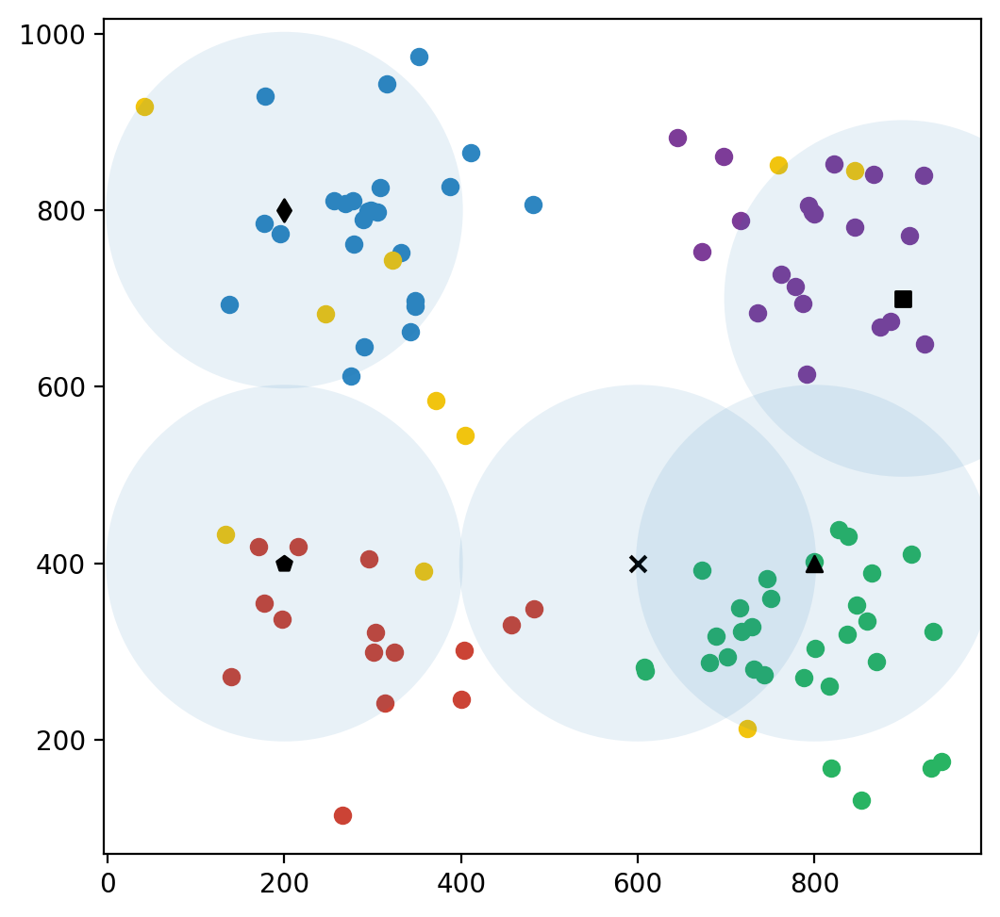

Number of user connected in  330  episode is:  82
331
332
333
334
335
336
337
338
339
340
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.1 , 0.05, 0.  , 3.  , 0.1 , 0.05, 3.  , 0.  , 0.1 ,
        0.05, 3.  , 0.  , 0.1 , 0.05, 1.  , 2.  , 0.1 , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[3.        , 1.        , 0.13333333, 0.12      , 1.        ,
        3.        , 0.13333333, 0.12      , 4.        , 0.        ,
        0.13333333, 0.12      , 4.        , 0.        , 0.13333333,
        0.12      , 2.        , 2.        , 0.13333333, 0.12      ]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 

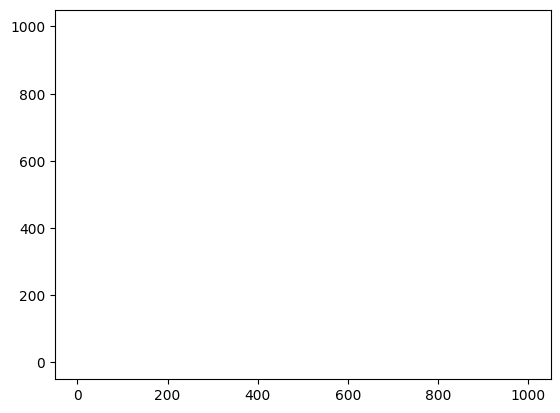

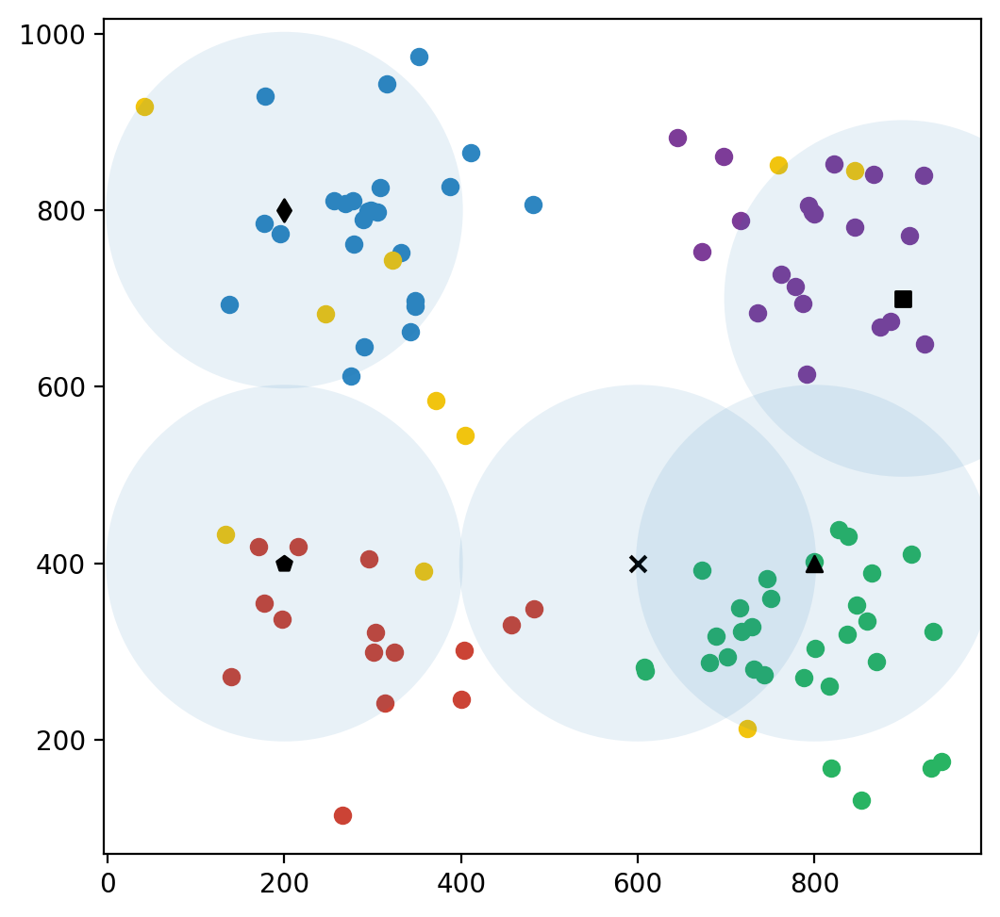

Number of user connected in  340  episode is:  82
341
342
343
344
345
346
347
348
349
350
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 1.        , 1.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 2.        , 1.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

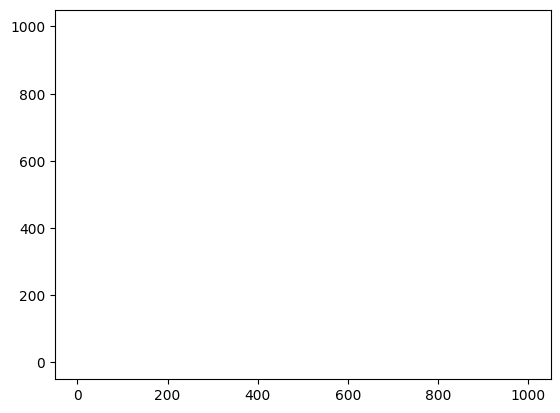

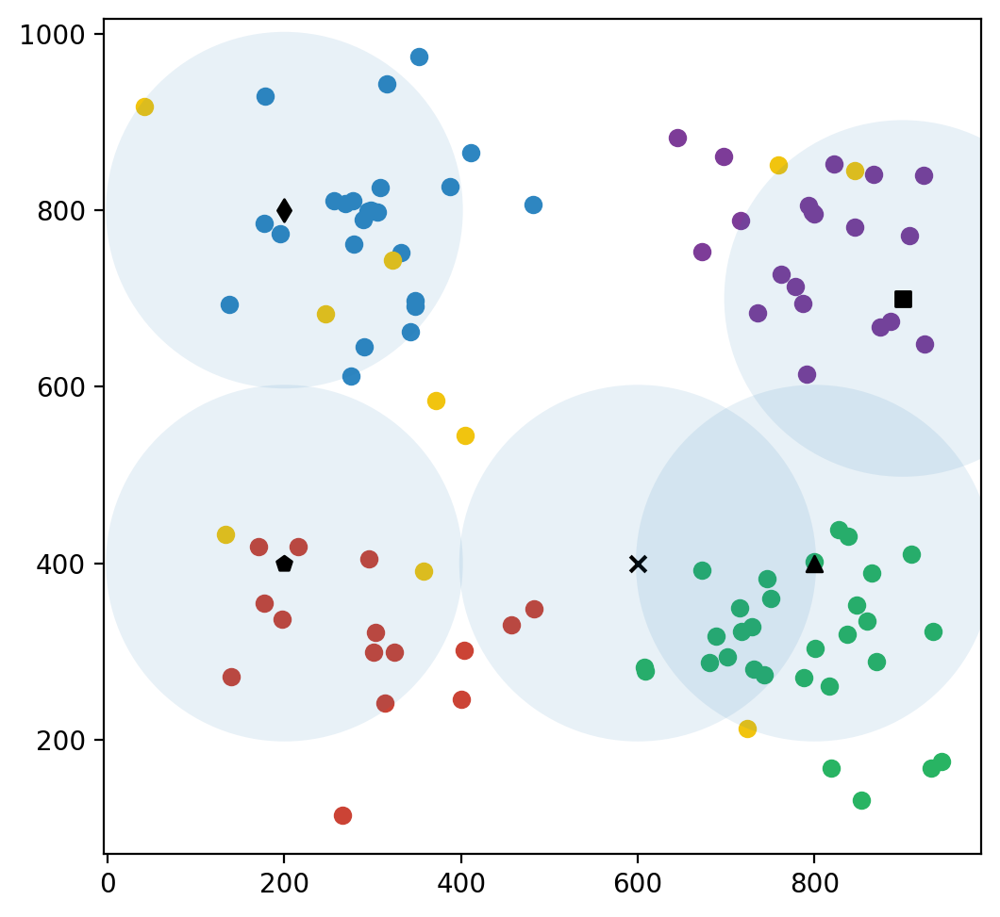

Number of user connected in  350  episode is:  82
351
352
353
354
355
356
357
358
359
360
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.03333333, 0.06      , 1.        ,
        2.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 2.        , 1.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 3.  , 1.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'emp

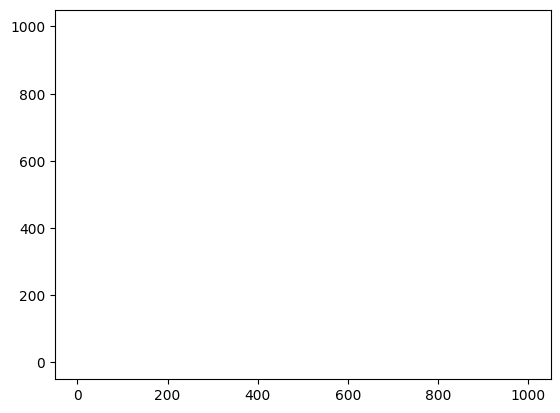

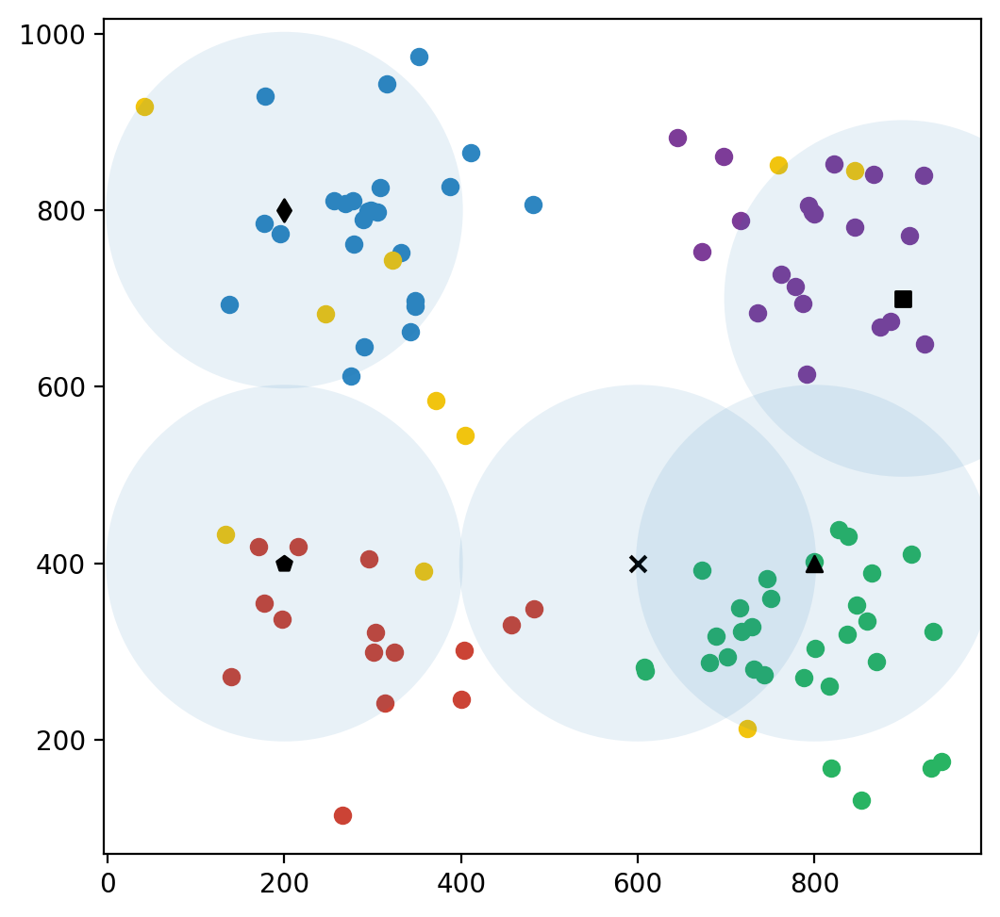

Number of user connected in  360  episode is:  82
361
362
363
364
365
366
367
368
369
370
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 0.  , 4.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[2.  , 3.  , 0.1 , 0.15, 0.  , 4.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.

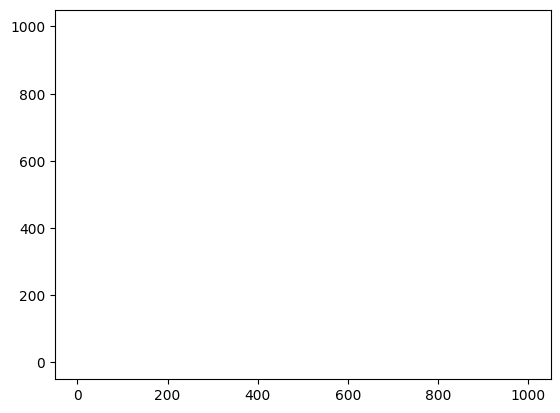

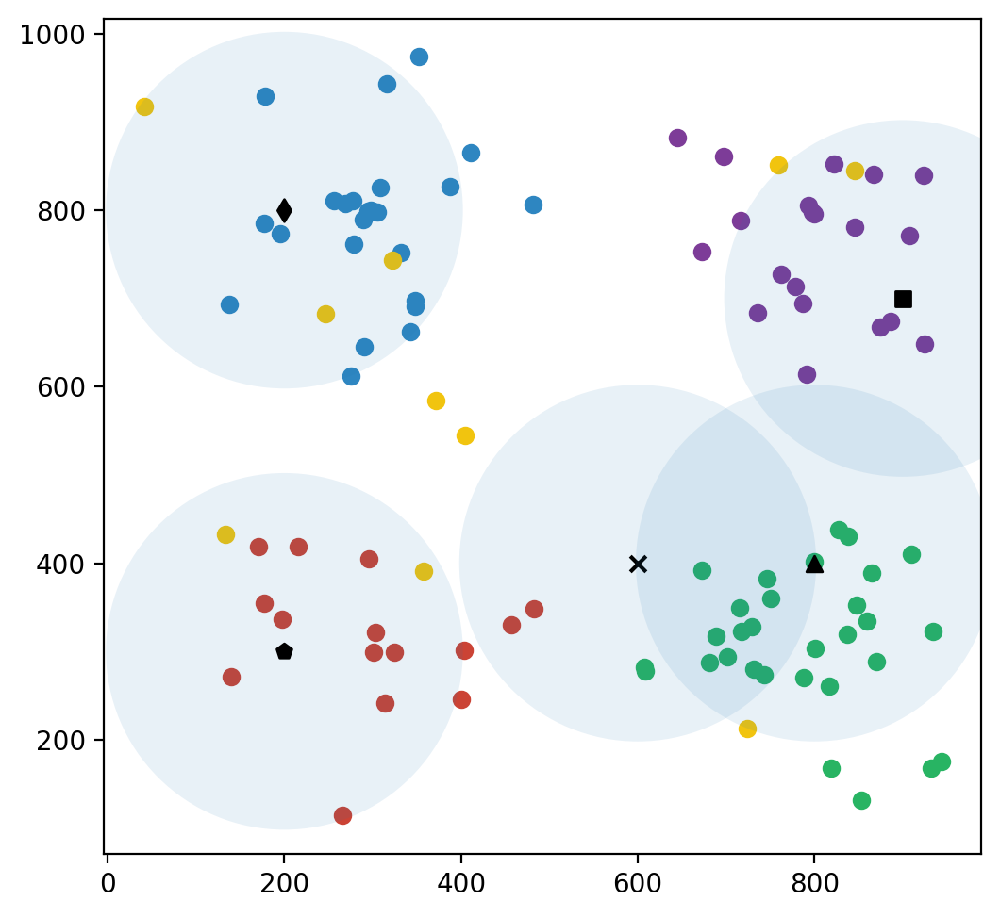

Number of user connected in  370  episode is:  83
371
372
373
374
375
376
377
378
379
380
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 0.  , 3.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1. , 1.4, 1.4, 1.4]), True, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 0.  , 4.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.1

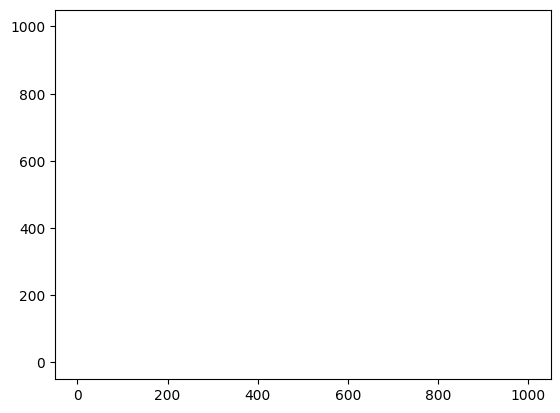

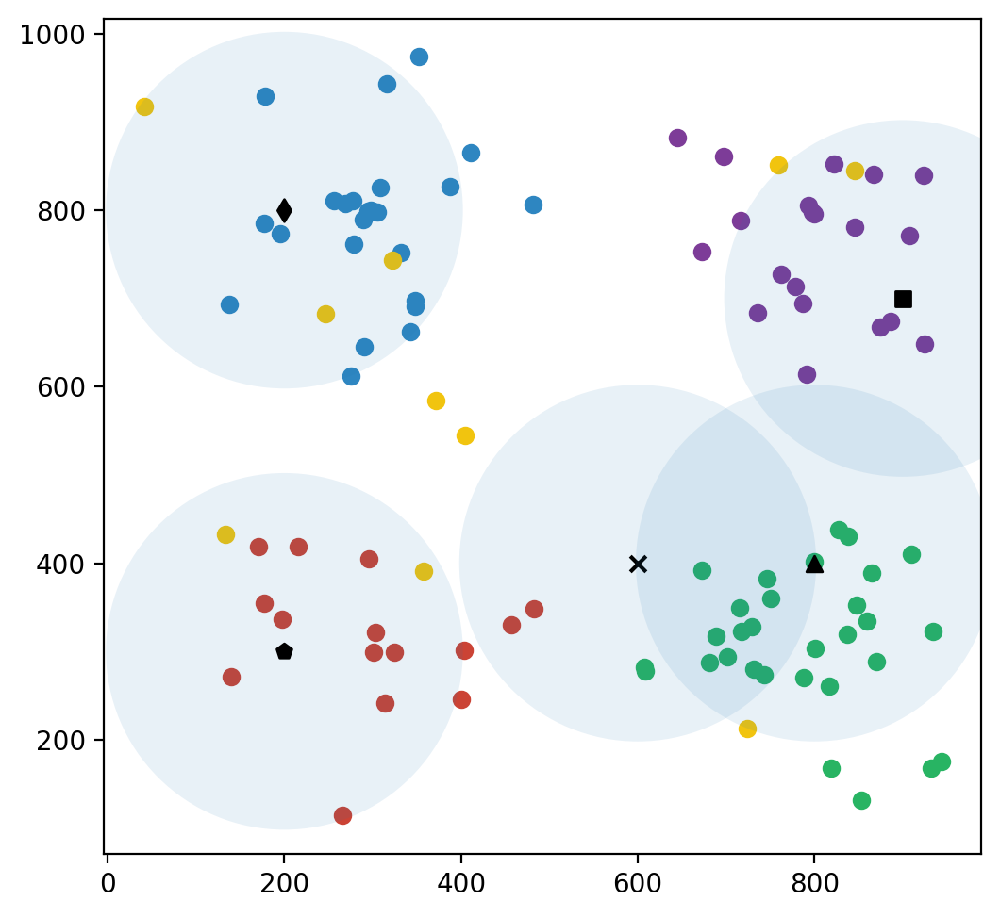

Number of user connected in  380  episode is:  83
381
382
383
384
385
386
387
388
389
390
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[1.        , 1.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[1.        , 2.        , 0.03333333, 0.06      , 1.        ,
        2.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  

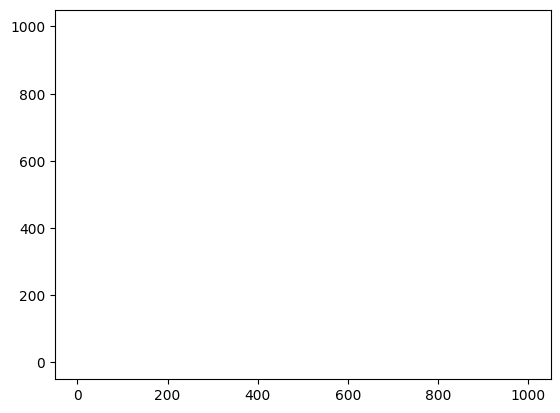

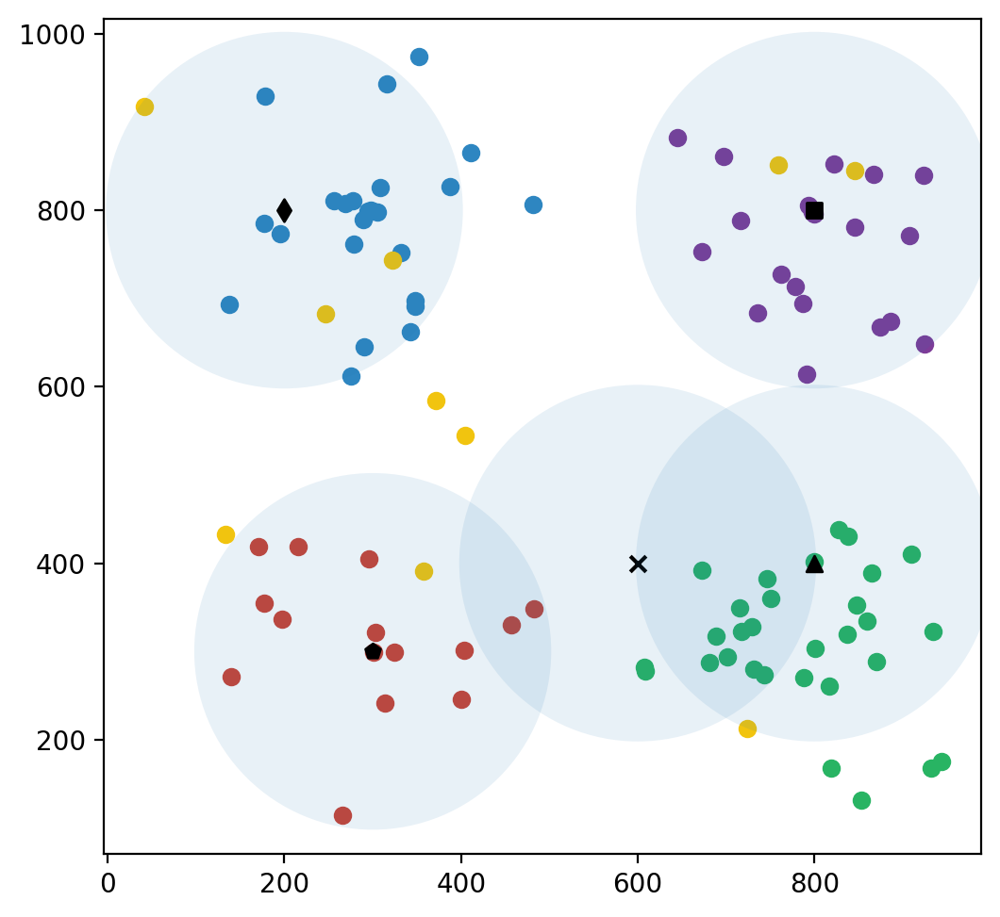

Number of user connected in  390  episode is:  87
391
392
393
394
395
396
397
398
399
400
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.03333333, 0.06      , 1.        ,
        2.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 2.        , 1.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 

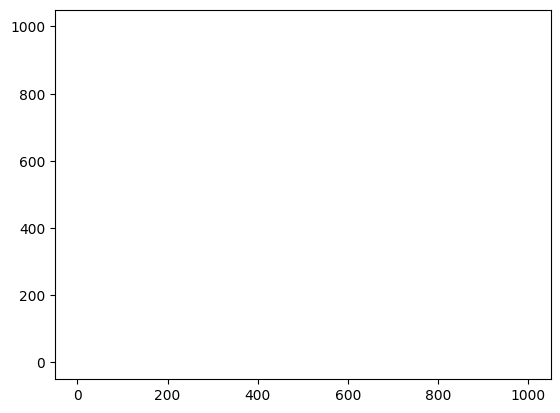

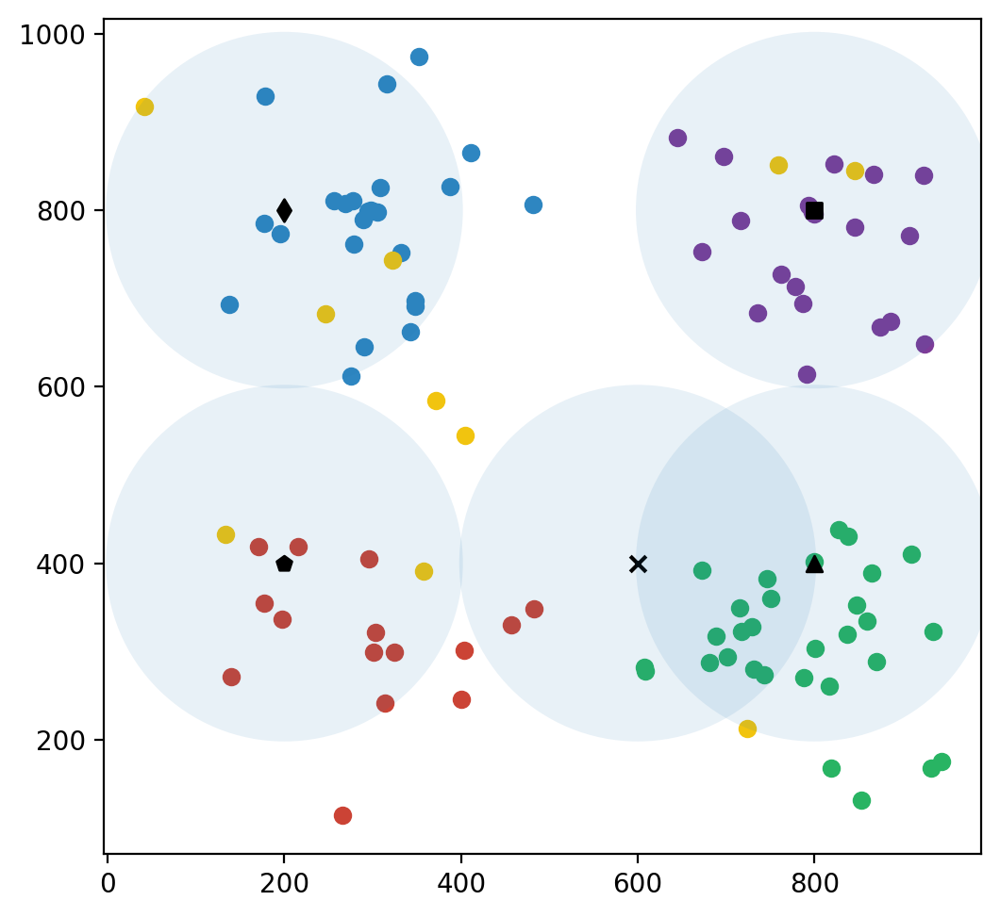

Number of user connected in  400  episode is:  85
401
402
403
404
405
406
407
408
409
410
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 2.        ,
        0.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.13333333, 0.06      , 2.        ,
        1.        , 0.13333333, 0.06      , 2.        , 1.        ,
        0.13333333, 0.06      , 2.        , 1.        , 0.13333333,
        0.06      , 0.        , 3.        , 0.13333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.        , 1.        , 0.06666667, 0.11

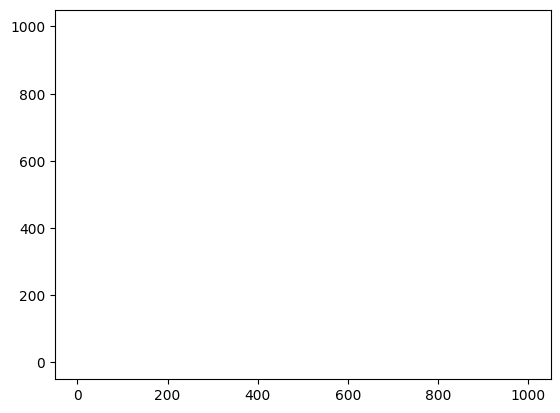

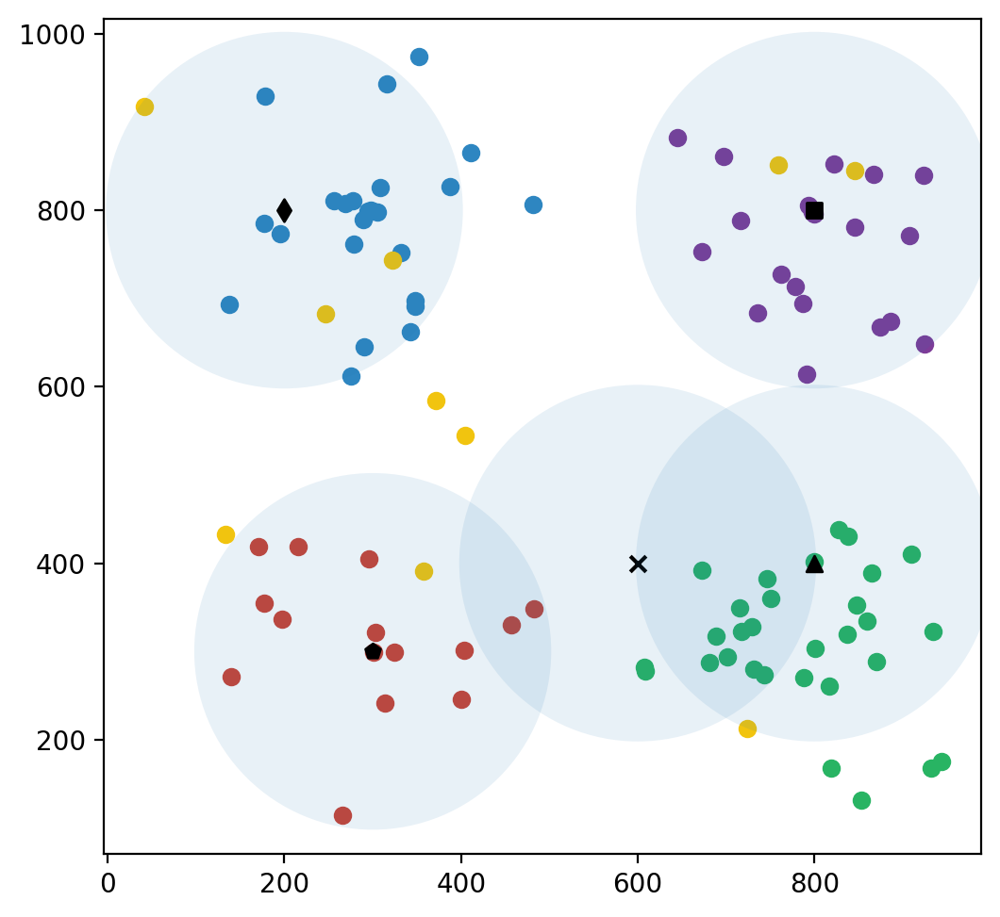

Number of user connected in  410  episode is:  87
411
412
413
414
415
416
417
418
419
420
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 2.  , 2.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

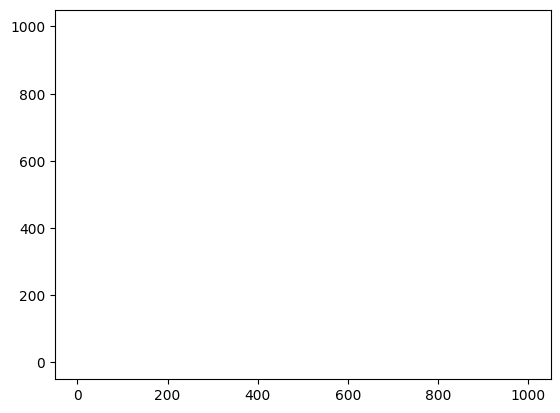

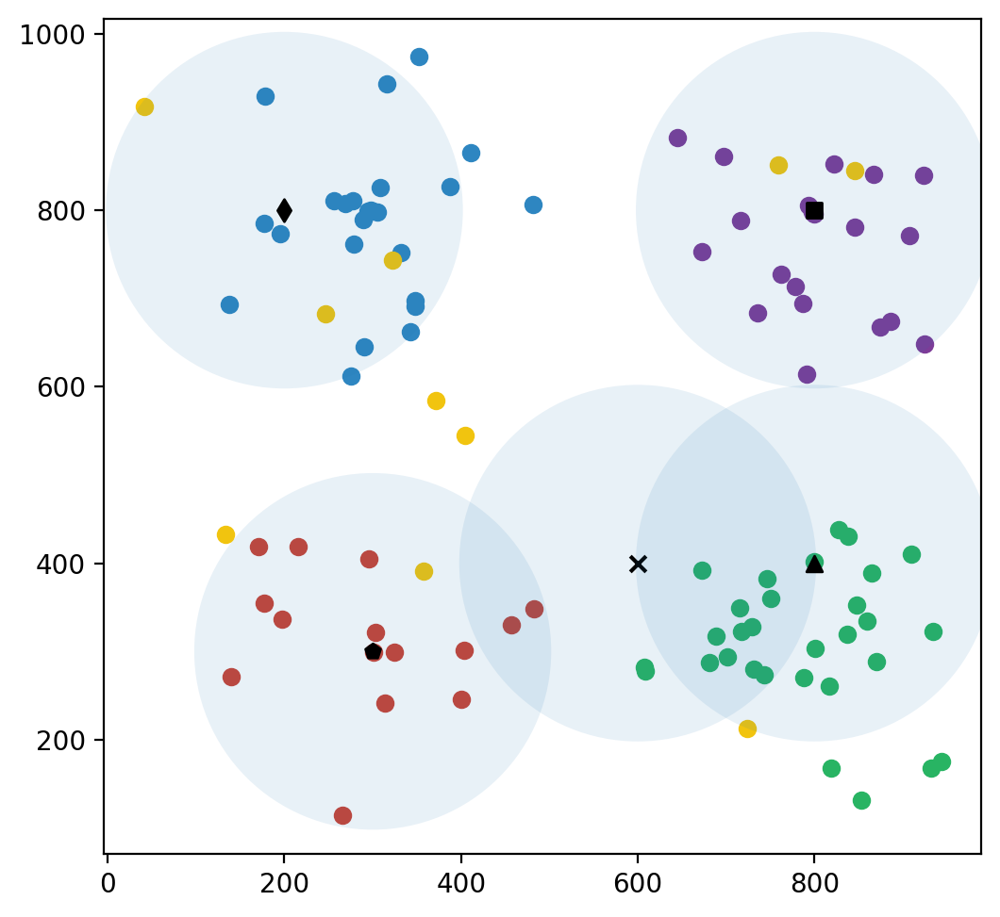

Number of user connected in  420  episode is:  87
421
422
423
424
425
426
427
428
429
430
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.

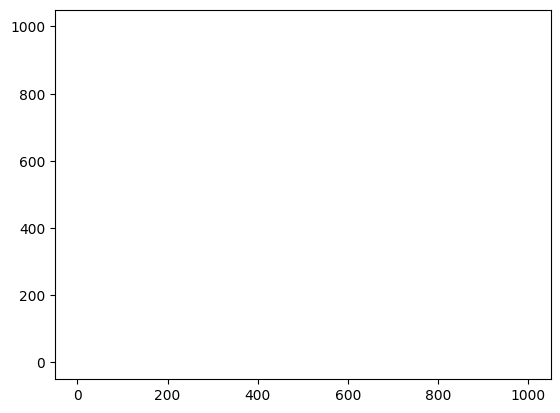

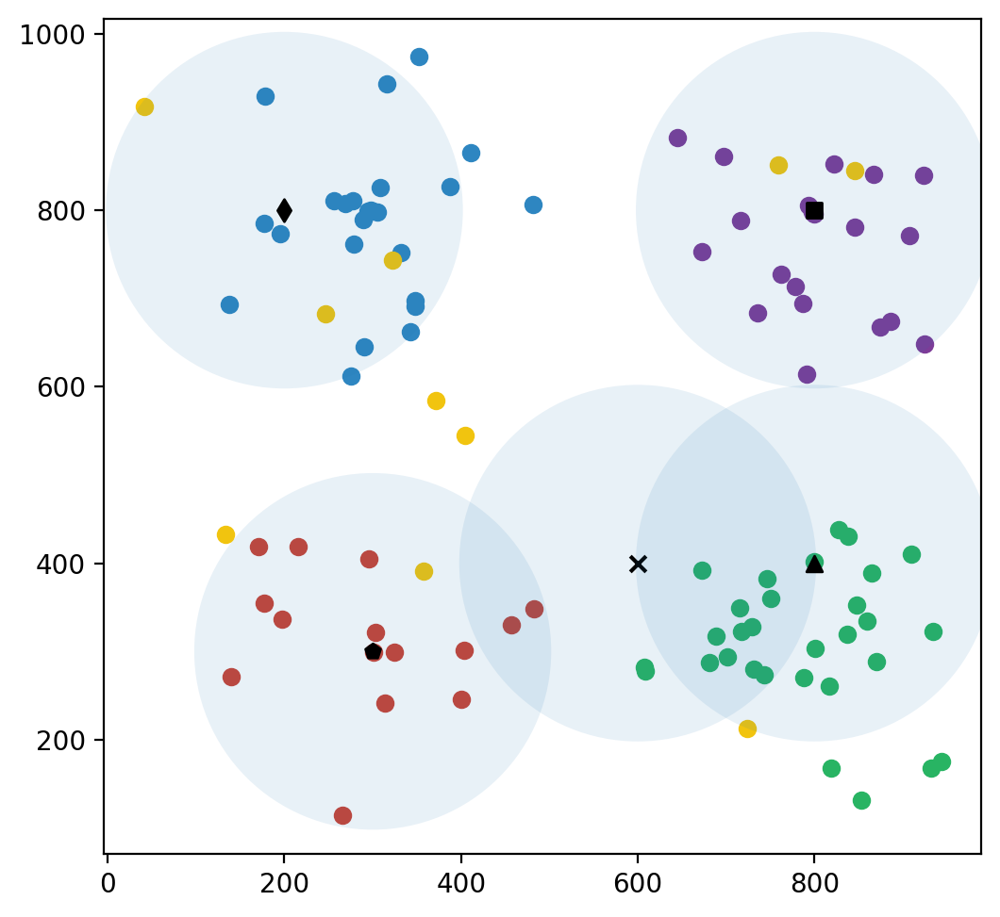

Number of user connected in  430  episode is:  87
431
432
433
434
435
436
437
438
439
440
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.        , 0.        , 0.03333333, 0.06      , 1.        ,
        2.        , 0.03333333, 0.06      , 2.        , 1.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.  , 0.  , 0.2 , 0.12, 2.  , 2.  , 0.2 

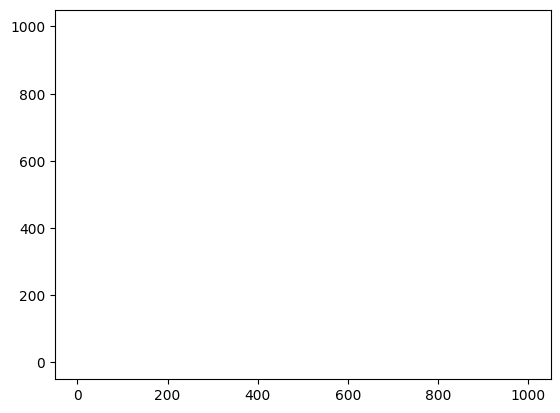

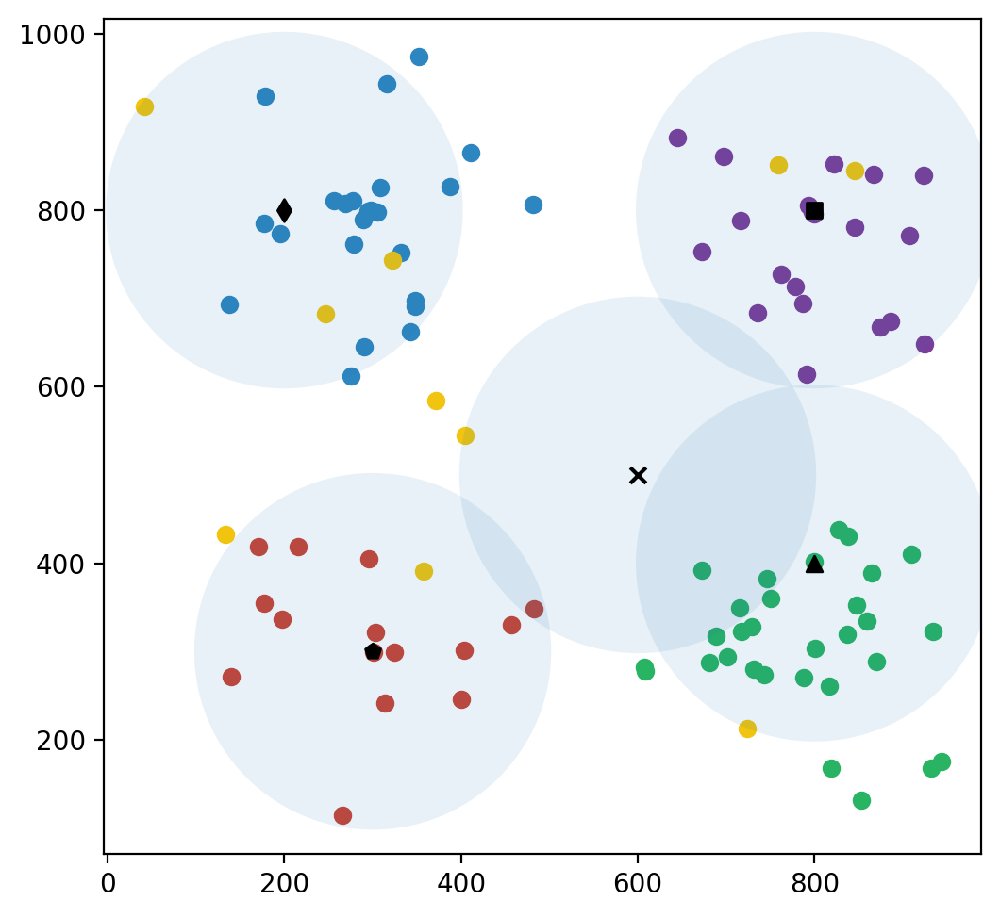

Number of user connected in  440  episode is:  86
441
442
443
444
445
446
447
448
449
450
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.  , 2.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.

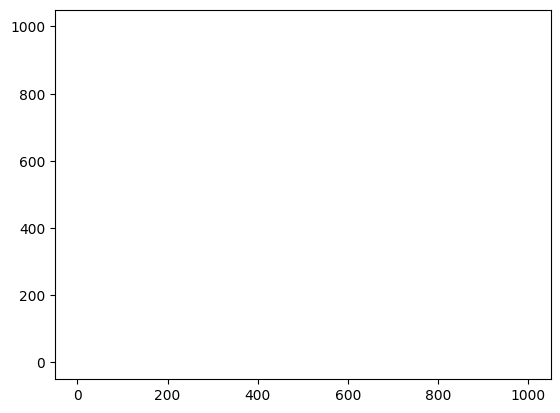

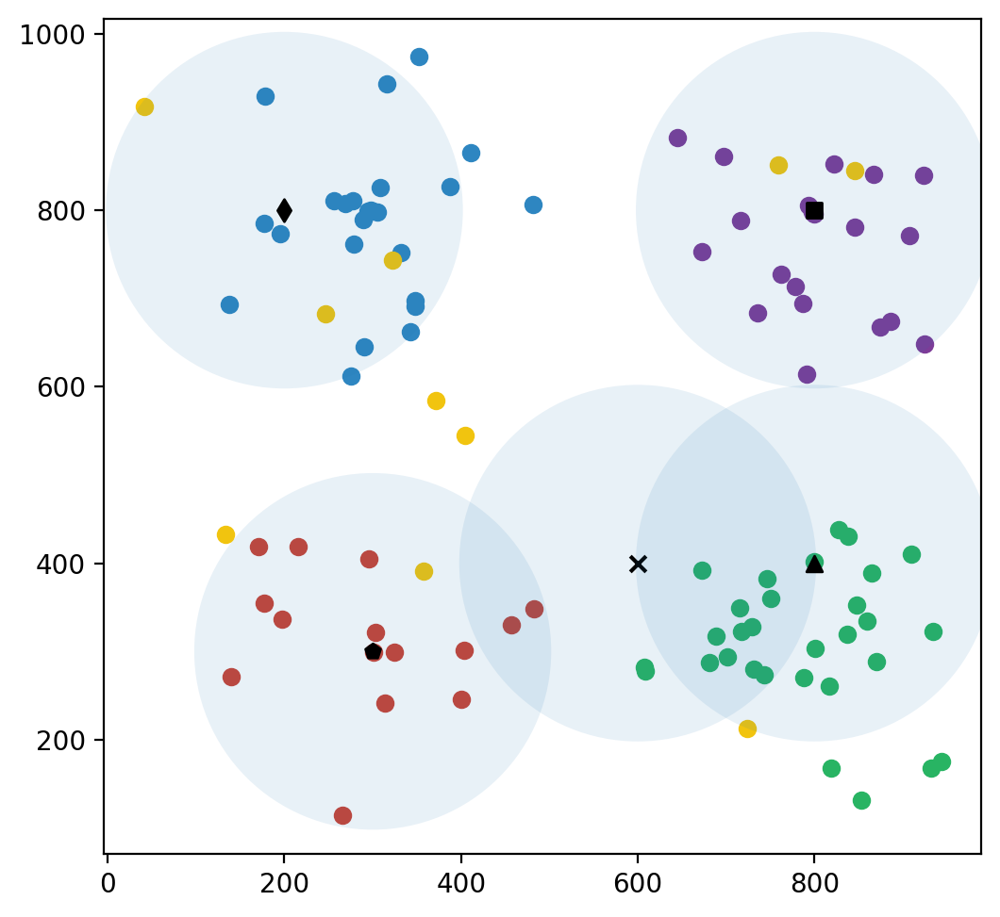

Number of user connected in  450  episode is:  87
451
452
453
454
455
456
457
458
459
460
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 4.  , 0.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 4.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 4.  , 1.  , 0.  , 0.15, 1.  , 4.  , 0.

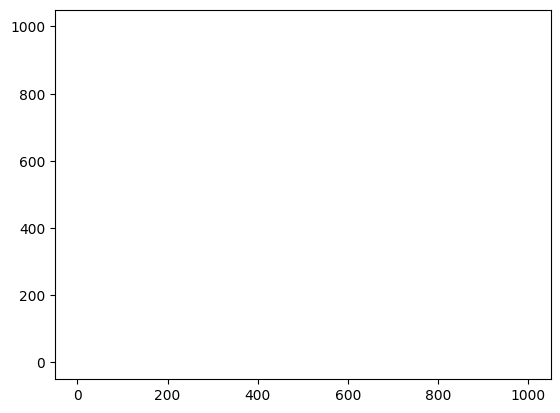

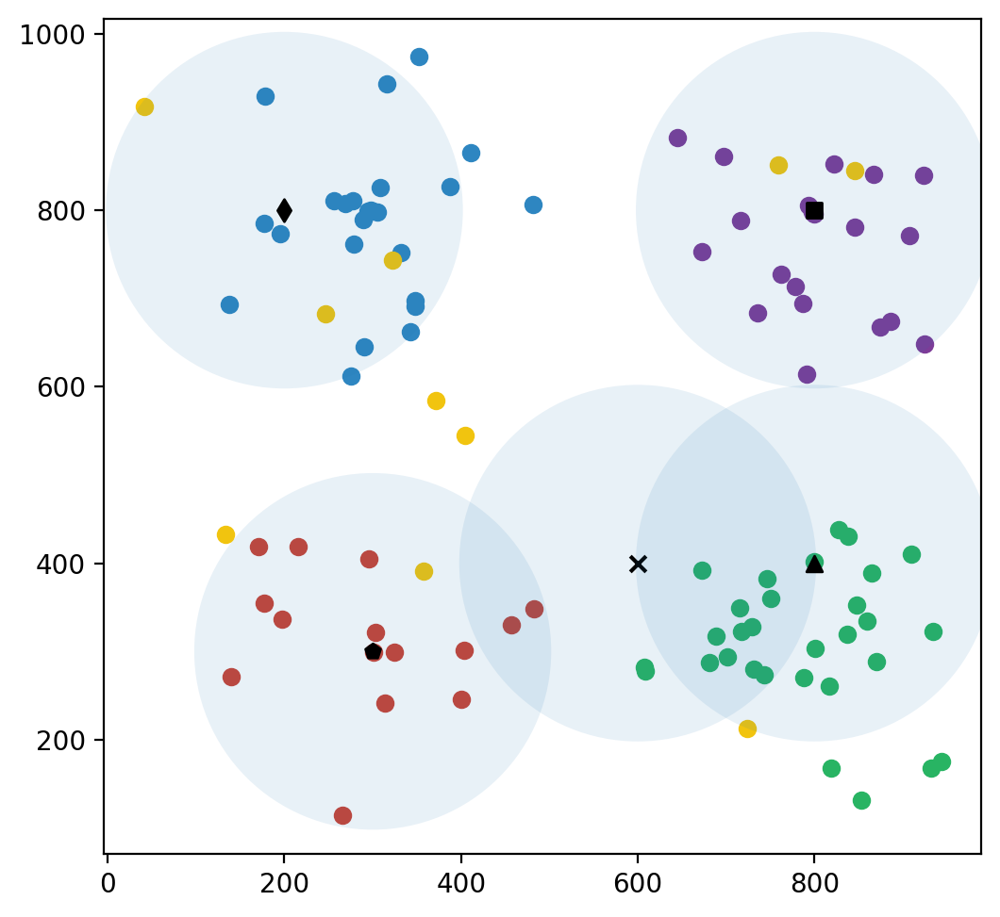

Number of user connected in  460  episode is:  87
461
462
463
464
465
466
467
468
469
470
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[3.  , 0.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09, 3.  , 1.  , 0.  ,
        0.09, 2.  , 2.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09]]), array([0.4, 0.8, 0.8, 0.8, 0.8]), True, 'empty', 9)
(array([[3.  , 1.  , 0.3 , 0.15, 3.  , 2.  , 0.3 , 0.15, 4.  , 1.  , 0.3 ,
        0.15, 3.  , 2.  , 0.3 , 0.15, 2.  , 3.  , 0.3 , 0.1

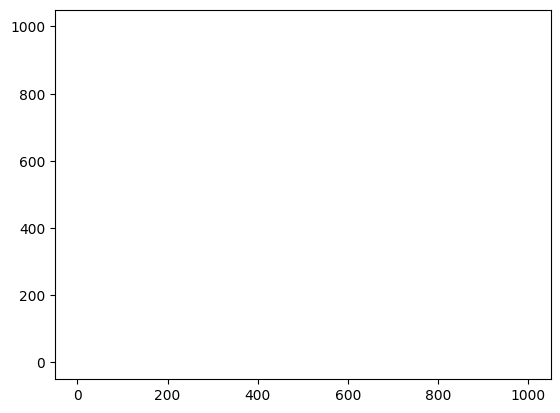

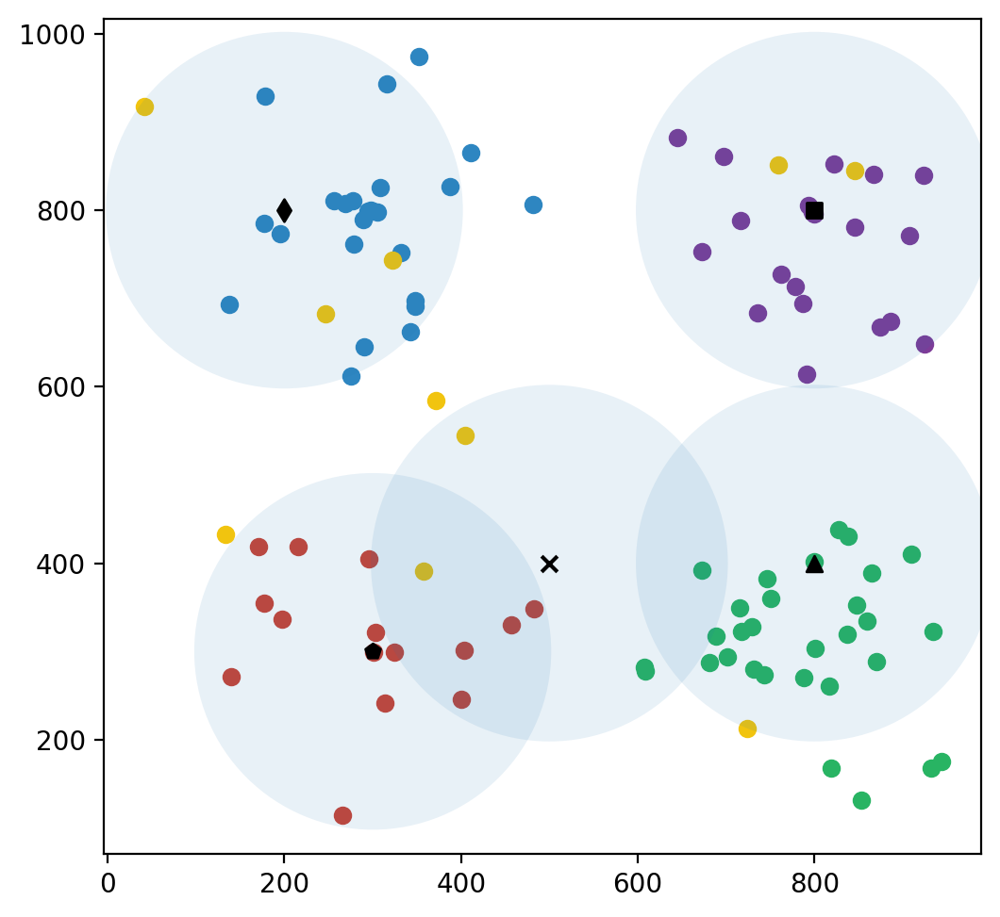

Number of user connected in  470  episode is:  88
471
472
473
474
475
476
477
478
479
480
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 3.  , 2.  , 0.  , 0.15, 2.  , 3.  , 0.

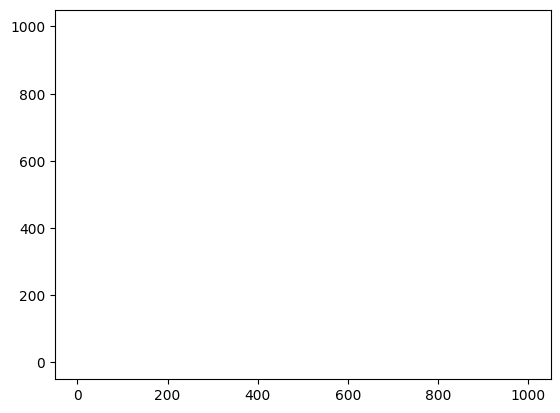

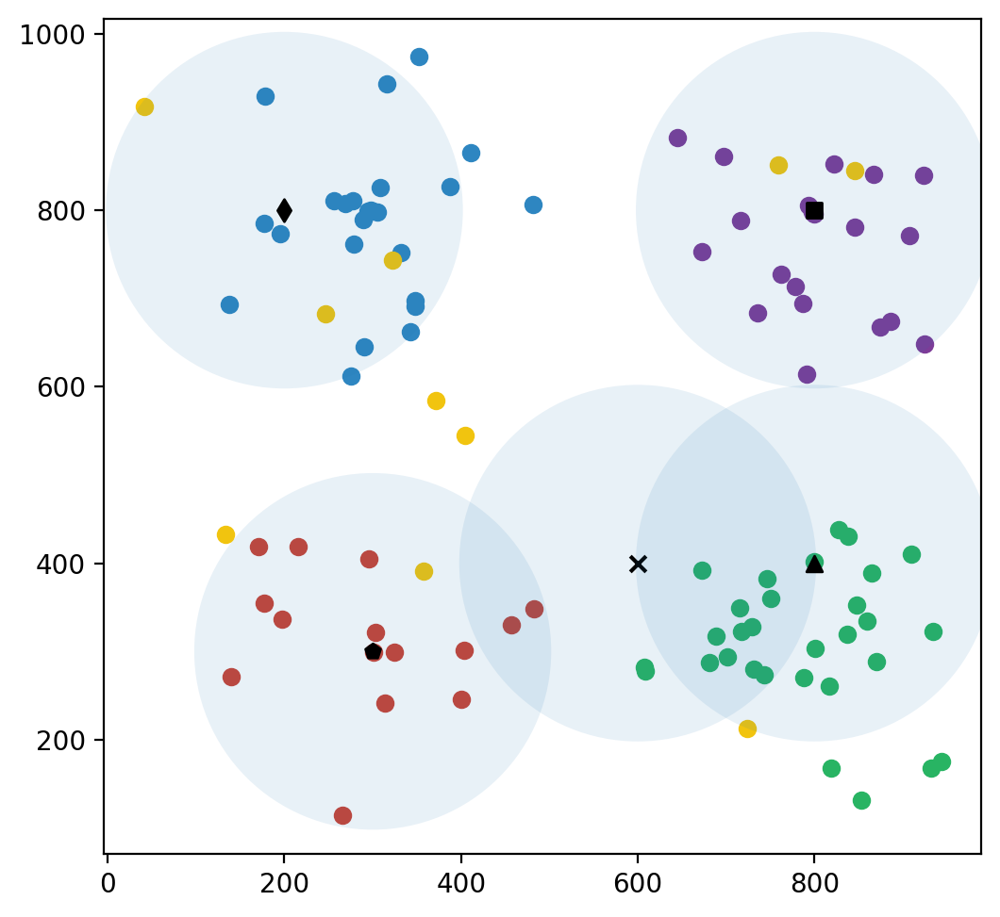

Number of user connected in  480  episode is:  87
481
482
483
484
485
486
487
488
489
490
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  , 0.11, 4.  , 0.  , 0.  ,
        0.11, 2.  , 2.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.

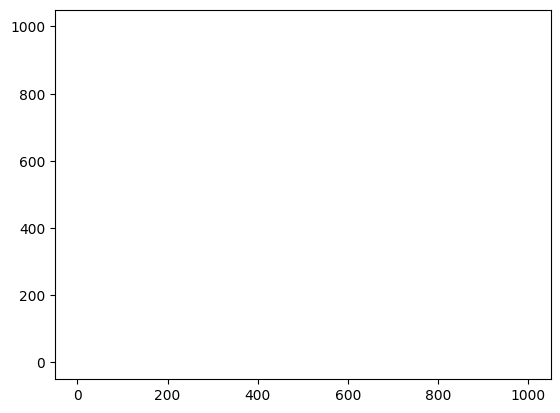

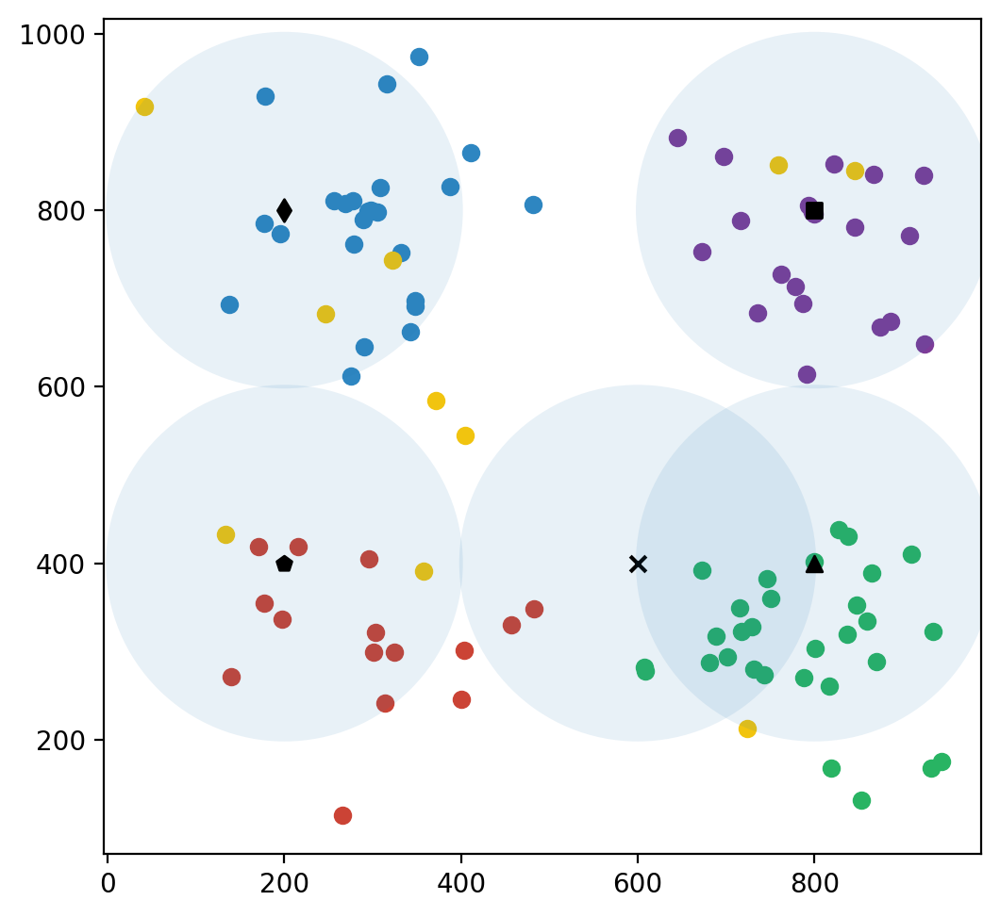

Number of user connected in  490  episode is:  85
491
492
493
494
495
496
497
498
499
500
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.05, 3.  , 0.  , 0.1 , 0.05, 3.  , 0.  , 0.1 ,
        0.05, 3.  , 0.  , 0.1 , 0.05, 1.  , 2.  , 0.1 , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 3.  , 1.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

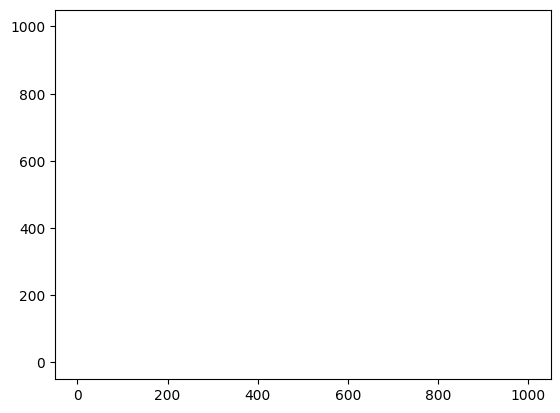

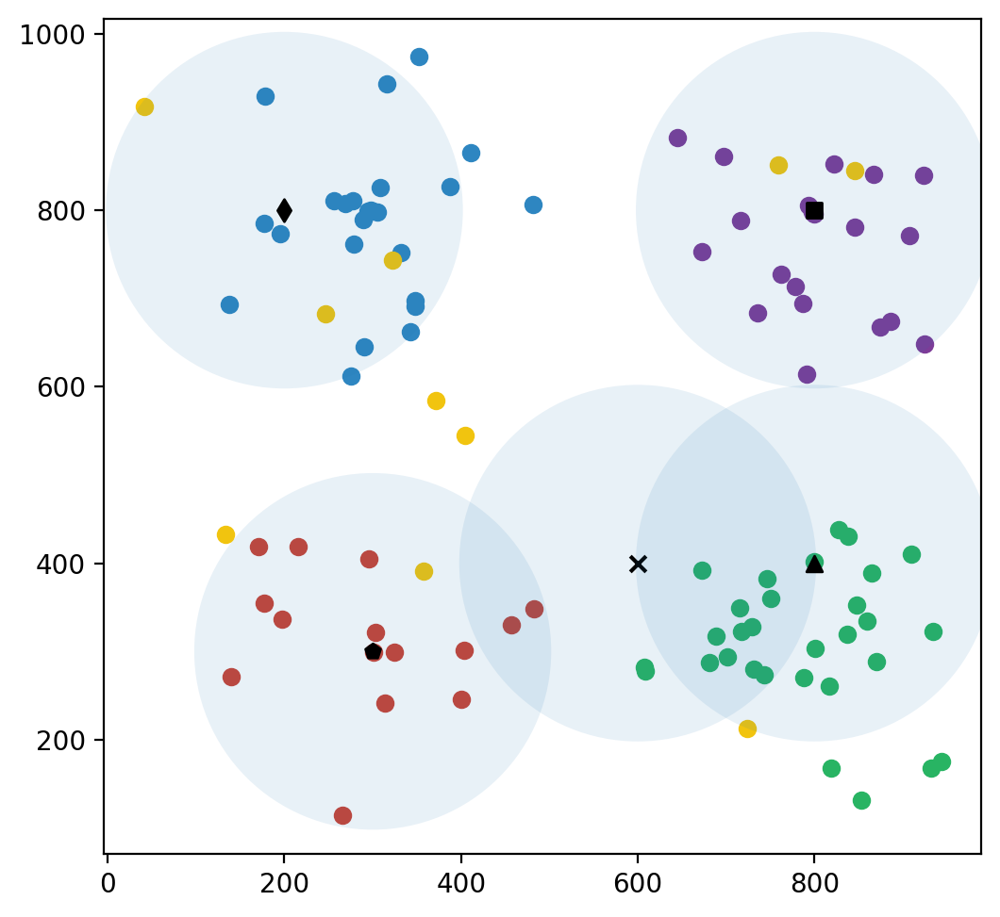

Number of user connected in  500  episode is:  87
501
502
503
504
505
506
507
508
509
510
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 1.        , 1.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 2.  , 2.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 

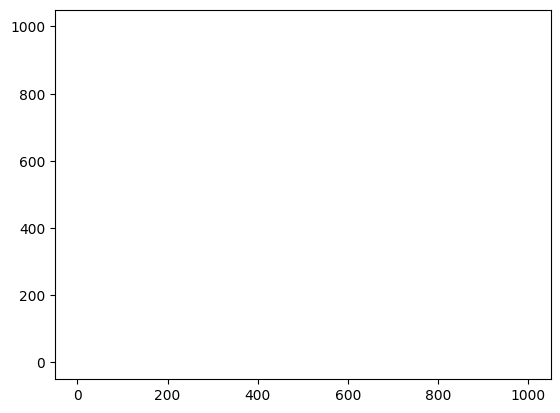

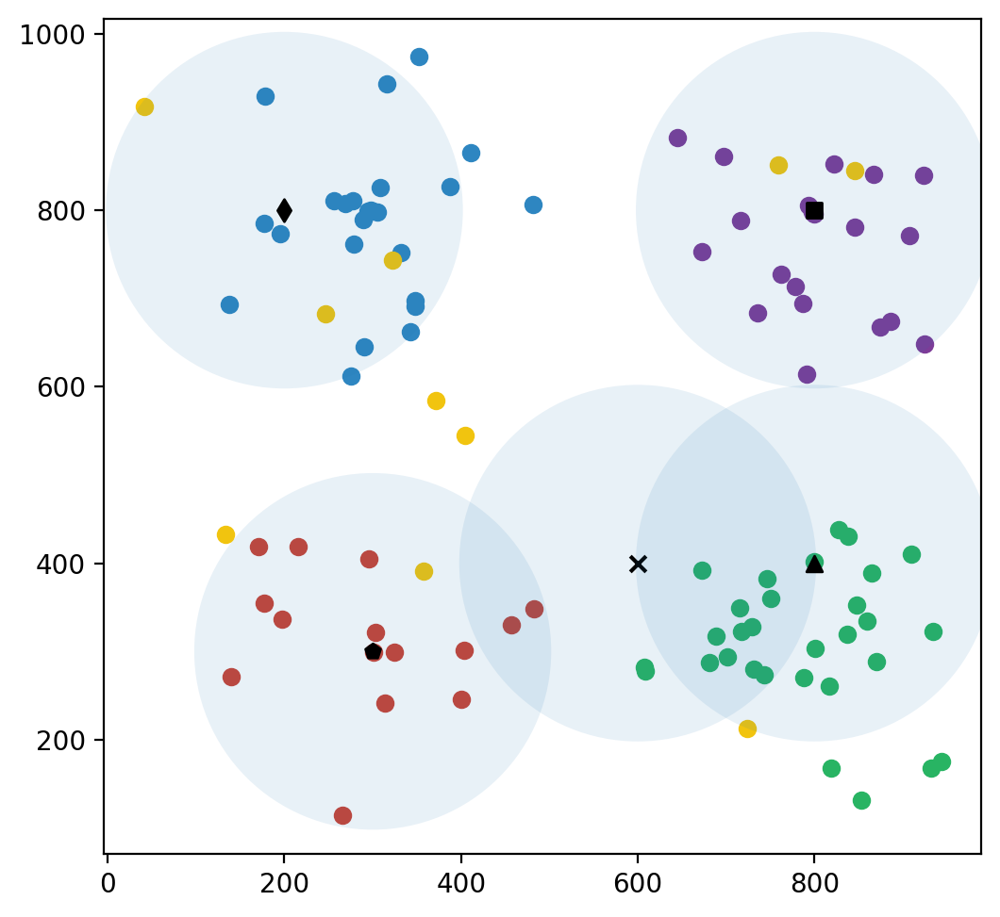

Number of user connected in  510  episode is:  87
511
512
513
514
515
516
517
518
519
520
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.        , 0.        , 0.03333333, 0.02      , 1.        ,
        1.        , 0.03333333, 0.02      , 1.        , 1.        ,
        0.03333333, 0.02      , 2.        , 0.        , 0.03333333,
        0.02      , 0.        , 2.        , 0.03333333, 0.02      ]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 4.  , 0.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 

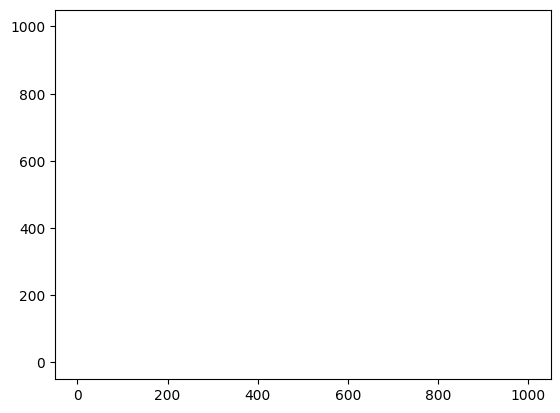

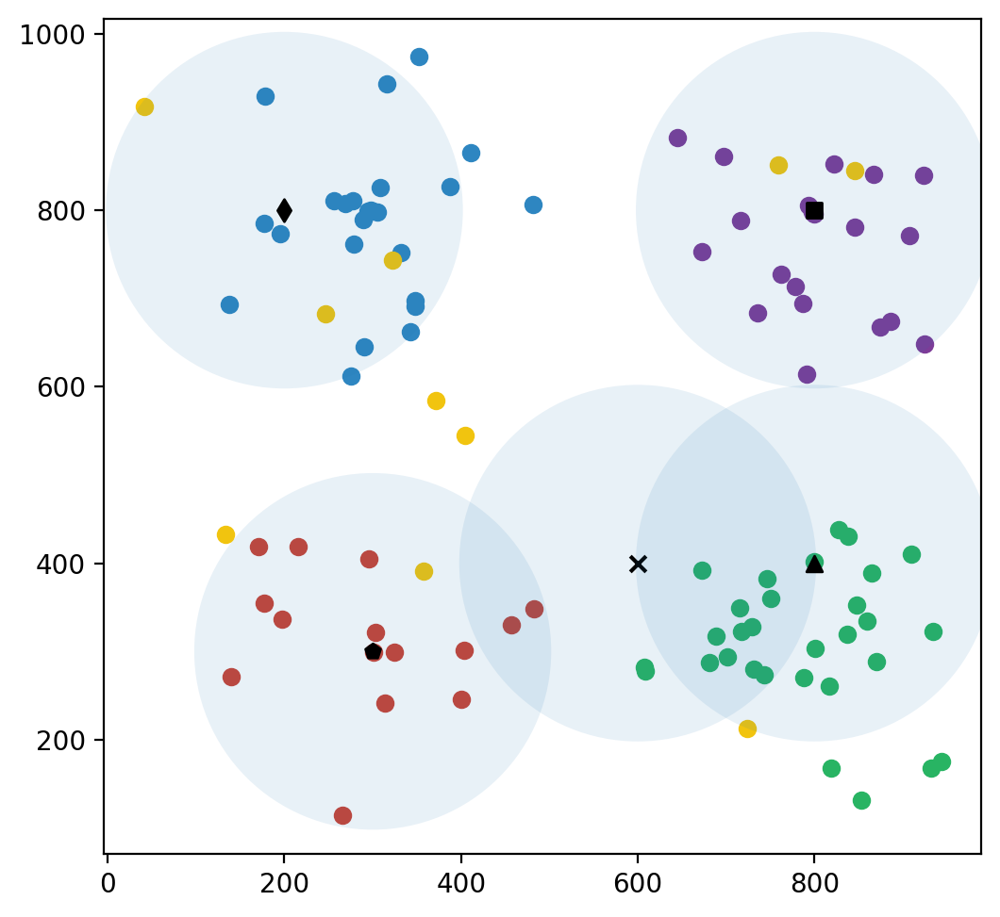

Number of user connected in  520  episode is:  87
521
522
523
524
525
526
527
528
529
530
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 2.  , 2.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 3.  , 2.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

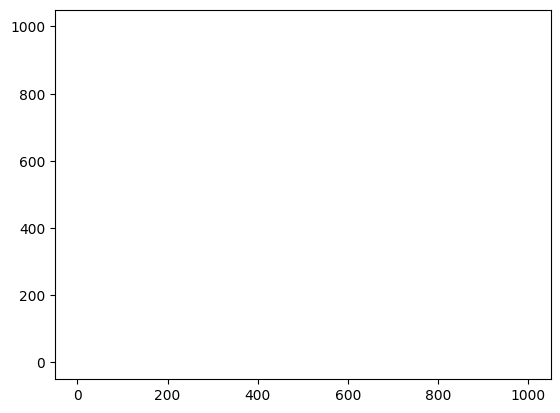

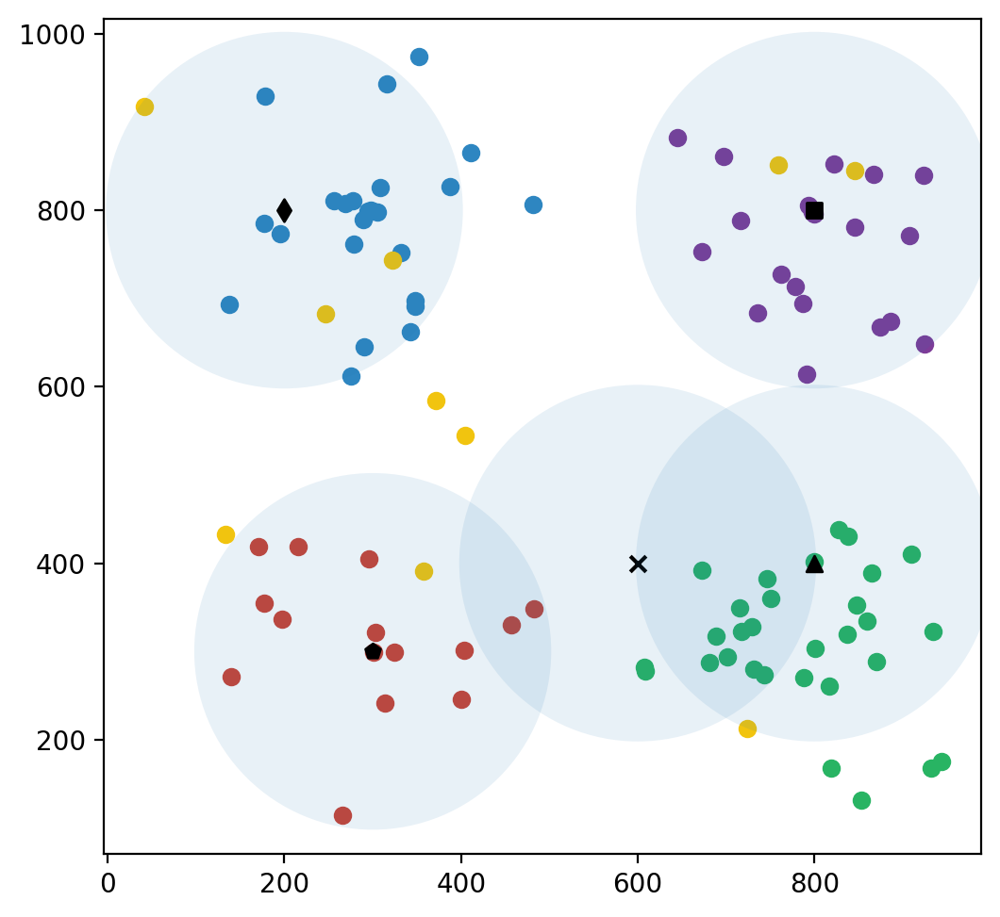

Number of user connected in  530  episode is:  87
531
532
533
534
535
536
537
538
539
540
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 4.  , 0.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.        , 2.        , 0.23333333, 0.15      , 3.        ,
        2.        , 0.23333333, 0.15      , 4.        , 1.     

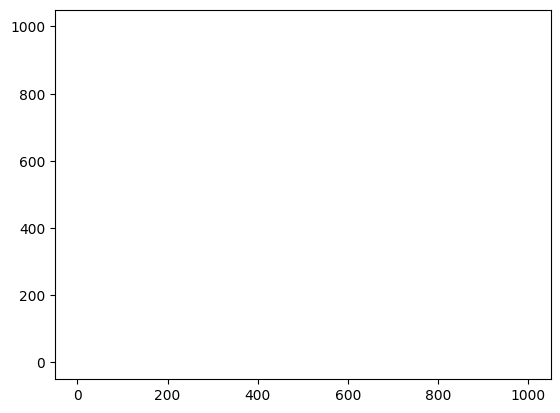

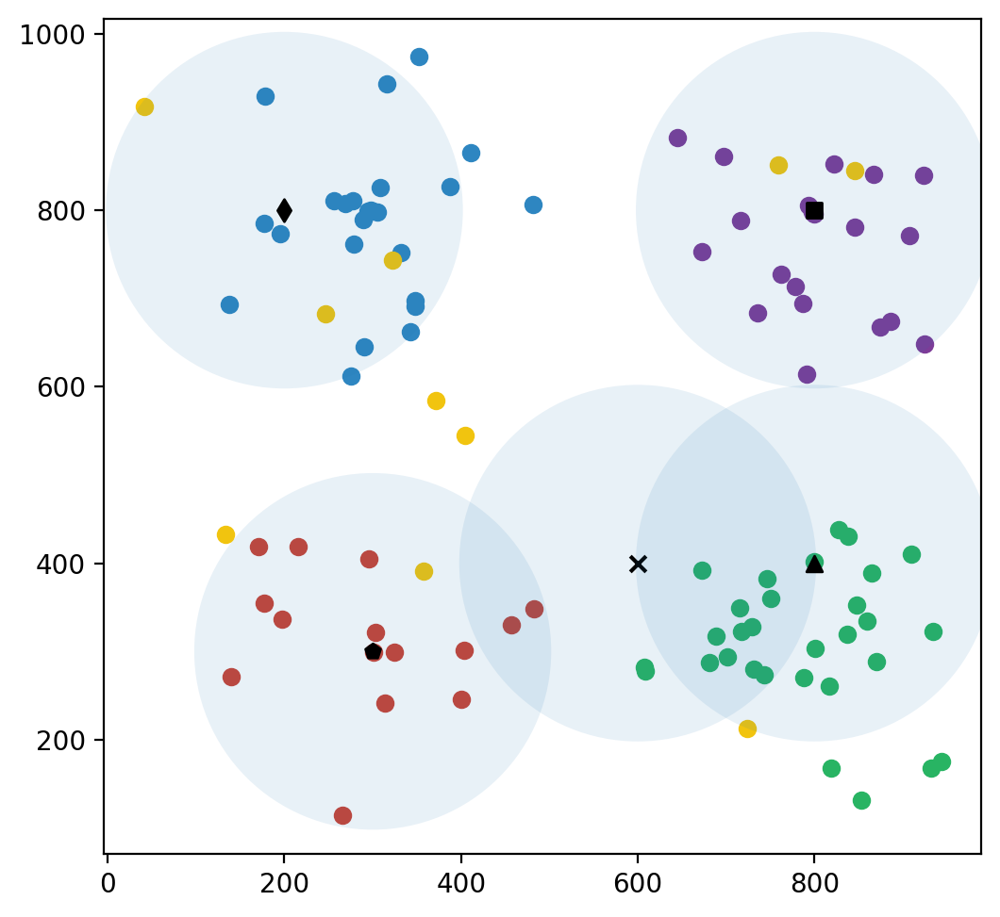

Number of user connected in  540  episode is:  87
541
542
543
544
545
546
547
548
549
550
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.        , 1.        , 0.03333333, 0.06      , 1.        ,
        2.        , 0.03333333, 0.06      , 3.        , 0.        ,
        0.03333333, 0.06      , 3.        , 0.        , 0.03333333,
        0.06      , 0.        , 3.        , 0.03333333, 0.06      ]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.2 , 0.12, 2.  , 2.  , 0.2 , 0.12, 3.  , 1.  , 0.2 ,
        0.12, 4.  , 0.  , 0.2 , 0.12, 1.  , 3.  , 0.2 , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'emp

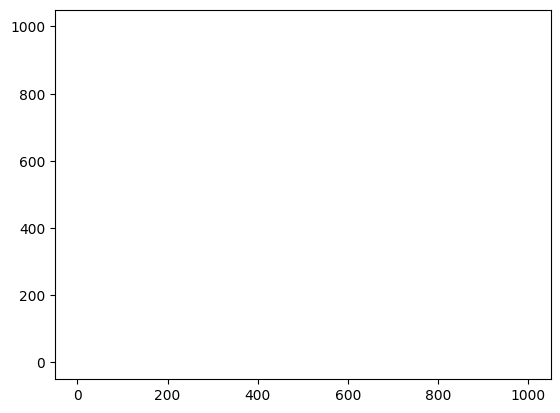

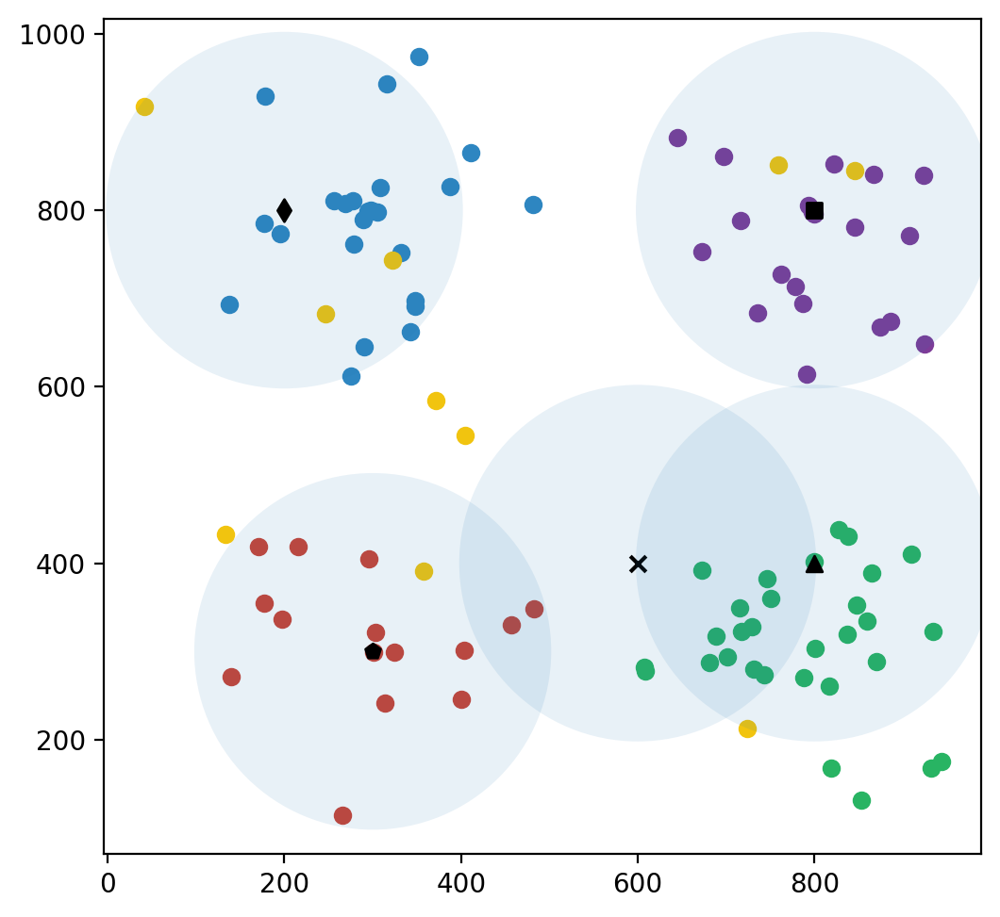

Number of user connected in  550  episode is:  87
551
552
553
554
555
556
557
558
559
560
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 4.  , 0.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

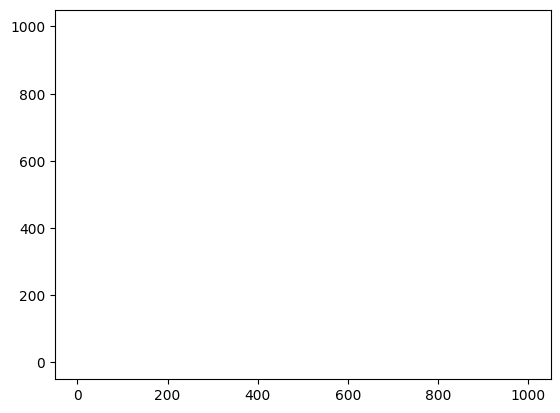

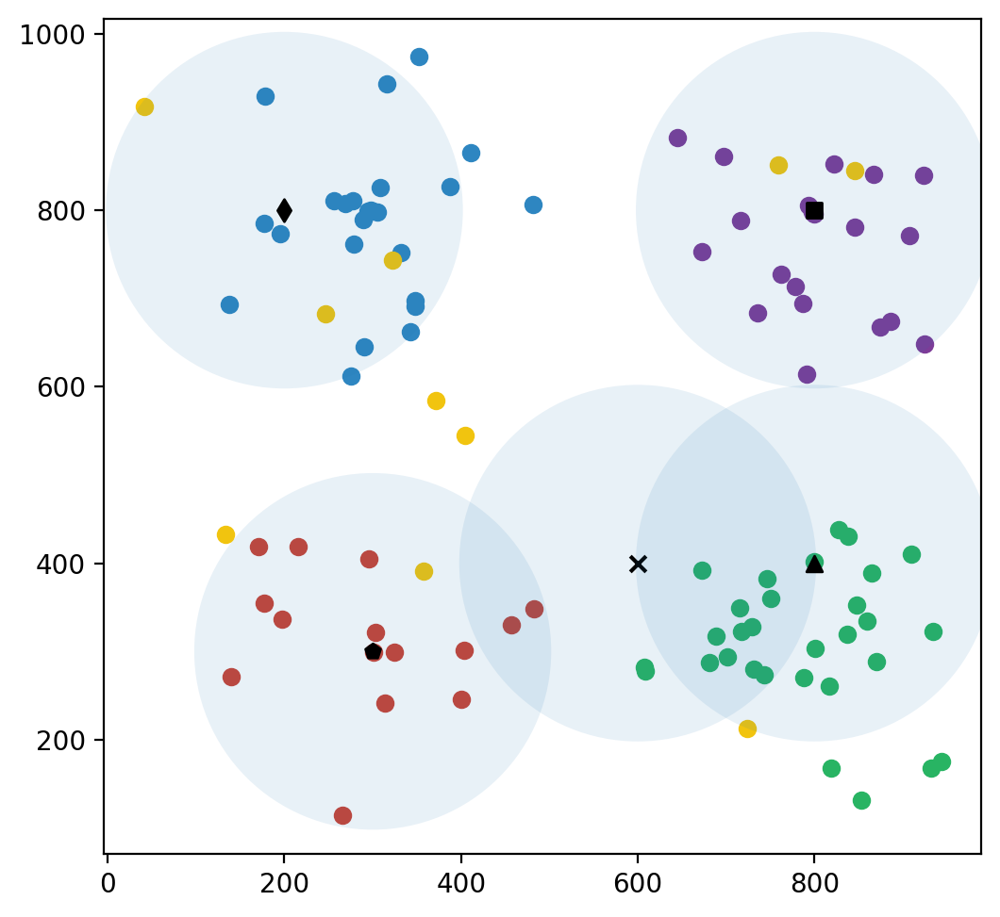

Number of user connected in  560  episode is:  87
561
562
563
564
565
566
567
568
569
570
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 4.  , 0.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.

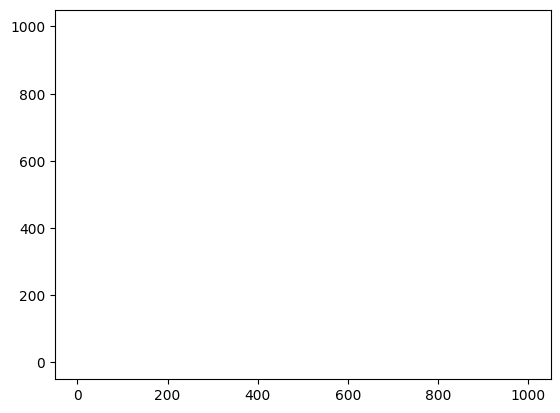

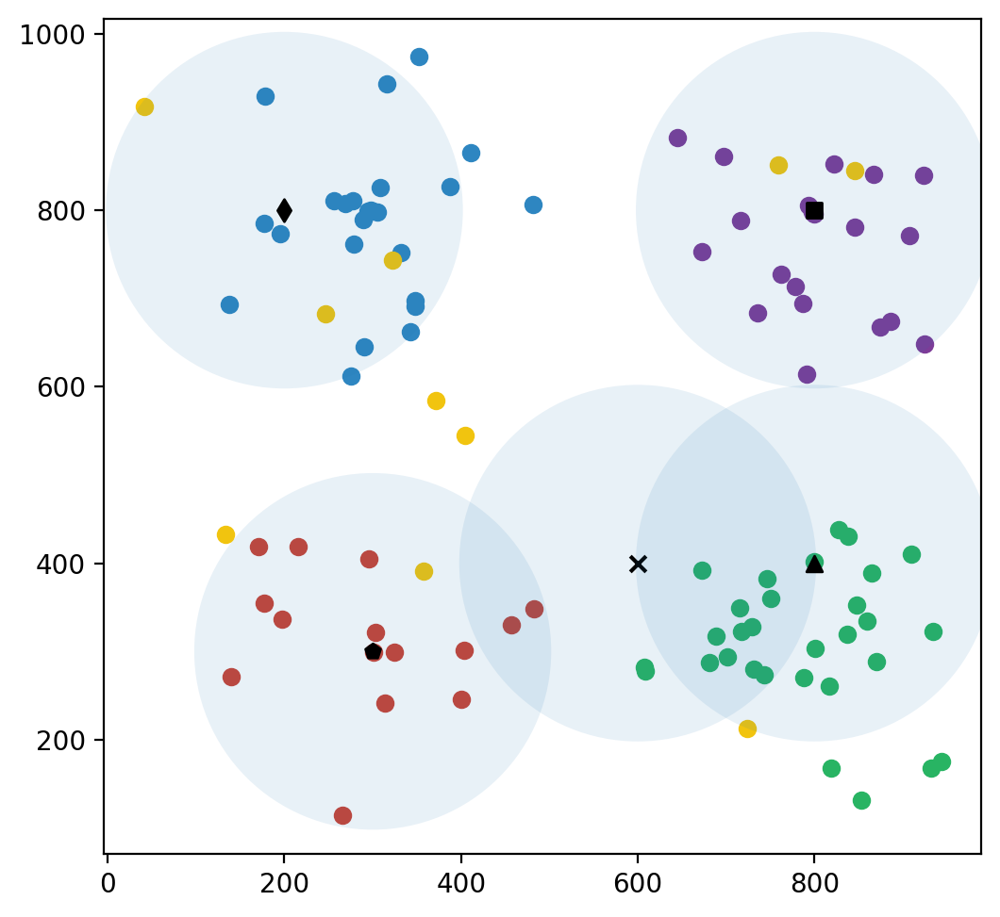

Number of user connected in  570  episode is:  87
571
572
573
574
575
576
577
578
579
580
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  , 0.11, 4.  , 0.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 4.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 4.  , 1.  , 0.  , 0.15, 1.  , 4.  , 0.  , 0

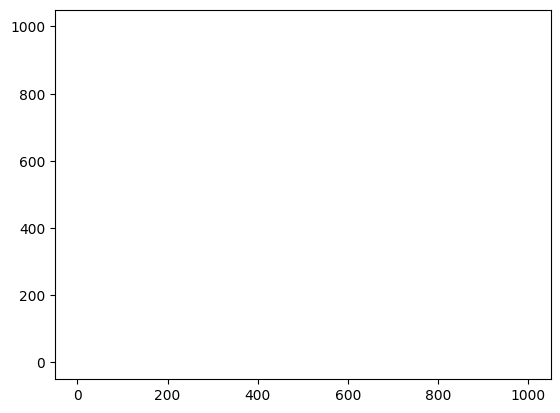

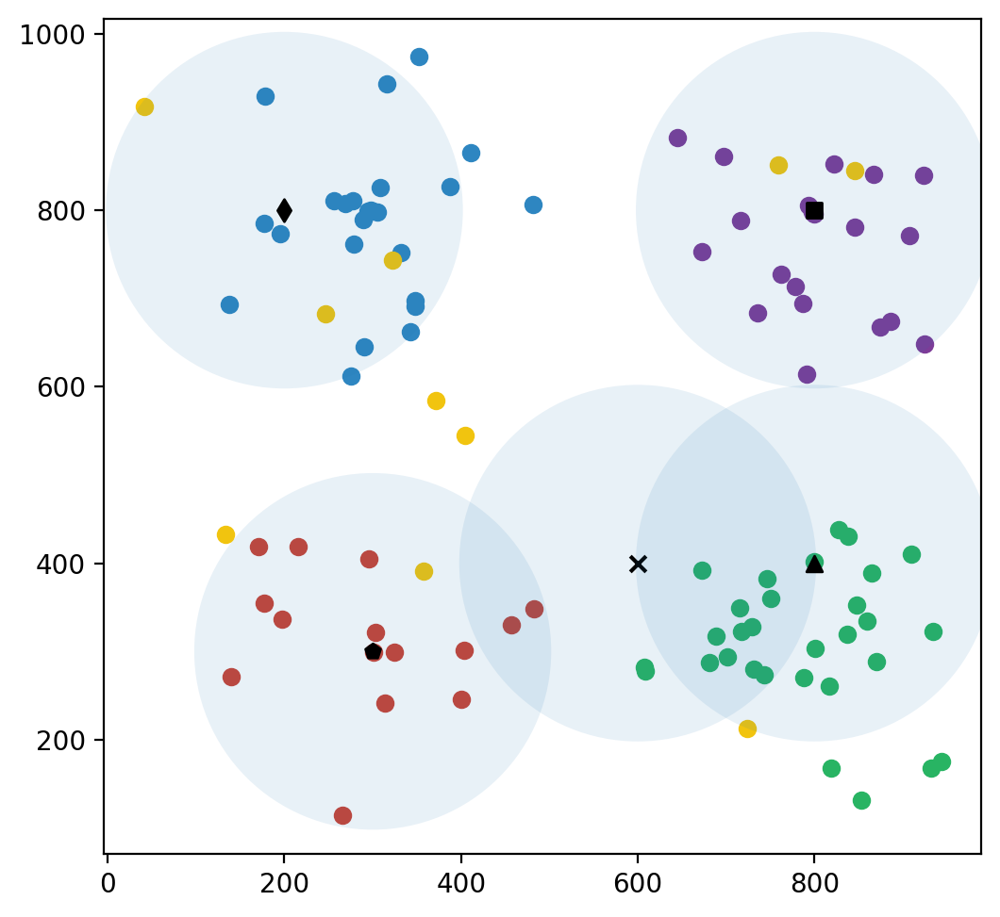

Number of user connected in  580  episode is:  87
581
582
583
584
585
586
587
588
589
590
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 2.  , 1.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[2.  , 2.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09, 3.  , 1.  , 0.  ,
        0.09, 4.  , 0.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09]]), array([0.8, 0.8, 0.8, 0.8, 0.8]), False, 'empty', 9)
(array([[2.  , 3.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 4.  , 1.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.

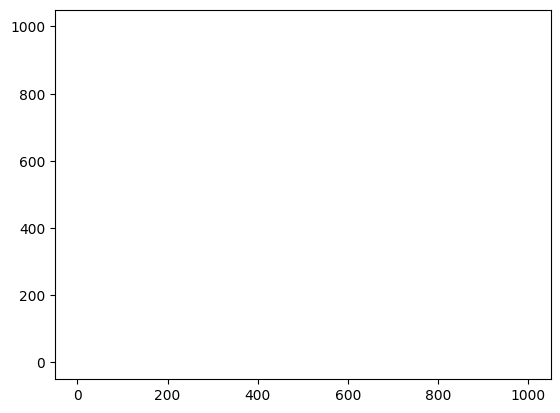

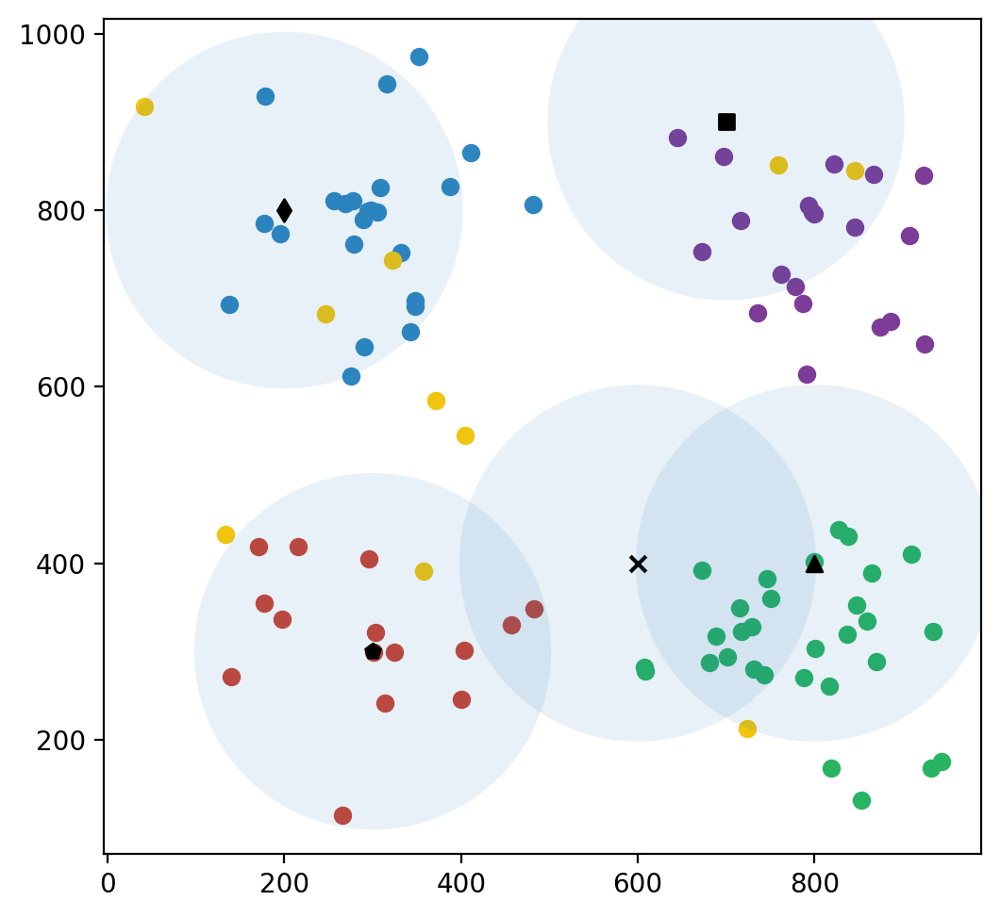

Number of user connected in  590  episode is:  81
591
592
593
594
595
596
597
598
599
600
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 3.  , 2.  , 0.  , 0.15, 2.  , 3.  , 0.

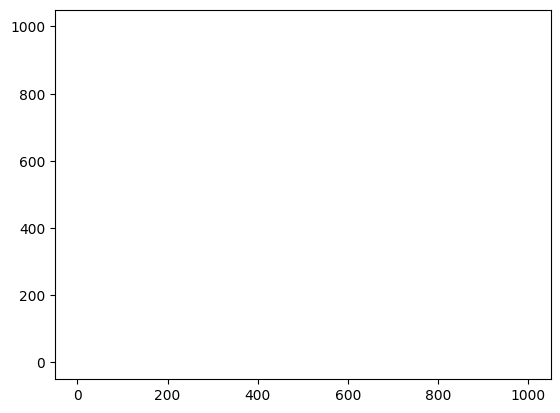

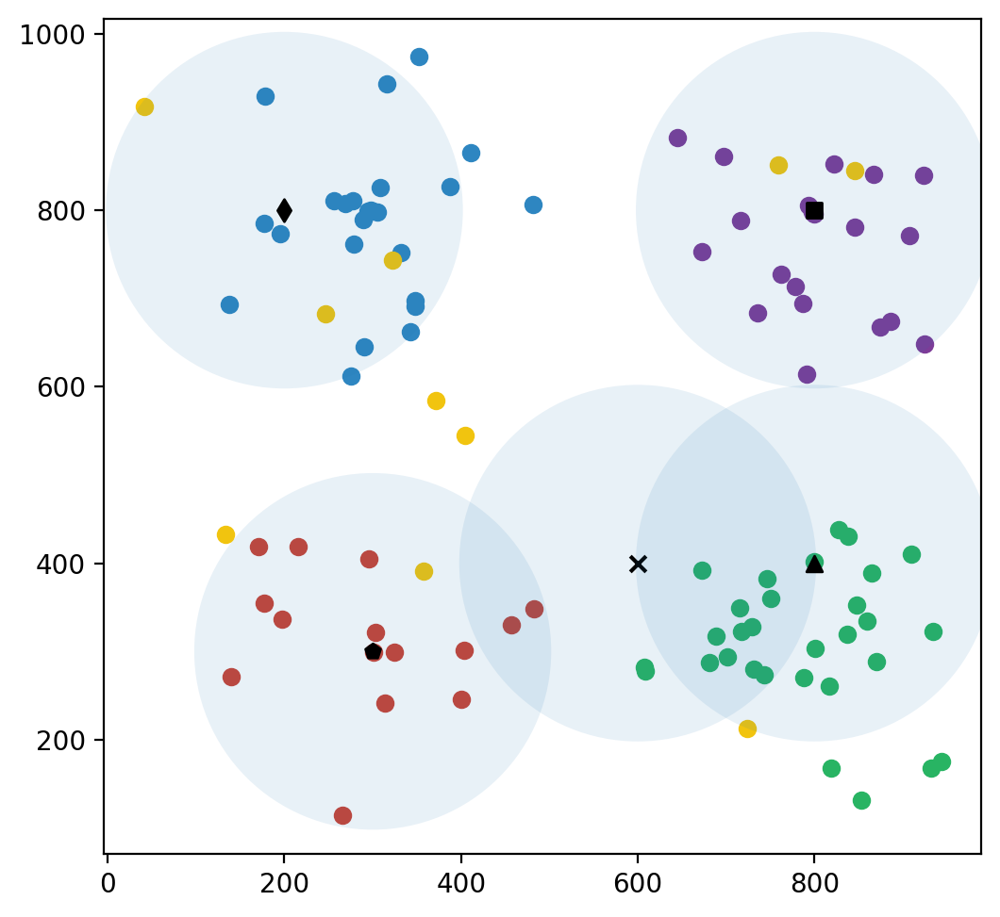

Number of user connected in  600  episode is:  87
601
602
603
604
605
606
607
608
609
610
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 2.  , 1.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[4.  , 0.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09, 3.  , 1.  , 0.  ,
        0.09, 4.  , 0.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09]]), array([0.8, 0.8, 0.8, 0.8, 0.8]), False, 'empty', 9)
(array([[4.  , 1.  , 0.3 , 0.15, 3.  , 2.  , 0.3 , 0.15, 4.  , 1.  , 0.3 ,
        0.15, 4.  , 1.  , 0.3 , 0.15, 2.  , 3.  , 0.3 , 0.

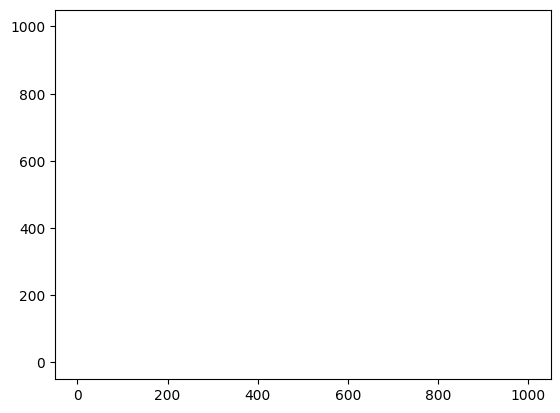

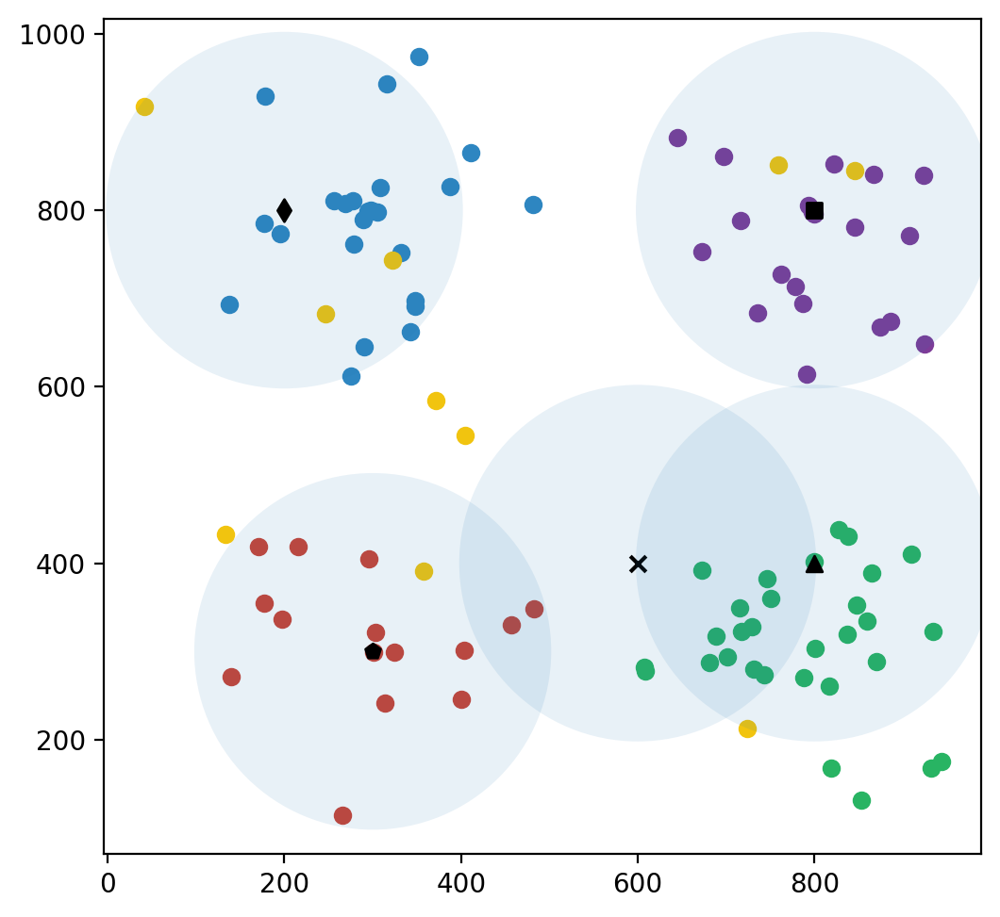

Number of user connected in  610  episode is:  87
611
612
613
614
615
616
617
618
619
620
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[4.  , 1.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 5.  , 0.  , 0.1 , 0.15, 1.  , 4.  , 0.

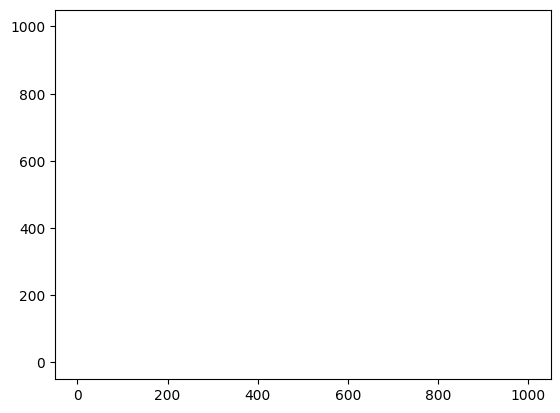

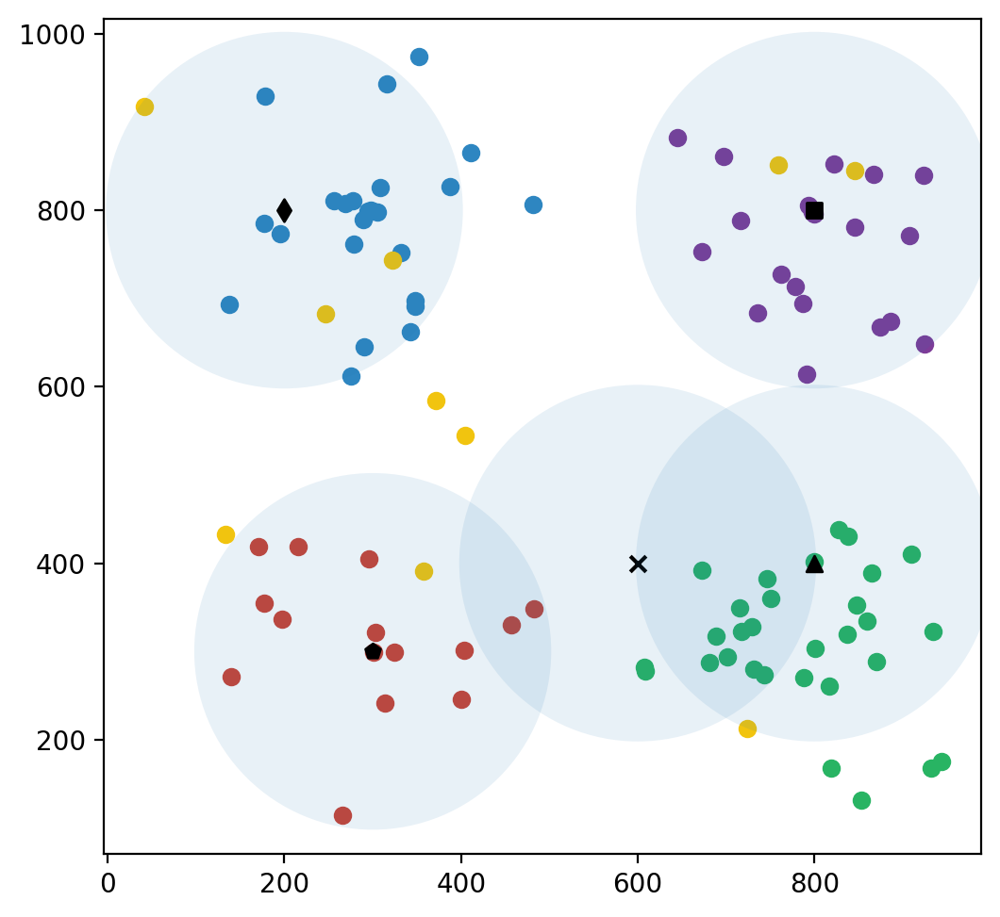

Number of user connected in  620  episode is:  87
621
622
623
624
625
626
627
628
629
630
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 3.  , 0.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 2.  , 2.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 4.  , 0.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 4.  , 1.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.

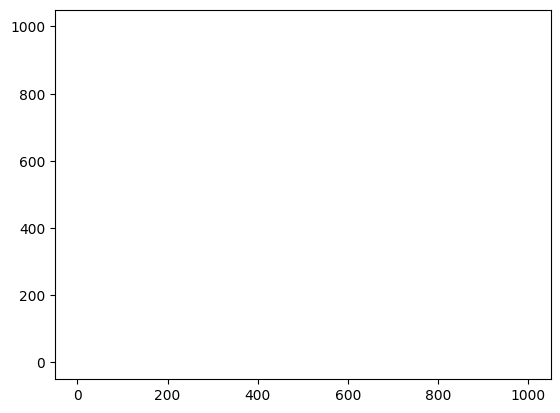

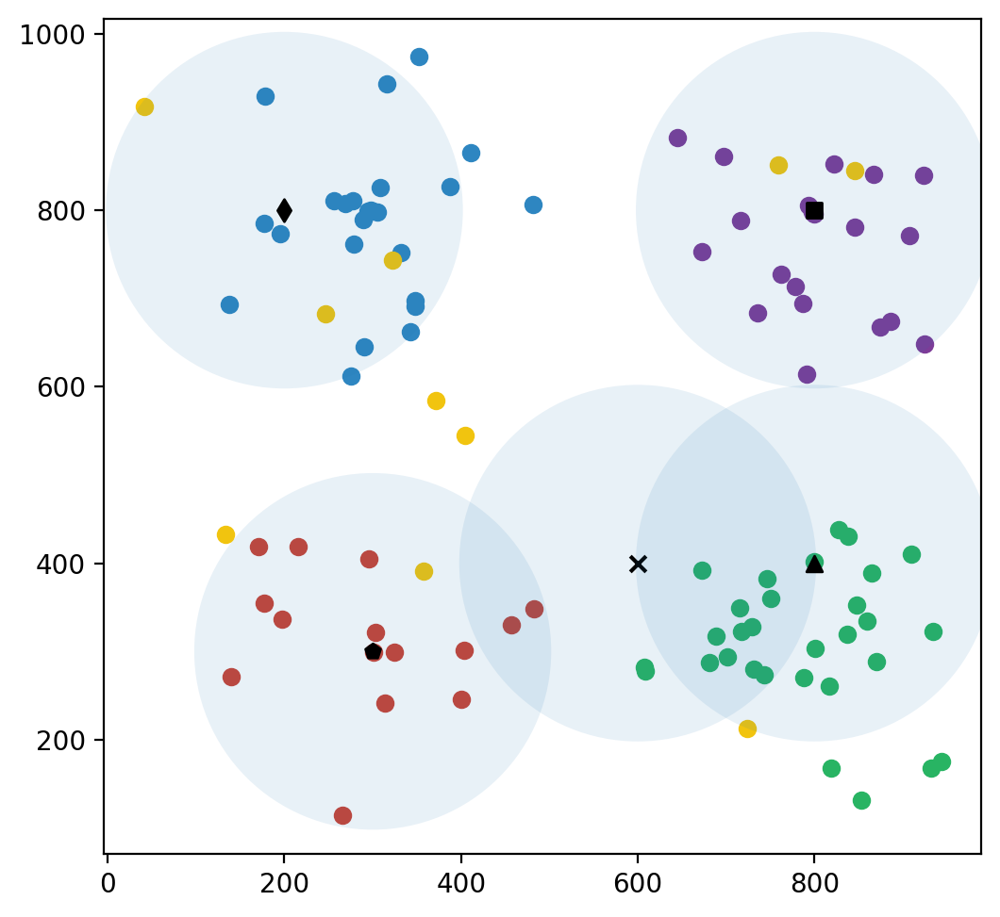

Number of user connected in  630  episode is:  87
631
632
633
634
635
636
637
638
639
640
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 3.  , 0.  , 0.  , 0.05, 3.  , 0.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 3.  , 1.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[2.  , 3.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 5.  , 0.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0

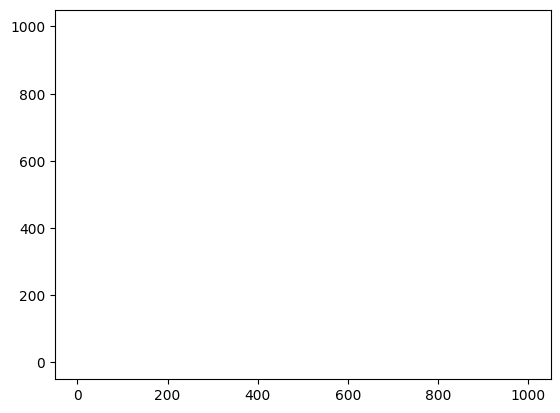

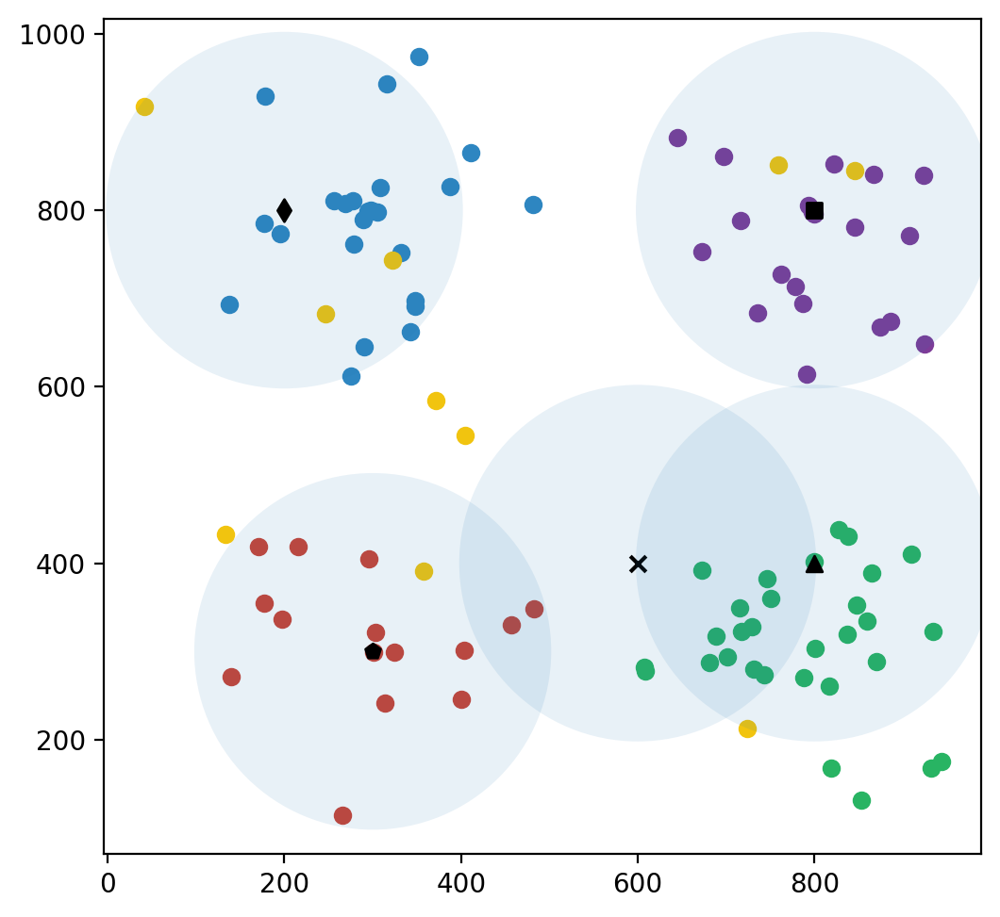

Number of user connected in  640  episode is:  87
641
642
643
644
645
646
647
648
649
650
(array([[0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 0.  , 3.  , 0.  ,
        0.05, 3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  , 0.11, 0.  , 4.  , 0.  ,
        0.11, 4.  , 0.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[2.  , 3.  , 0.1 , 0.15, 3.  , 2.  , 0.1 , 0.15, 0.  , 5.  , 0.1 ,
        0.15, 5.  , 0.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

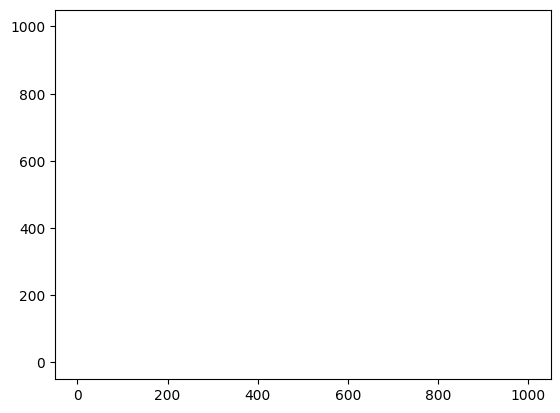

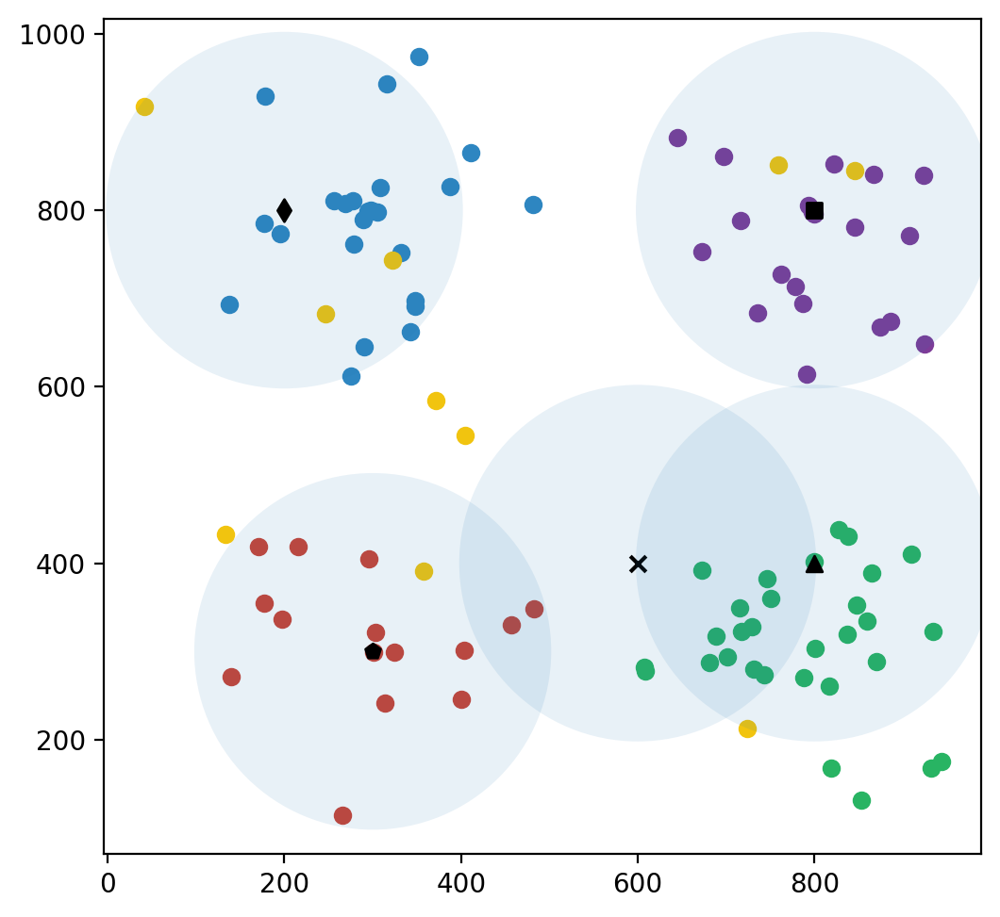

Number of user connected in  650  episode is:  87
651
652
653
654
655
656
657
658
659
660
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.1 , 0.06, 3.  , 0.  , 0.1 , 0.06, 0.  , 3.  , 0.1 ,
        0.06, 3.  , 0.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.        , 2.        , 0.16666667, 0.12      , 3.        ,
        1.        , 0.16666667, 0.12      , 0.        , 4.        ,
        0.16666667, 0.12      , 4.        , 0.        , 0.16666667,
        0.12      , 1.        , 3.        , 0.16666667, 0.12      ]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'emp

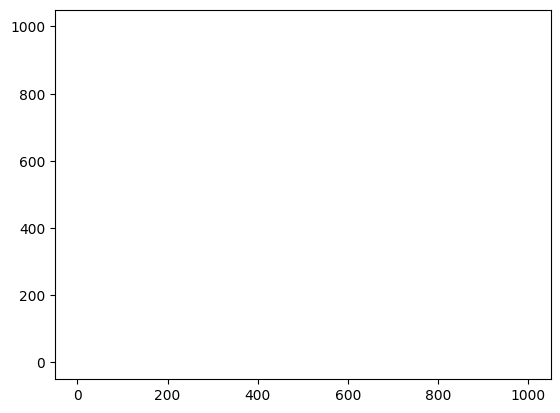

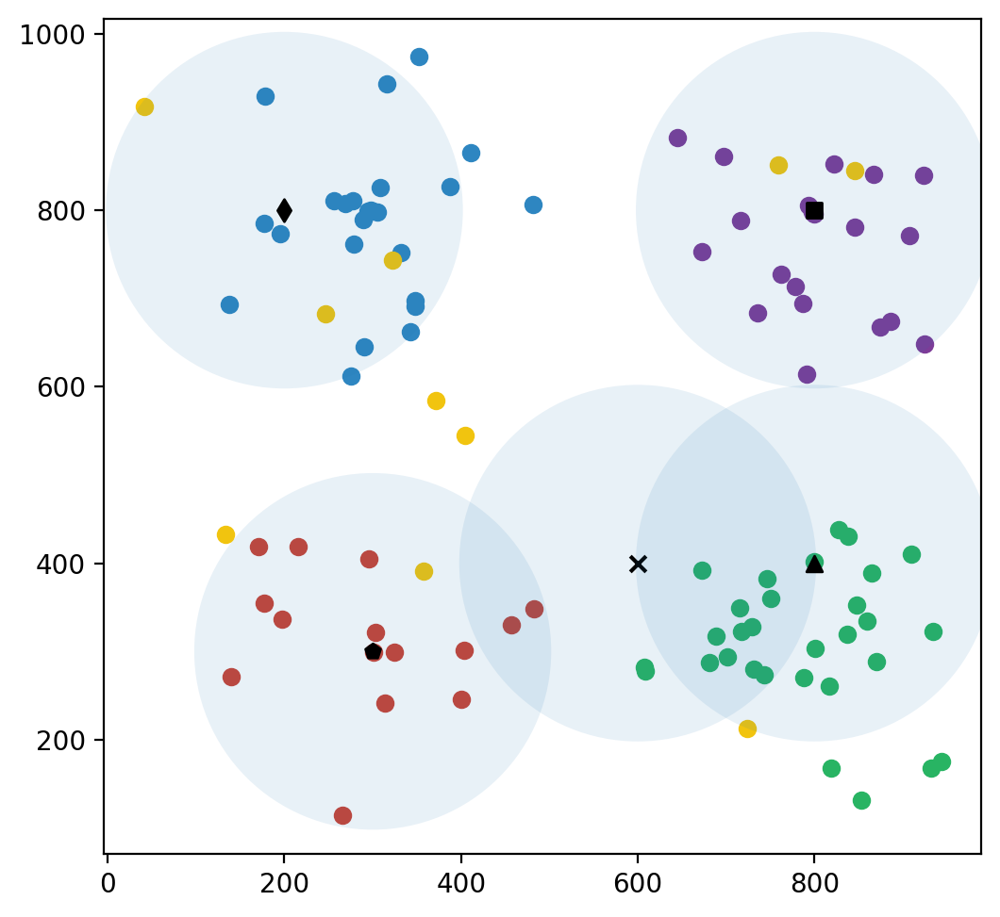

Number of user connected in  660  episode is:  87
661
662
663
664
665
666
667
668
669
670
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.06, 0.  , 3.  , 0.1 , 0.06, 0.  , 3.  , 0.1 ,
        0.06, 2.  , 1.  , 0.1 , 0.06, 1.  , 2.  , 0.1 , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 0.  , 4.  , 0.  ,
        0.11, 2.  , 2.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 4.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.15, 0.  , 5.  , 0.  ,
        0.15, 3.  , 2.  , 0.  , 0.15, 1.  , 4.  , 0.

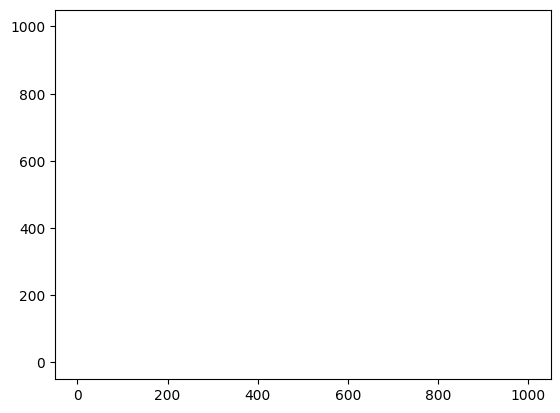

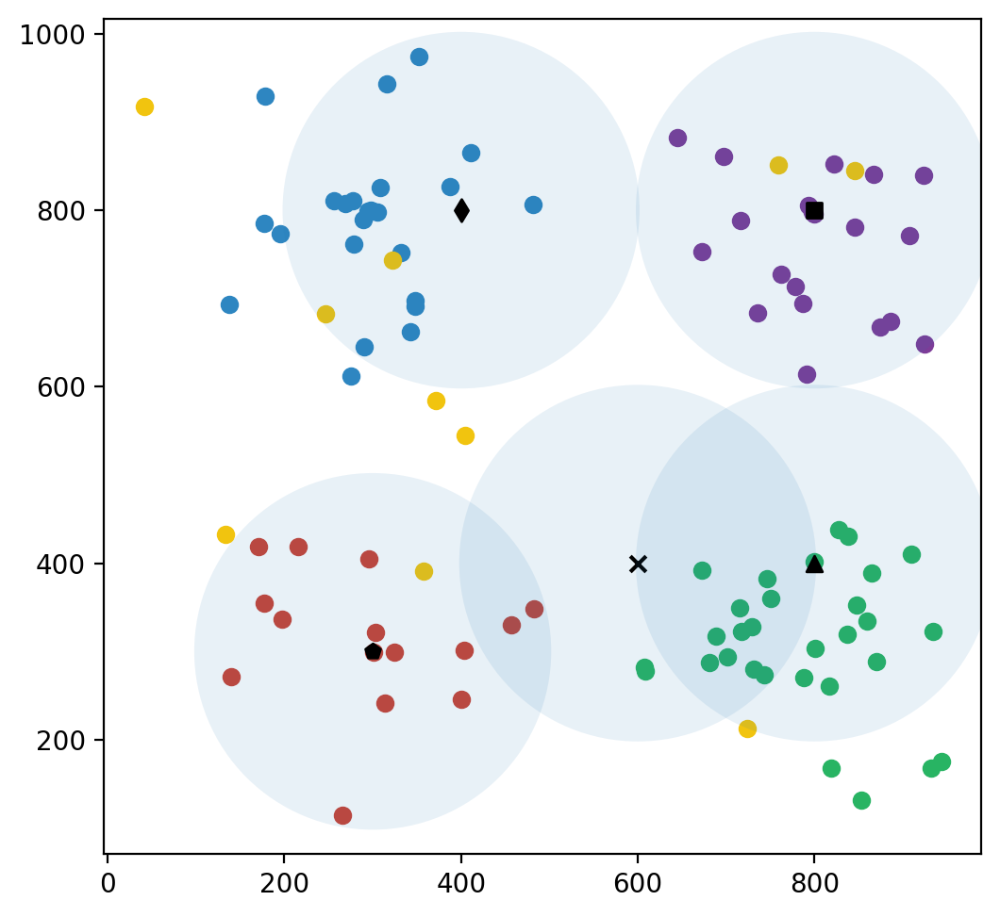

Number of user connected in  670  episode is:  85
671
672
673
674
675
676
677
678
679
680
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.05, 0.  , 3.  , 0.  , 0.05, 0.  , 3.  , 0.  ,
        0.05, 1.  , 2.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[3.  , 1.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 0.  , 4.  , 0.  ,
        0.11, 1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[3.  , 2.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 0.  , 5.  , 0.1 ,
        0.15, 2.  , 3.  , 0.1 , 0.15, 1.  , 4.  , 0.1 , 0

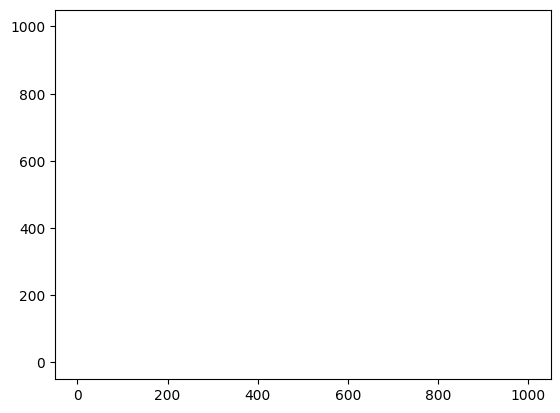

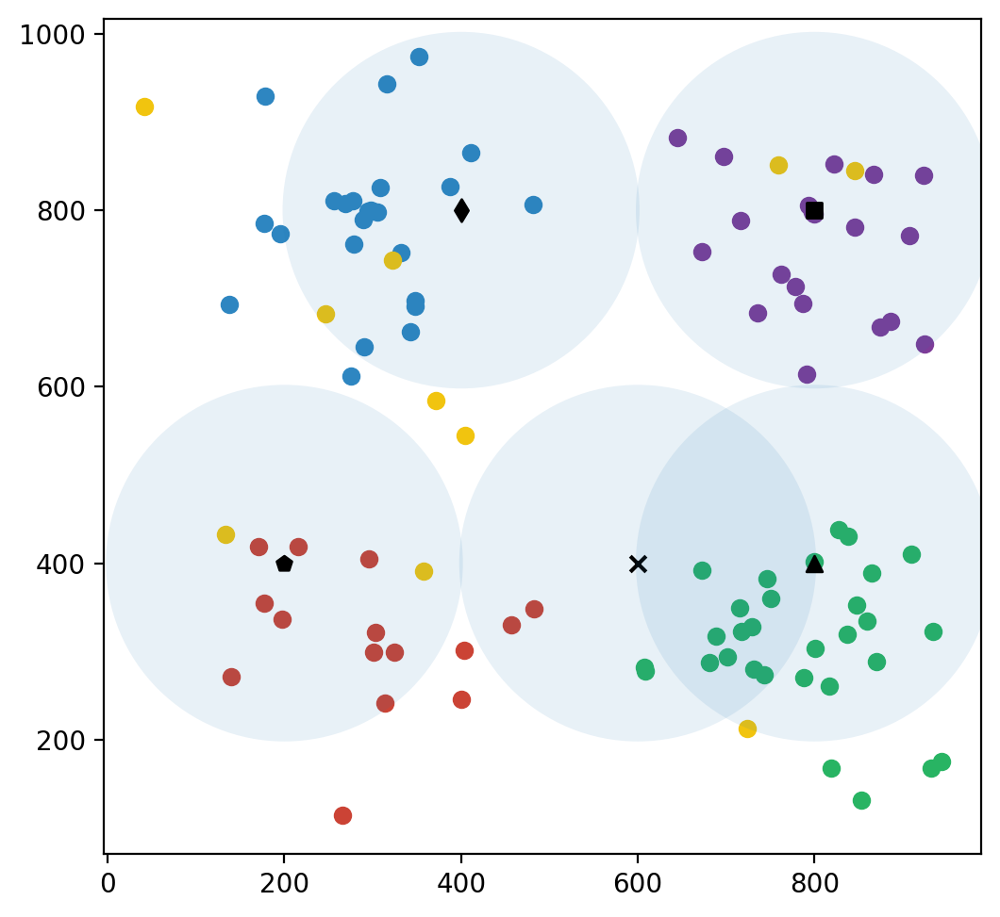

Number of user connected in  680  episode is:  83
681
682
683
684
685
686
687
688
689
690
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12, 3.  , 1.  , 0.  ,
        0.12, 2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[1.  , 4.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 3.  , 2.  , 0.  , 0.15, 1.  , 4.  , 0.

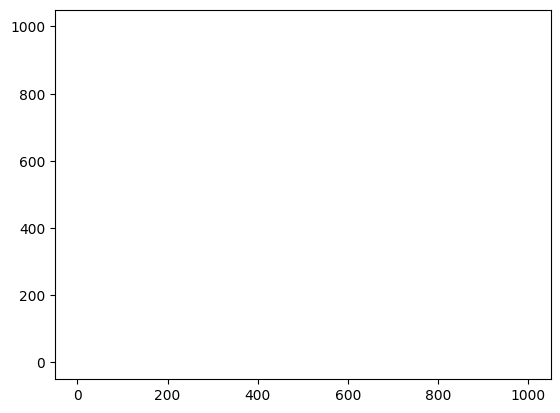

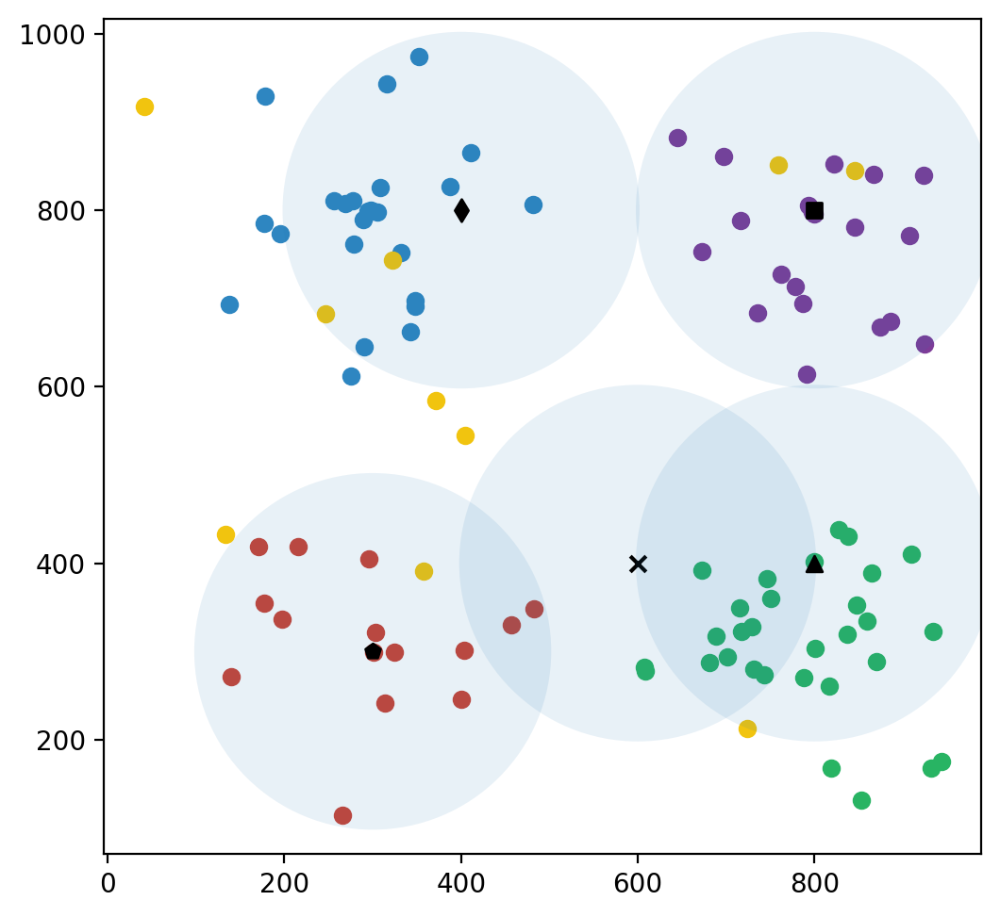

Number of user connected in  690  episode is:  85
691
692
693
694
695
696
697
698
699
700
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 1.  , 2.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 2.  , 2.  , 0.  , 0.11, 4.  , 0.  , 0.  ,
        0.11, 2.  , 2.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 4.  , 0.  , 0.15, 3.  , 2.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 3.  , 2.  , 0.  , 0.15, 1.  , 4.  , 0.

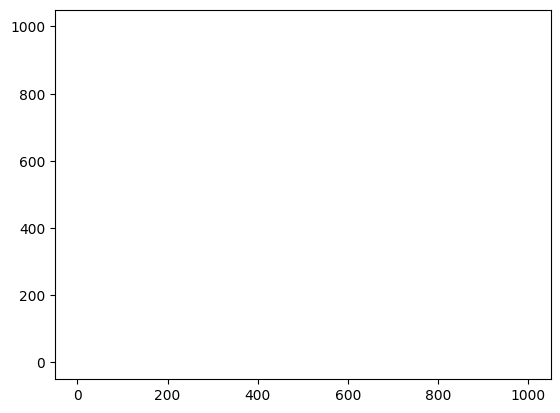

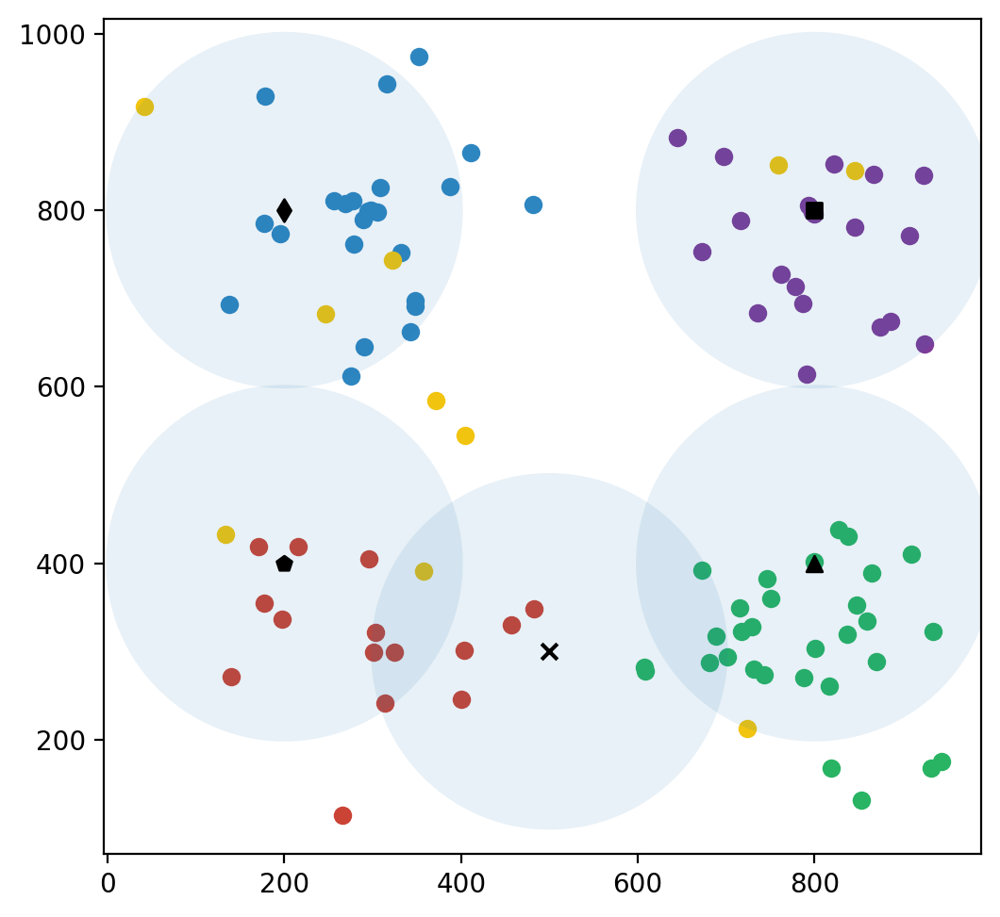

Number of user connected in  700  episode is:  87
701
702
703
704
705
706
707
708
709
710
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 1.  , 1.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 2.  , 1.  , 0.  ,
        0.06, 1.  , 2.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11, 3.  , 1.  , 0.  ,
        0.11, 1.  , 3.  , 0.  , 0.11, 1.  , 3.  , 0.  , 0.11]]), array([1.2, 1.2, 1.2, 1.2, 1.2]), False, 'empty', 11)
(array([[1.  , 4.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 2.  , 3.  , 0.  , 0.15, 1.  , 4.  , 0.

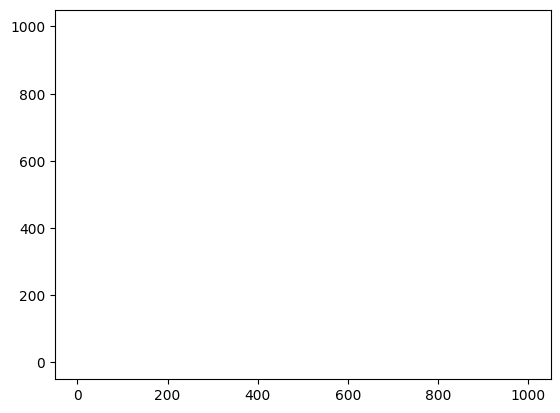

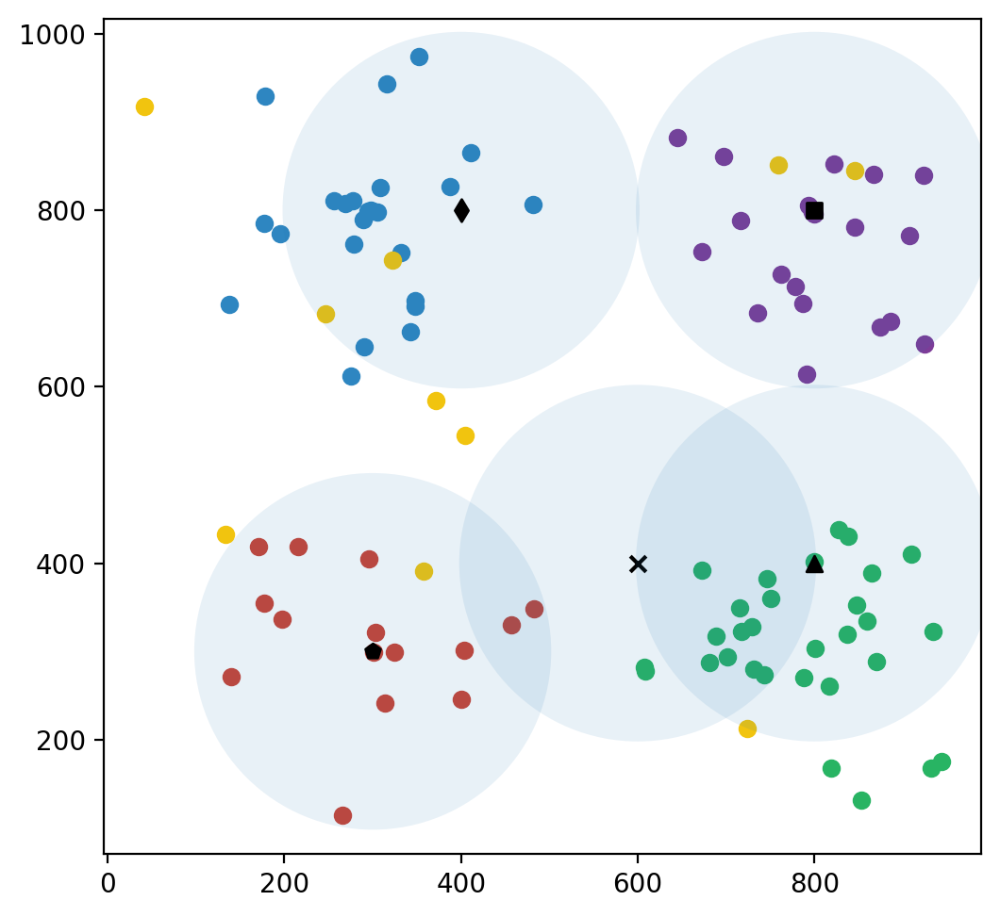

Number of user connected in  710  episode is:  85
711
712
713
714
715
716
717
718
719
720
(array([[1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02, 1.  , 1.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 2.  , 0.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[3.  , 0.  , 0.  , 0.05, 1.  , 2.  , 0.  , 0.05, 2.  , 1.  , 0.  ,
        0.05, 2.  , 1.  , 0.  , 0.05, 2.  , 1.  , 0.  , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[4.  , 0.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09, 3.  , 1.  , 0.  ,
        0.09, 3.  , 1.  , 0.  , 0.09, 2.  , 2.  , 0.  , 0.09]]), array([0.8, 0.8, 0.8, 0.8, 0.8]), False, 'empty', 9)
(array([[4.  , 1.  , 0.3 , 0.15, 3.  , 2.  , 0.3 , 0.15, 4.  , 1.  , 0.3 ,
        0.15, 4.  , 1.  , 0.3 , 0.15, 2.  , 3.  , 0.3 , 0.

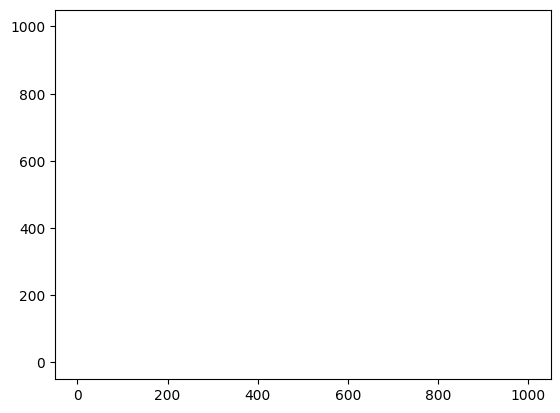

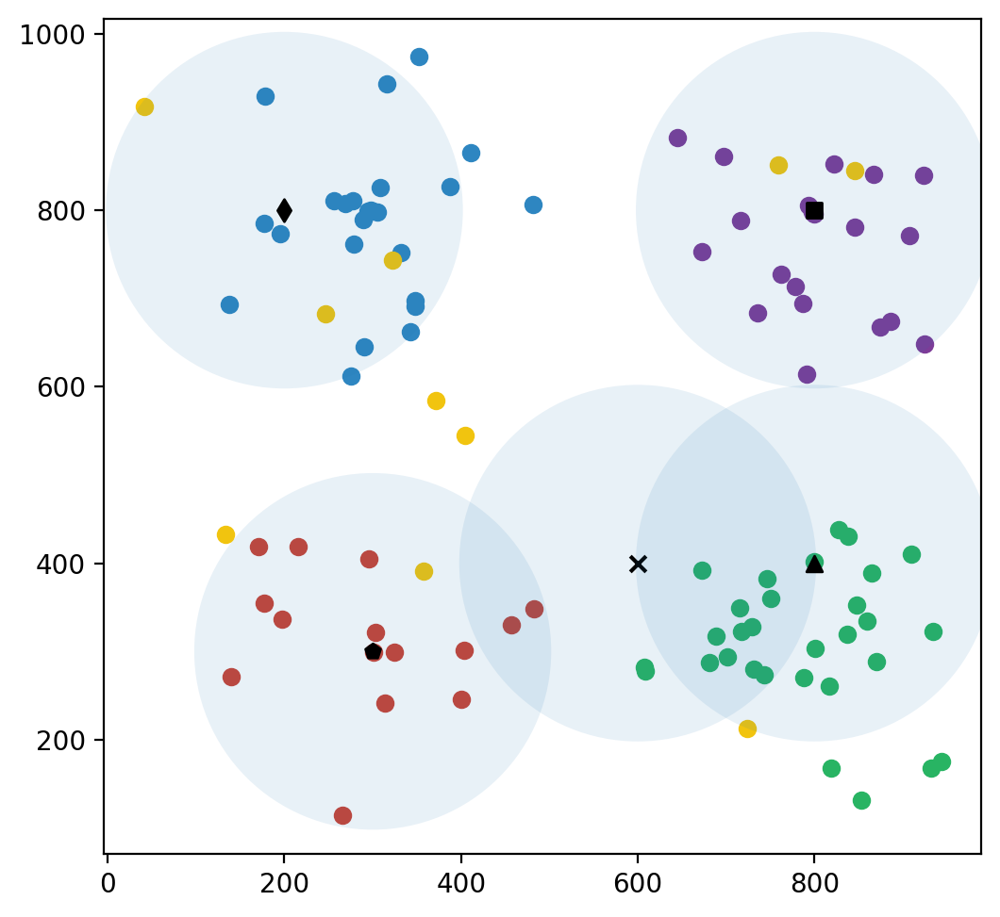

Number of user connected in  720  episode is:  87
721
722
723
724
725
726
727
728
729
730
(array([[1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06, 3.  , 0.  , 0.  ,
        0.06, 2.  , 1.  , 0.  , 0.06, 0.  , 3.  , 0.  , 0.06]]), array([0.2, 0.2, 0.2, 0.2, 0.2]), False, 'empty', 6)
(array([[2.  , 2.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12, 4.  , 0.  , 0.  ,
        0.12, 3.  , 1.  , 0.  , 0.12, 1.  , 3.  , 0.  , 0.12]]), array([1.4, 1.4, 1.4, 1.4, 1.4]), False, 'empty', 12)
(array([[3.  , 2.  , 0.1 , 0.15, 2.  , 3.  , 0.1 , 0.15, 5.  , 0.  , 0.1 ,
        0.15, 4.  , 1.  , 0.1 , 0.15, 1.  , 4.  , 0.

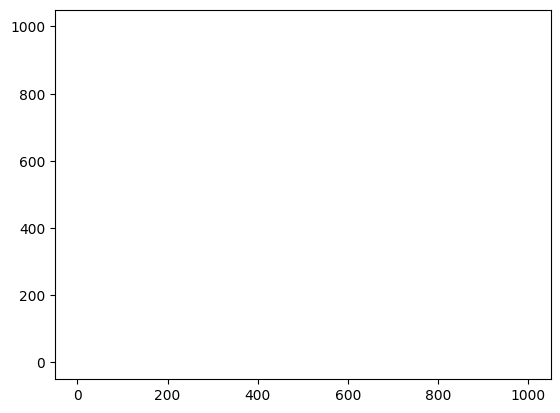

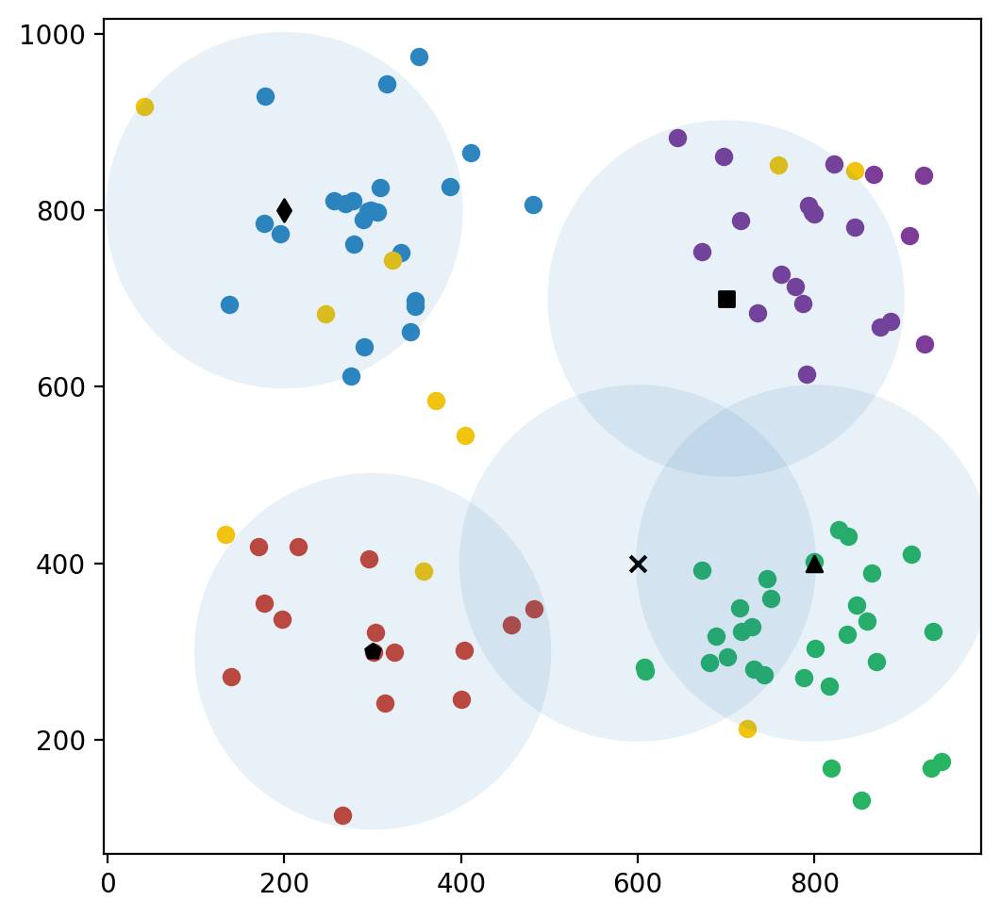

Number of user connected in  730  episode is:  84
731
732
733
734
735
736
737
738
739
740
(array([[0.  , 1.  , 0.  , 0.01, 0.  , 1.  , 0.  , 0.01, 1.  , 0.  , 0.  ,
        0.01, 1.  , 0.  , 0.  , 0.01, 1.  , 0.  , 0.  , 0.01]]), array([-0.8, -0.8, -0.8, -0.8, -0.8]), False, 'empty', 1)
(array([[0.  , 2.  , 0.  , 0.02, 0.  , 2.  , 0.  , 0.02, 2.  , 0.  , 0.  ,
        0.02, 2.  , 0.  , 0.  , 0.02, 1.  , 1.  , 0.  , 0.02]]), array([-0.6, -0.6, -0.6, -0.6, -0.6]), False, 'empty', 2)
(array([[0.  , 3.  , 0.1 , 0.05, 0.  , 3.  , 0.1 , 0.05, 3.  , 0.  , 0.1 ,
        0.05, 3.  , 0.  , 0.1 , 0.05, 1.  , 2.  , 0.1 , 0.05]]), array([0., 0., 0., 0., 0.]), False, 'empty', 5)
(array([[1.  , 3.  , 0.  , 0.08, 1.  , 3.  , 0.  , 0.08, 4.  , 0.  , 0.  ,
        0.08, 4.  , 0.  , 0.  , 0.08, 1.  , 3.  , 0.  , 0.08]]), array([0.6, 0.6, 0.6, 0.6, 0.6]), False, 'empty', 8)
(array([[1.  , 4.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.15, 4.  , 1.  , 0.  ,
        0.15, 5.  , 0.  , 0.  , 0.15, 2.  , 3.  , 0.  , 0.

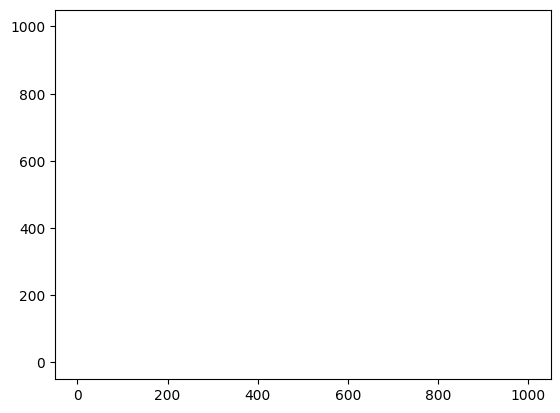

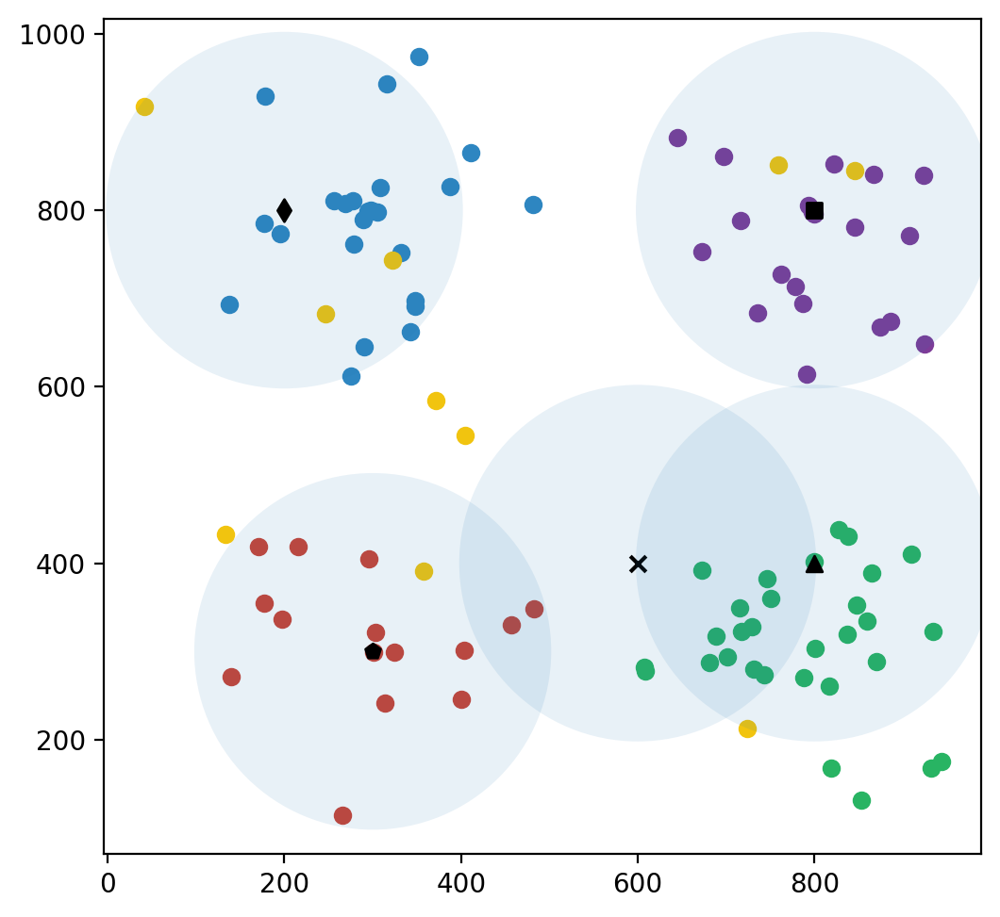

Number of user connected in  740  episode is:  87
741
742
743
744
745
746
747
748
749


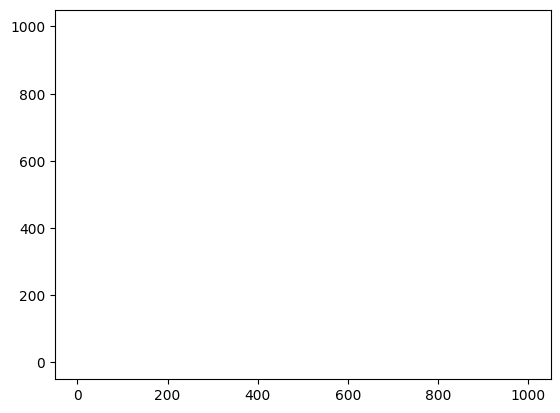

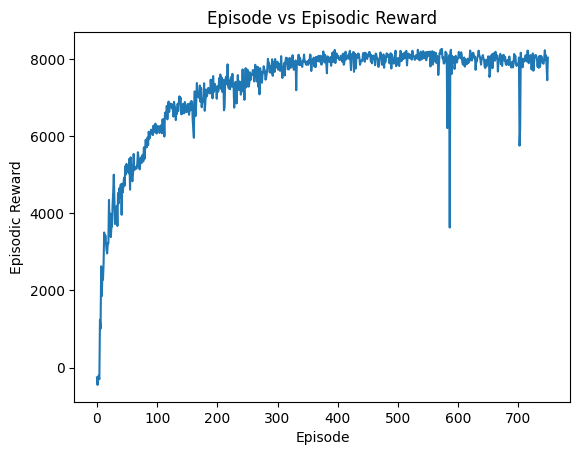

<ipython-input-2-d59d4b4f62f0>:10: DeprecationWarning: loadtxt(): Parsing an integer via a float is deprecated.  To avoid this warning, you can:
    * make sure the original data is stored as integers.
    * use the `converters=` keyword argument.  If you only use
      NumPy 1.23 or later, `converters=float` will normally work.
    * Use `np.loadtxt(...).astype(np.int64)` parsing the file as
      floating point and then convert it.  (On all NumPy versions.)
  (Deprecated NumPy 1.23)
  USER_LOC = np.loadtxt('UserLocationNew.txt', dtype=np.int32, delimiter=' ')


<Figure size 640x480 with 0 Axes>

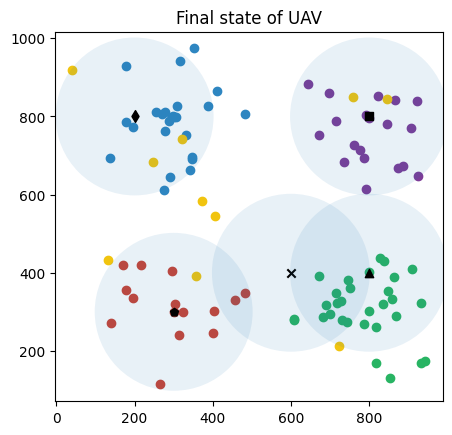

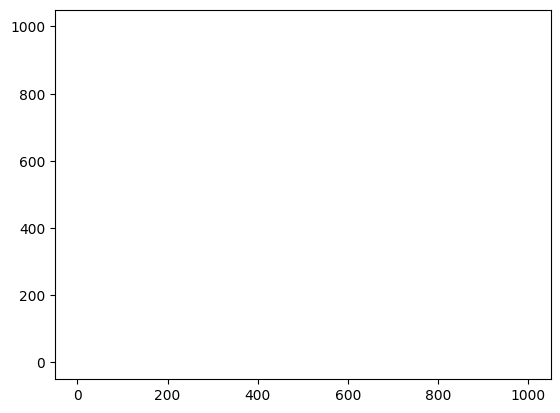

<Figure size 640x480 with 0 Axes>

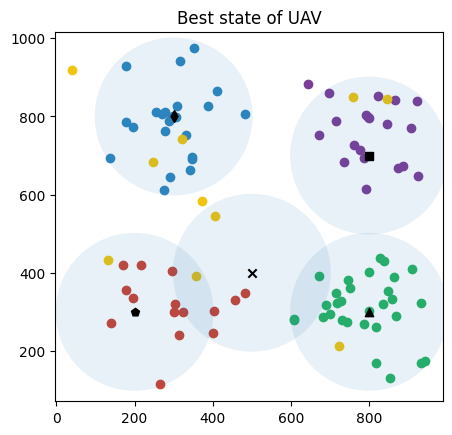

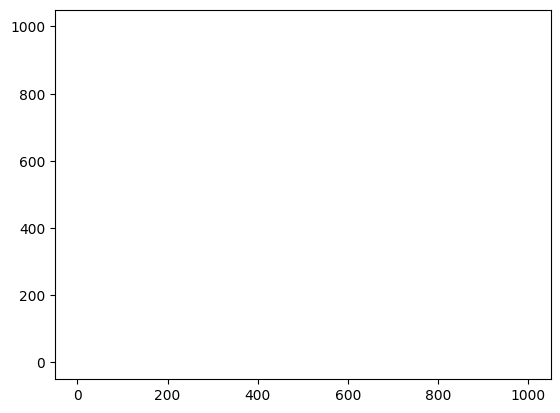

[[6.   4.   0.8  0.87]
 [3.   3.   0.8  0.87]
 [8.   8.   0.8  0.87]
 [8.   4.   0.8  0.87]
 [2.   8.   0.8  0.87]]
Total Connected User in Final Stage 84
Best State
[[5.   4.   0.9  0.93]
 [2.   3.   0.9  0.93]
 [8.   7.   0.9  0.93]
 [8.   3.   0.9  0.93]
 [3.   8.   0.9  0.93]]
Total Connected User (Best Outcome) 93


In [ ]:
# Main Function

from ast import Num
import random
import numpy as np
import math
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
from collections import deque
import torch
from torch import Tensor, nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torch.utils.data.dataset import IterableDataset
import os
from scipy.io import savemat

os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
PATH_DATASETS = os.environ.get("PATH_DATASETS", ".")

SEED = 1
torch.manual_seed(SEED)
np.random.seed(SEED)

## GPU configuration use for faster processing
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
device = "cpu"


# DNN modeling
class NeuralNetwork(nn.Module):
    def __init__(self, state_size, action_size):
        super(NeuralNetwork, self).__init__()
        self.state_size = state_size
        self.action_size = action_size
        self.linear_stack = model = nn.Sequential(
            nn.Linear(self.state_size,400),
            nn.ReLU(),
            nn.Linear(400,400),
            nn.ReLU(),
            nn.Linear(400, self.action_size)
        ).to(device=device)

    def forward(self, x):
        x = x.to(device)
        Q_values = self.linear_stack(x)
        return Q_values

class DQL:
    # Initializing a Deep Neural Network
    def __init__(self):
        self.state_size = 4
        self.action_size = 5
        self.replay_buffer = deque(maxlen = 125000)
        self.gamma = discount_factor
        self.epsilon = epsilon
        self.learning_rate = alpha
        self.main_network = NeuralNetwork(self.state_size, self.action_size).to(device)
        self.target_network = NeuralNetwork(self.state_size, self.action_size).to(device)
        self.target_network.load_state_dict(self.main_network.state_dict())
        self.optimizer = torch.optim.Adam(self.main_network.parameters(), lr = self.learning_rate)
        self.loss_func = nn.SmoothL1Loss()      # Huber Loss // Combines MSE and MAE
        self.steps_done = 0

    # Storing information of individual UAV information in their respective buffer
    def store_transition(self, state, action, reward, next_state, done):
        self.replay_buffer.append((state, action, reward, next_state, done))


    # Deployment of epsilon greedy policy
    def epsilon_greedy(self, state):
        temp = random.random()
        self.steps_done += 1
        if temp <= self.epsilon:
            action = torch.tensor([[np.random.randint(0, 4)]], device = device, dtype = torch.long)
        else:
            state = torch.unsqueeze(torch.FloatTensor(state),0)
            Q_values = self.main_network(state)
            action = Q_values.max(1)[1].view(1,1)
        return action

    # Training of the DNN
    def train(self,batch_size):
      minibatch = random.sample(self.replay_buffer, batch_size)
      minibatch = np.array(minibatch, dtype = object)
      minibatch = minibatch.reshape(batch_size,5)
      state = torch.FloatTensor(np.vstack(minibatch[:,0]))
      action = torch.LongTensor(np.vstack(minibatch[:,1]))
      reward = torch.FloatTensor(np.vstack(minibatch[:,2]))
      next_state = torch.FloatTensor(np.vstack(minibatch[:,3]))
      done = torch.Tensor(np.vstack(minibatch[:,4]))
      state = state.to(device = device)
      action = action.to(device = device)
      reward = reward.to(device = device)
      next_state = next_state.to(device = device)
      done = done.to(device = device)

      Q_next = self.target_network(next_state).detach()
      target_Q = reward.cpu().squeeze() + self.gamma * Q_next.cpu().max(1)[0].view(batch_size, 1).squeeze() * (
                1 - np.array([state[e].cpu().mean() == next_state[e].cpu().mean() for e in range(len(next_state))])
            )

      # Forward
      # Loss calculation based on loss function
      target_Q = target_Q.float()
      Q_main = self.main_network(state).gather(1, action).squeeze()
      loss = self.loss_func(target_Q.cpu().detach(), Q_main.cpu())
      # Backward
      self.optimizer.zero_grad()
      loss.backward()
      # For gradient clipping
      for param in self.main_network.parameters():
          param.grad.data.clamp_(-1,1)
      # Gradient descent
      self.optimizer.step()


u_env = UAVenv()
GRID_SIZE = u_env.GRID_SIZE
NUM_UAV = u_env.NUM_UAV
NUM_USER = u_env.NUM_USER
num_episode = 750
num_epochs = 100
discount_factor = 0.95
alpha = 3.5e-4
batch_size = 512
update_rate = 10  #50
epsilon = 0.10
random.seed(SEED)



# Keeping track of the episode reward
episode_reward = np.zeros(num_episode)
episode_user_connected = np.zeros(num_episode)

fig = plt.figure()
gs = GridSpec(1, 1, figure=fig)
ax1 = fig.add_subplot(gs[0:1, 0:1])

#creating object for 5 UAVs
UAV_OB = [None, None, None, None, None]


for k in range(NUM_UAV):
            UAV_OB[k] = DQL()
best_result = 0

for i_episode in range(num_episode):
    print(i_episode)

    # Environment reset and get the states
    u_env.reset()

    # Get the initial states
    states = u_env.get_state()
    reward = np.zeros(NUM_UAV)


    for t in range(num_epochs):
        drone_act_list = []
        # Update the target network
        for k in range(NUM_UAV):
            if t % update_rate == 0:
                UAV_OB[k].target_network.load_state_dict(UAV_OB[k].main_network.state_dict())

        # Determining the actions for all drones
        states_ten = torch.from_numpy(states)
        for k in range(NUM_UAV):
            state = states_ten[k, :]
            action = UAV_OB[k].epsilon_greedy(state.float())
            drone_act_list.append(action)


        # Find the global reward for the combined set of actions for the UAV
        temp_data = u_env.step(drone_act_list, reward)
        reward = temp_data[1]
        done = temp_data[2]
        next_state = u_env.get_state()

        # Store the transition information
        for k in range(NUM_UAV):
            ## Storing of the information on the individual UAV and it's reward value in itself.
            state = states_ten[k, :]
            action = drone_act_list[k]
            next_sta = next_state[k, :]
            reward_ind = reward[k]
            UAV_OB[k].store_transition(state, action, reward_ind, next_sta, done)

        # Calculation of the total episodic reward of all the UAVs
        # Calculation of the total number of connected User for the combination of all UAVs
        episode_reward[i_episode] += sum(reward)
        episode_user_connected[i_episode] += temp_data[4]

        states = next_state

        for k in range(NUM_UAV):
            if len(UAV_OB[k].replay_buffer) > batch_size:
                UAV_OB[k].train(batch_size)


    if i_episode % 10 == 0:
        # Reset of the environment
        u_env.reset()
        # Get the states
        states = u_env.get_state()
        for t in range(100):
            drone_act_list = []
            for k in range(NUM_UAV):
                state = states[k,:]
                state = torch.unsqueeze(torch.FloatTensor(state),0)
                Q_values = UAV_OB[k].main_network.forward(state.float())
                best_next_action = torch.max(Q_values.cpu(), 1)[1].data.numpy()
                best_next_action = best_next_action[0]
                drone_act_list.append(best_next_action)
            temp_data = u_env.step(drone_act_list, reward)
            print(temp_data)
            states = u_env.get_state()
            states_fin = states
            if best_result < temp_data[4]:
                best_result = temp_data[4]
                best_state = states

        u_env.render(ax1)
        print("Number of user connected in ",i_episode," episode is: ", temp_data[4])


# Plot the accumulated reward vs episodes
fig = plt.figure()
plt.plot(range(0, num_episode), episode_reward)
plt.xlabel("Episode")
plt.ylabel("Episodic Reward")
plt.title("Episode vs Episodic Reward")
plt.show()

fig = plt.figure()
final_render(states_fin, "final")
fig = plt.figure()
final_render(best_state, "best")
print(states_fin)
print('Total Connected User in Final Stage', temp_data[4])
print("Best State")
print(best_state)
print("Total Connected User (Best Outcome)", best_result)